# Table of Contents

* [Imports](#imports)
* [System](#system-data)
* [Section](#section-data)
* [OD](#od-data)
* [Emissions](#emissions)
* [HCM](#hcm-trajectory-analysis)
* [Rgap](#rgap)

<a id='imports'></a>
# Imports

In [1]:
import datetime
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import seaborn as sns
sns.set_theme()

import postprocessing_util
import postprocessing_plot_util
import simulation_config_utils

module_path = os.path.abspath(os.path.join('..', 'utils'))
if module_path not in sys.path:
    sys.path.append(module_path)

import aimsun_config_utils
import aimsun_folder_utils
import aimsun_input_utils
import metadata_settings

In [2]:
# Get time intervals of study.
TIME_INTERVALS = metadata_settings.get_time_intervals()
TIME_INTERVALS_STRING = [str(time)[:-3] for time in TIME_INTERVALS]

In [3]:
# Loading the macrosimulation config. It is assumed that the simulation has been run inside Aimsun.
# We get the simulation data in the database associated to the simulation in the config.
database_path = "C:\\Users\\prest\\Dropbox\\Fremont project\\Aimsun\\Outputs\\Microsimulations\\Databases\\preston_220914"

uncoordinated_simulation_database_path = f"{database_path}\\uncoordinated.sqlite"
uncoordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(uncoordinated_simulation_database_path)

coordinated_simulation_database_path = f"{database_path}\\coordinated.sqlite"
coordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(coordinated_simulation_database_path)

In [4]:
# Select metric to compute.
# Here it is an example of delay time.
metric_name, metric_units = 'average delay time', 's'
uncoordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

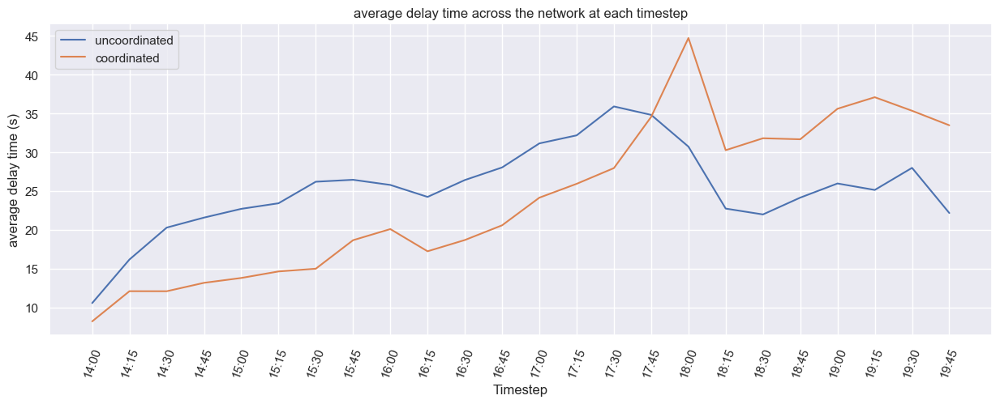

In [5]:
# from matplotlib import rc
# rc('font', **{'family': 'sans-serif', 'sans-serif': ['Computer Modern Sans Serif'], 'size': 20})
# rc('text', usetex=True)

fig = plt.figure(figsize=(15, 5))
plt.title(f"{metric_name} across the network at each timestep")
plt.xlabel("Timestep")
plt.ylabel(f"{metric_name} ({metric_units})")
plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label='uncoordinated')
plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label='coordinated')
plt.legend(loc="upper left")
plt.xticks(rotation=70)
plt.show()

In [6]:
class Column:
    def __init__(self, name, desc, unit):
        self.name = name
        self.desc = desc
        self.unit = unit

    def __repr__(self) -> str:
        return f'Column({str(self.name)}, {str(self.desc)}, {str(self.unit)})'

In [7]:
from datetime import datetime
today = datetime.now().strftime("%Y-%m-%d")
image_path = f'C:\\Users\\prest\\Preston\\Berkeley\\fremont_project\\images\\{today}'

if not os.path.exists(image_path):
    os.makedirs(image_path)

<a id='system'></a>
# System Data

In [8]:
import pandas as pd

uncoordinated_con = uncoordinated_simulation_results_database.database
uncoordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', uncoordinated_con)
uncoordinated_sys_df = pd.DataFrame(uncoordinated_sys_query)

uncoordinated_sys_df.head()

,did,oid,eid,sid,ent,density,density_D,flow,flow_D,input_flow,...,stime,stime_D,nstops,nstops_D,totalNStops,totalNStops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151642198,None,0,1,1.761359,-1.0,8440.0,-1.0,14052.0,...,5.797138,13.853809,0.0,-1.0,1748.0,-1.0,1114.545137,-1.0,0.0,-1.0
1,151642198,151642198,None,1,1,0.495877,-1.0,2196.0,-1.0,3848.0,...,18.485671,21.170920,0.0,-1.0,1325.0,-1.0,310.807815,-1.0,0.0,-1.0
2,151642198,151642198,None,2,1,1.265483,-1.0,6244.0,-1.0,10204.0,...,1.334611,5.043652,0.0,-1.0,423.0,-1.0,803.737322,-1.0,0.0,-1.0
3,151642198,151642198,None,0,2,2.734878,-1.0,13840.0,-1.0,15464.0,...,8.975247,16.951414,0.0,-1.0,5740.0,-1.0,2070.230032,-1.0,0.0,-1.0
4,151642198,151642198,None,1,2,0.795732,-1.0,3932.0,-1.0,4380.0,...,21.443692,23.666571,0.0,-1.0,3170.0,-1.0,655.277797,-1.0,0.0,-1.0


In [9]:
coordinated_con = coordinated_simulation_results_database.database
coordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', coordinated_con)
coordinated_sys_df = pd.DataFrame(coordinated_sys_query)

coordinated_sys_df.head()

,did,oid,eid,sid,ent,density,density_D,flow,flow_D,input_flow,...,stime,stime_D,nstops,nstops_D,totalNStops,totalNStops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151642198,None,0,1,1.693082,-1.0,8760.0,-1.0,14052.0,...,3.698887,10.111692,0.0,-1.0,1654.0,-1.0,1124.547200,-1.0,0.0,-1.0
1,151642198,151642198,None,1,1,0.433417,-1.0,2480.0,-1.0,3848.0,...,9.809884,16.023965,0.0,-1.0,1214.0,-1.0,319.511805,-1.0,0.0,-1.0
2,151642198,151642198,None,2,1,1.259665,-1.0,6280.0,-1.0,10204.0,...,1.285627,4.556932,0.0,-1.0,440.0,-1.0,805.035396,-1.0,0.0,-1.0
3,151642198,151642198,None,0,2,2.497132,-1.0,14580.0,-1.0,15464.0,...,5.643160,9.710035,0.0,-1.0,5239.0,-1.0,2101.435204,-1.0,0.0,-1.0
4,151642198,151642198,None,1,2,0.668329,-1.0,4092.0,-1.0,4380.0,...,11.871201,12.977442,0.0,-1.0,2689.0,-1.0,604.724585,-1.0,0.0,-1.0


In [10]:
sys_columns = {
    'sid': Column('sid', 'Vehicle type', None),
    'ent': Column('ent', 'Time interval', None),
    'density': Column('density', 'Density', 'veh/km'),
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's/km'),
    'dtime': Column('dtime', 'Mean delay time', 's/km'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'qmean': Column('qmean', 'Mean vehicles in queue', 'veh'),
    'fuelc': Column('fuelc', 'Total fuel consumed', 'L'),                    # not displayed yet; pending sim run
    'batteryc': Column('batteryc', 'Total battery consumed', 'kWh')          # likewise
}

sys_column_names = sys_columns.keys()
group_columns = ['sid', 'ent']

uncoordinated_sys_df = uncoordinated_sys_df[sys_column_names]
coordinated_sys_df = coordinated_sys_df[sys_column_names]

sys_df = uncoordinated_sys_df.merge(coordinated_sys_df, on=group_columns, suffixes=['_uncoordinated', '_coordinated'])
sys_df = sys_df[(sys_df['sid']==0) & (sys_df['ent']!=0)].drop('sid', axis=1)
sys_df

,ent,density_uncoordinated,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,qmean_uncoordinated,fuelc_uncoordinated,batteryc_uncoordinated,density_coordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,qmean_coordinated,fuelc_coordinated,batteryc_coordinated
0,1,1.761359,8440.0,50.096176,10.546274,80.880735,95.280889,1114.545137,0.0,1.693082,8760.0,47.804989,8.187263,82.034641,61.329778,1124.547200,0.0
3,2,2.734878,13840.0,56.672180,16.166451,73.527277,262.134222,2070.230032,0.0,2.497132,14580.0,52.623929,12.078871,75.524855,126.564444,2101.435204,0.0
6,3,2.998710,14896.0,60.903016,20.282287,70.819805,353.136889,2441.055931,0.0,2.516465,15048.0,52.508182,12.073094,75.725359,132.271111,2270.267825,0.0
9,4,3.283599,15280.0,62.791031,21.570878,69.524337,425.574222,2473.084385,0.0,2.684697,15572.0,54.073114,13.158075,74.139911,164.224889,2318.080838,0.0
12,5,3.323521,15348.0,64.293321,22.700916,68.852711,441.211556,2557.055519,0.0,2.668571,15392.0,54.902333,13.785544,73.818979,177.252444,2326.040487,0.0
15,6,3.578332,16212.0,65.464581,23.419646,67.822963,490.344000,2757.601012,0.0,2.851818,16504.0,56.118657,14.627753,72.598204,186.642667,2549.344155,0.0
18,7,3.671238,15784.0,68.438373,26.198510,65.768645,524.604444,2727.771588,0.0,2.907366,15604.0,56.615134,14.979349,71.822943,220.020444,2436.898652,0.0
21,8,3.904245,16728.0,69.034079,26.449397,63.684530,526.380444,2990.854834,0.0,3.214460,16596.0,60.659380,18.655416,67.944723,293.783111,2665.817594,0.0
24,9,3.578512,16304.0,68.296675,25.783571,63.686496,447.694222,2984.282635,0.0,3.065151,15924.0,61.721648,20.091513,67.089618,265.257778,2611.484727,0.0
27,10,3.625641,15272.0,66.581688,24.239680,65.551838,473.907556,2714.874716,0.0,3.039545,16004.0,58.960828,17.226667,69.465972,249.379556,2576.017388,0.0


In [11]:
sys_columns = np.reshape(list(sys_columns.values())[2:], (4, 2))
sys_columns

array([[Column(density, Density, veh/km), Column(flow, Mean flow, veh/h)],
       [Column(ttime, Mean travel time, s/km),
        Column(dtime, Mean delay time, s/km)],
       [Column(speed, Mean speed, km/h),
        Column(qmean, Mean vehicles in queue, veh)],
       [Column(fuelc, Total fuel consumed, L),
        Column(batteryc, Total battery consumed, kWh)]], dtype=object)

See [sys-hcm graphs](#patched-syshcm-graphs)

In [12]:
# fig, axs = plt.subplots(4, 2, figsize=(20, 25))
# fig.suptitle('System-wide metrics over time')
# print(sys_columns)
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], sys_columns[i][j]
#         ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
#         ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_coordinated'], label='coordinated')
#         ax.set_title(f'{metric.desc} across the network over time')
#         ax.set_xlabel('Time')
#         ax.set_ylabel(f'{metric.name} ({metric.unit})')
#         ax.legend(loc="upper left")
#         ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

<a id='section'></a>
# Section Data

In [13]:
import pandas as pd

uncoordinated_con = uncoordinated_simulation_results_database.database
uncoordinated_section_query = pd.read_sql('SELECT * FROM MISECT', uncoordinated_con)
uncoordinated_section_df = pd.DataFrame(uncoordinated_section_query)

uncoordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1376.0,-1.0,344.0,-1.0,1388.0,...,0.0,-1.0,0.14186,1.154377,0.017442,-1.0,3.668785,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1308.0,-1.0,327.0,-1.0,1316.0,...,5.0,-1.0,0.00000,0.000000,0.000000,-1.0,1.422879,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1332.0,-1.0,333.0,-1.0,1336.0,...,6.0,-1.0,0.00000,0.000000,0.000000,-1.0,1.011380,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.00000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.00000,0.000000,0.000000,-1.0,0.011740,-1.0,0.0,-1.0


In [14]:
coordinated_con = coordinated_simulation_results_database.database
coordinated_section_query = pd.read_sql('SELECT * FROM MISECT', coordinated_con)
coordinated_section_df = pd.DataFrame(coordinated_section_query)

coordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1356.0,-1.0,339.0,-1.0,1372.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,3.369716,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1256.0,-1.0,314.0,-1.0,1268.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,1.350335,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1280.0,-1.0,320.0,-1.0,1284.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,0.955045,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.011503,-1.0,0.0,-1.0


In [15]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}
null_values = {'eid': None, 'ent': None, 'flow': 0, 'ttime': -1, 'dtime': -1, 'speed': -1, 'density': 0}  # 'qmean': None, 
group_cols = ['ent', 'eid']

def preprocess_sections(df):
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df.groupby(group_cols).mean()

In [16]:
for k in dfs_section:
    dfs_section[k] = preprocess_sections(dfs_section[k])

dfs_section['uncoordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   7.444444  12.763566  0.743011  43.098619  0.173434
    1007   1.666667   9.521830  0.464328  42.285374  0.039649
    1008   7.555556  13.515842  1.060115  42.241177  0.182118
    1009   5.777778   9.316341  0.744148  42.449772  0.136320
    1016   0.333333  19.310881  5.372306  29.262586  0.011428
...             ...        ...       ...        ...       ...
24  990   24.000000   3.605744  0.188269  42.220480  0.534835
    991    8.000000   2.092352  0.000000  44.407126  0.180632
    992    8.000000   1.683269  0.000000  44.407113  0.180632
    993    8.000000   2.326868  0.000000  44.406982  0.135871
    997    8.000000   3.955889  0.000000  42.930384  0.186646

[70485 rows x 5 columns]

In [17]:
dfs_section['coordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   7.333333  12.913697  0.746771  42.602214  0.173581
    1007   1.444444   9.455693  0.496097  42.630965  0.034164
    1008   7.333333  13.616747  1.047789  41.919752  0.176515
    1009   5.666667   9.425930  0.703384  41.969505  0.136270
    1017   0.500000  29.516580  0.000000  39.965519  0.012569
...             ...        ...       ...        ...       ...
24  990   48.000000   3.621700  0.126415  42.070982  1.141412
    991   44.000000   2.369269  0.277421  40.009497  1.124960
    992   36.000000   1.732270  0.018679  43.147593  0.836507
    993   36.000000   2.497865  0.129089  41.432309  0.872582
    997   16.000000   4.315968  0.000000  39.409829  0.407270

[67310 rows x 5 columns]

In [18]:
section_df = dfs_section['uncoordinated'].join(dfs_section['coordinated'], 
    on=group_cols, lsuffix='_uncoordinated', rsuffix='_coordinated').dropna()

section_df

flow_uncoordinated  ttime_uncoordinated  dtime_uncoordinated  \
ent eid                                                                  
0   1006            7.444444            12.763566             0.743011   
    1007            1.666667             9.521830             0.464328   
    1008            7.555556            13.515842             1.060115   
    1009            5.777778             9.316341             0.744148   
    1017            0.833333            27.130564             0.000000   
...                      ...                  ...                  ...   
24  990            24.000000             3.605744             0.188269   
    991             8.000000             2.092352             0.000000   
    992             8.000000             1.683269             0.000000   
    993             8.000000             2.326868             0.000000   
    997             8.000000             3.955889             0.000000   

          speed_uncoordinated  density_uncoordinated  flow_coordinated  \
ent eid                                                                  
0   1006            43.098619               0.173434          7.333333   
    1007            42.285374               0.039649          1.444444   
    1008            42.241177               0.182118          7.333333   
    1009            42.449772               0.136320          5.666667   
    1017            43.612693               0.019254          0.500000   
...                       ...                    ...               ...   
24  990             42.220480               0.534835         48.000000   
    991             44.407126               0.180632         44.000000   
    992             44.407113               0.180632         36.000000   
    993             44.406982               0.135871         36.000000   
    997             42.930384               0.186646         16.000000   

          ttime_coordinated  dtime_coordinated  speed_coordinated  \
ent eid                                                             
0   1006          12.913697           0.746771          42.602214   
    1007           9.455693           0.496097          42.630965   
    1008          13.616747           1.047789          41.919752   
    1009           9.425930           0.703384          41.969505   
    1017          29.516580           0.000000          39.965519   
...                     ...                ...                ...   
24  990            3.621700           0.126415          42.070982   
    991            2.369269           0.277421          40.009497   
    992            1.732270           0.018679          43.147593   
    993            2.497865           0.129089          41.432309   
    997            4.315968           0.000000          39.409829   

          density_coordinated  
ent eid                        
0   1006             0.173581  
    1007             0.034164  
    1008             0.176515  
    1009             0.136270  
    1017             0.012569  
...                       ...  
24  990              1.141412  
    991              1.124960  
    992              0.836507  
    993              0.872582  
    997              0.407270  

[63209 rows x 10 columns]

In [19]:
import geopandas as gpd

sections = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp')
sections.crs

<Projected CRS: EPSG:32610>
Name: WGS 84 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World - N hemisphere - 126°W to 120°W - by country
- bounds: (-126.0, 0.0, -120.0, 84.0)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [20]:
sections.head()

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (595252.181 4150435.052, 595253.901..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (595265.608 4150280.074, 595317.667..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (595157.244 4150398.388, 595192.299..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (595944.356 4151399.245, 595918.857..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (595835.421 4151361.321, 595846.572..."


In [21]:
section_cols = {
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'density': Column('density', 'Density by lane', 'veh/km')
}

In [22]:
section_df = section_df.groupby('eid').mean()
section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated
eid,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948
...,...,...,...,...,...,...,...,...,...,...
992,45.200000,1.806607,0.091981,41.802410,1.101787,41.810000,1.793214,0.091908,42.064008,1.004986
993,45.200000,2.459999,0.091105,42.251454,1.085162,41.810000,2.467179,0.115391,42.060854,1.001721
994,2.333333,2.949151,0.521877,35.486994,0.066007,2.500000,2.764014,0.600827,37.895486,0.066169


In [23]:
for col in section_cols:
    section_df[f'{col}_ratio'] = section_df[f'{col}_coordinated'] / section_df[f'{col}_uncoordinated']

section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
eid,,,,,,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277,0.813069,0.995617,1.040660,1.002758,0.828858
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657,0.887446,0.968368,1.075649,1.029993,0.861025
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142,0.735165,0.995746,0.995569,1.002758,0.721006
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106,0.724212,0.988094,0.991037,1.010178,0.735332
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948,0.962264,1.077650,NaN,0.923584,1.031441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,45.200000,1.806607,0.091981,41.802410,1.101787,41.810000,1.793214,0.091908,42.064008,1.004986,0.925000,0.992587,0.999208,1.006258,0.912142
993,45.200000,2.459999,0.091105,42.251454,1.085162,41.810000,2.467179,0.115391,42.060854,1.001721,0.925000,1.002919,1.266575,0.995489,0.923108
994,2.333333,2.949151,0.521877,35.486994,0.066007,2.500000,2.764014,0.600827,37.895486,0.066169,1.071429,0.937224,1.151282,1.067870,1.002458


### Note: All plots are aggregated over all timesteps. At some point I'll make plots for each timestep.

In [24]:
section_df = section_df.merge(sections[['eid', 'geometry']], left_index=True, right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,geometry
eid,,,,,,,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277,0.813069,0.995617,1.040660,1.002758,0.828858,"LINESTRING (-13572729.375 4511855.337, -135727..."
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657,0.887446,0.968368,1.075649,1.029993,0.861025,"LINESTRING (-13572788.740 4511703.374, -135728..."
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142,0.735165,0.995746,0.995569,1.002758,0.721006,"LINESTRING (-13572773.768 4511698.341, -135727..."
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106,0.724212,0.988094,0.991037,1.010178,0.735332,"LINESTRING (-13572921.125 4511676.124, -135728..."
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948,0.962264,1.077650,NaN,0.923584,1.031441,"LINESTRING (-13573741.837 4512051.852, -135737..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,50.208889,3.590832,0.115746,42.531322,1.196708,47.408889,3.616694,0.152433,42.290265,1.140022,0.944233,1.007202,1.316957,0.994332,0.952631,"LINESTRING (-13573596.964 4515066.055, -135735..."
991,39.582222,2.250570,0.117781,41.960428,0.978511,35.004444,2.345357,0.223236,40.633851,0.877525,0.884348,1.042117,1.895349,0.968385,0.896796,"LINESTRING (-13573624.595 4515027.159, -135736..."
992,45.200000,1.806607,0.091981,41.802410,1.101787,41.810000,1.793214,0.091908,42.064008,1.004986,0.925000,0.992587,0.999208,1.006258,0.912142,"LINESTRING (-13573648.312 4514993.336, -135736..."


In [25]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])

log_flow = Column('log_flow', 'Logarithm of mean flow', 'veh/h')

In [26]:
frame['log_flow_uncoordinated'].head()

eid
1006    2.390425
1007    1.453434
1008    2.364928
1009    2.210928
1017    1.079920
Name: log_flow_uncoordinated, dtype: float64

In [27]:
frame['log_flow_coordinated'].head()

eid
1006    2.183485
1007    1.334026
1008    2.057268
1009    1.888257
1017    1.041454
Name: log_flow_coordinated, dtype: float64

### Map of affected nodes

In [28]:
import geopandas as gpd

sections = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp')
nodes = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/nodes.shp')
sections, nodes = sections.to_crs("EPSG:3857"), nodes.to_crs("EPSG:3857")

sections.head()

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."


In [29]:
nodes.head()

,id,eid,name,nodetype,geometry
0,9845.0,9845,None,0.0,POINT (-13572349.670 4508461.025)
1,9848.0,9848,None,0.0,POINT (-13572263.070 4508190.059)
2,9850.0,9850,None,0.0,POINT (-13572465.454 4508416.802)
3,9852.0,9852,None,0.0,POINT (-13572419.374 4508365.715)
4,9854.0,9854,None,0.0,POINT (-13573710.462 4509848.237)


In [30]:
signalized_nodes = {
    'city-controlled': {
        '27399': ['Washington Boulevard', 'Paseo Padre Parkway'],
        '27553': ['Paseo Parde Parkway', 'Durham Road'],
        '13225': ['Mission Boulevard', 'Washington Boulevard'],
        '27847': ['Mission Boulevard', 'Anza Street'],
        '27869': ['Mission Boulevard', 'Pine Lane'],
        '27889': ['Mission Boulevard', 'Hunter Lane'],
        '27921': ['Mission Boulevard', 'Cougar Drive'],
        '27938': ['Mission Boulevard', 'South Grimmer Boulevard'],
        '27954': ['Mission Boulevard', 'Stanford Ave'],
        '16827': ['Mission Boulevard', 'Paseo Parde Parkway'],
        '56391': ['Washington Boulevard', 'Osgood Road - Driscoll Road'],
        '56129': ['Washington Boulevard', 'Meredith Drive'],
        '56324': ['Paseo Padre Parkway', 'Gomes Road'],
        '56297': ['Paseo Padre Parkway', 'Driscoll Road'],
        '56270': ['Paseo Padre Parkway', 'Chadbourne Drive'],
        '62356': ['Osgood Road', 'Blacow Road'],
        '56418': ['Auto Mall Parkway', 'Osgood Road'],
        '56471': ['Warm Springs Boulevard - Osgood Road', 'S. Grimmer'],
        '45371': ['Warm Springs Boulevard', 'Mission Ct'],
        '56438': ['Warm Springs Boulevard', 'East Warren Avenue'],
        '62346': ['Osgood Road', 'Walmart Driveway'],
        '53579': ['Warm Springs Boulevard', 'Fulton Place'],
        '38460': ['Warm Springs Boulevard', 'Warm Springs Bart'],
        '45004': ['Warm Springs Boulevard', 'Transit Way'],
        '56244': ['Driscoll Road', 'Amapola Drive'],
        '56484': ['East Warren Avenue', 'Fernald Street']
    },
    'state-controlled': {
        '42160': ['Mission Boulevard', 'Esparito Avenue - Ondina Drive'],
        '56218': ['Mission Boulevard', 'Driscoll Road'],
        '27479': ['Mission Boulevard', 'Palm Ave'],
        '56451': ['Mission Boulevard', 'Warm Springs Boulevard'],
        '62795': ['Mission Boulevard', 'Mohave Drive'],
        '27796': ['Mission Boulevard', 'I-680 Southbound Ramp'],
        '27816': ['Mission Boulevard', 'I-680 Northbound Ramp - Mission Road'],
        '27327': ['Washington Boulevard', 'I-680 Southbound Ramp'],
        '27345': ['Washington Boulevard', 'I-680 Nouthbound Ramp - Luzon Drive'],
        '56173': ['Durham Road', 'I-680 Southbound Ramp'],
        '27711': ['Durham Road', 'I-680 Northbound Ramp'],
    }
}

In [31]:
node_geo_city = nodes[nodes['eid'].isin(signalized_nodes['city-controlled'].keys())]
node_geo_state = nodes[nodes['eid'].isin(signalized_nodes['state-controlled'].keys())]

In [32]:
# TAZ

taz_int = gpd.read_file('C:\\Users\\prest\\Dropbox\\Fremont project\\Data collection\\Data\\Auxiliary\\Demand\\TAZ_old\\Internal\\Internal_TAZ.shp') 


# TAZs (all)
# /Users/albenbagabaldo/Dropbox/Fremont project/Data collection/Data/Auxiliary/Demand/TAZ_old/TAZ.shp


# internal TAZs
#/Users/albenbagabaldo/Dropbox/Fremont project/Data collection/Data/Auxiliary/Demand/TAZ_old/Internal/Internal_TAZ.shp



In [33]:
taz_int.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [34]:
taz_int = taz_int.to_crs(32610)

taz_int.crs

<Projected CRS: EPSG:32610>
Name: WGS 84 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World - N hemisphere - 126°W to 120°W - by country
- bounds: (-126.0, 0.0, -120.0, 84.0)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [35]:
taz_int.head()

,label,CentroidID,geometry
0,1,int_1,"POLYGON ((593362.443 4152566.239, 593369.007 4..."
1,2,int_2,"POLYGON ((592867.776 4156289.021, 592885.443 4..."
2,3,int_3,"POLYGON ((595534.710 4154854.561, 595534.799 4..."
3,4,int_4,"POLYGON ((593552.877 4155076.124, 593553.127 4..."
4,5,int_5,"POLYGON ((595114.374 4151432.088, 595114.627 4..."


Text(0.5, 1.0, 'Traffic Analysis Zones')

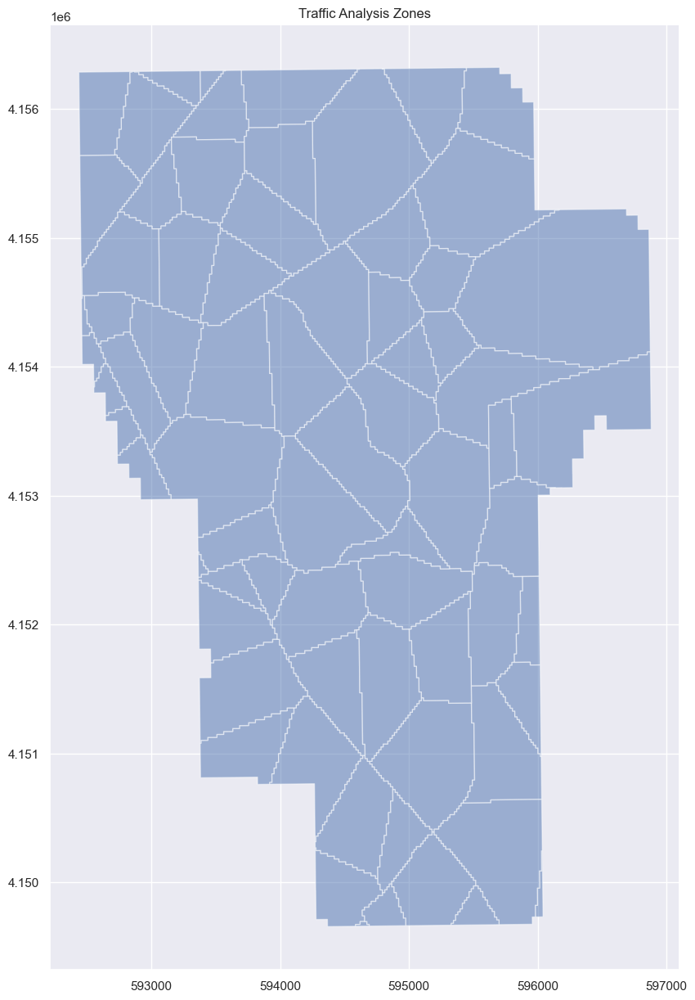

In [36]:
# visualize 

ax = taz_int.plot(figsize=(15, 15), alpha=0.5) #, column='area', legend=True, cmap='OrRd')
# cx.add_basemap(ax, crs='EPSG:32610', source=cx.providers.CartoDB.Voyager) #4326
plt.title('Traffic Analysis Zones')

Text(0.5, 1.0, 'Traffic Analysis Zones')

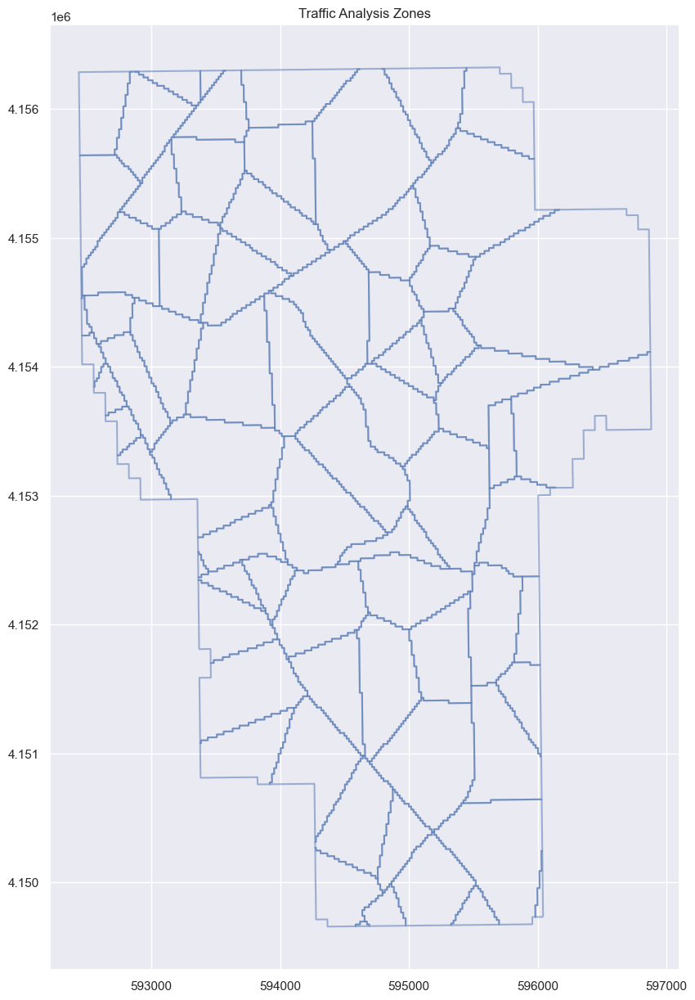

In [37]:
# visualize 

ax = taz_int.boundary.plot(figsize=(15, 15), alpha=0.5) #, column='area', legend=True, cmap='OrRd')
# cx.add_basemap(ax, crs='EPSG:32610', source=cx.providers.CartoDB.Voyager) #4326
plt.title('Traffic Analysis Zones')

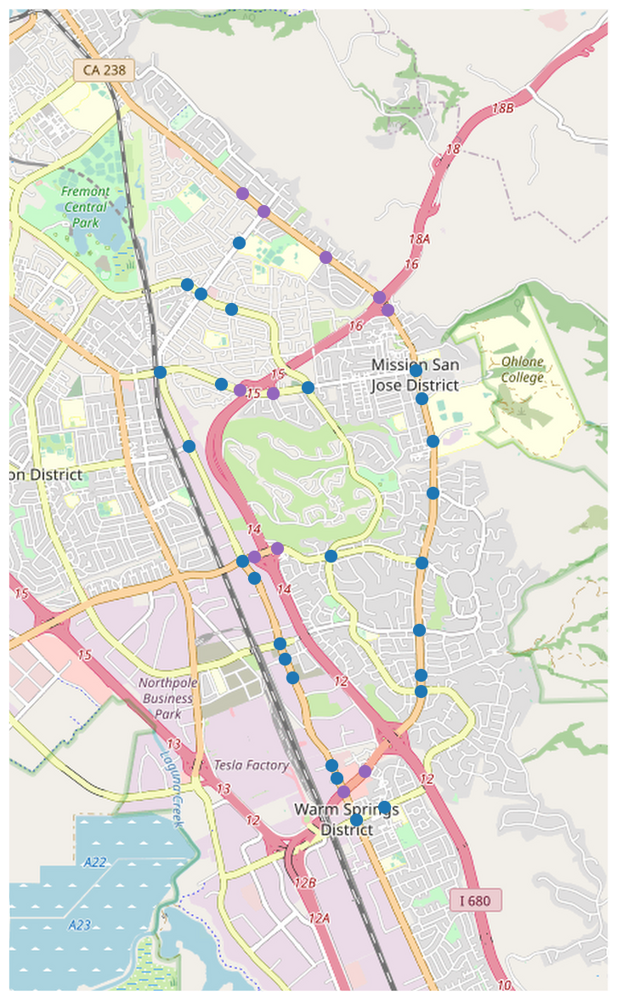

In [38]:
import tilemapbase
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(frame, buffer=25)

fig, ax = plt.subplots(figsize=(15, 15))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
plotter.plot(ax)
# frame.plot(ax=ax, column="name", color="0.8")

taz_int.plot(ax=ax, alpha=0.5, zorder=1)
node_geo_city.plot(ax=ax, color='#1F77B4', lw=5)
node_geo_state.plot(ax=ax, color='#9467bd', lw=5)
# ax.legend(frame.name)

# ax = frame.plot('name', color='0.8', figsize=(15, 15))
# nodes.to_crs("EPSG:3857").plot(ax=ax, color='yellow', lw=0.01)
# uncoordinated_node_geo.plot(ax=ax, color='red', lw=3)
# plt.title('Uncoordinated nodes')
# plt.axis('off')
plt.show()

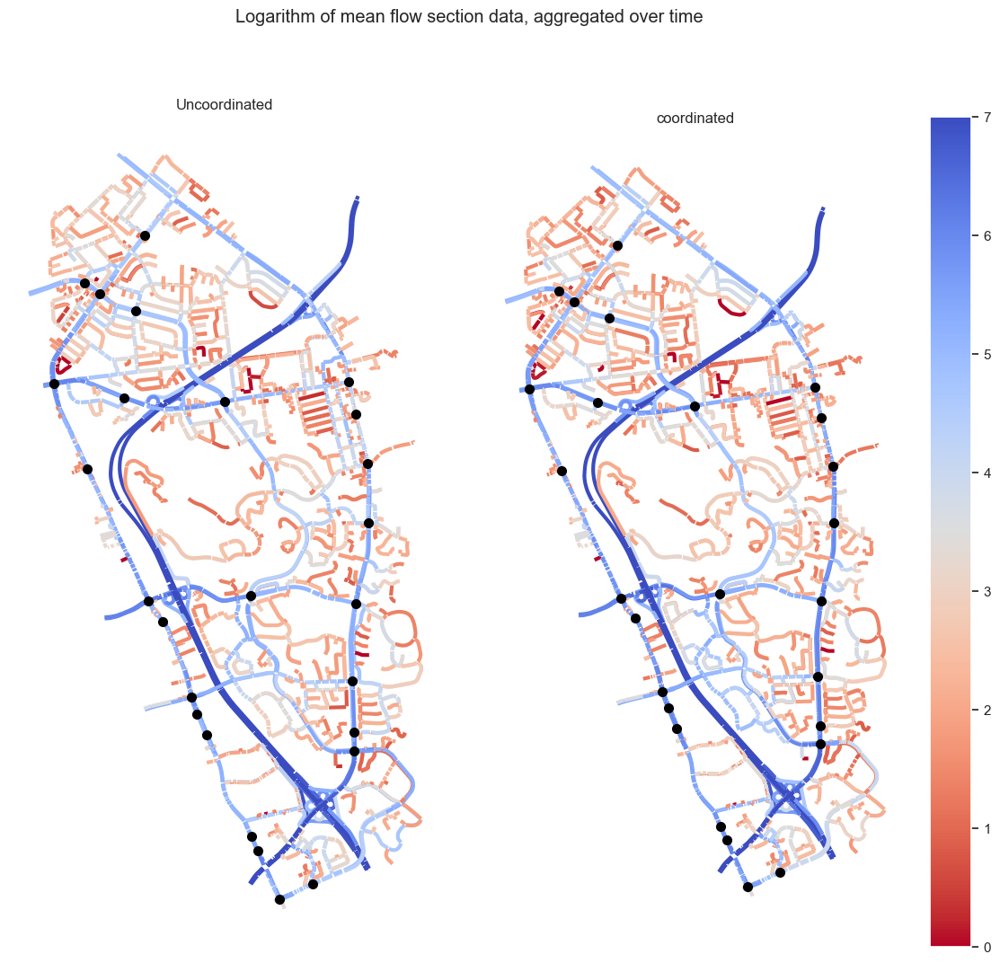

In [39]:
# ax = frame.plot(figsize=(15,15), column=f'{col.name}_ratio', legend=True, cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
# node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
# plt.axis('off')
# plt.title(f'Relative (coordinated/uncoordinated) {col.desc} ratio by section, aggregated over time')
# plt.show()

# fig, axs = plt.subplots(1, 5, figsize=(30, 9))

def section_plot(metric, min_val, max_val):
    fig, axs = plt.subplots(1, 2, figsize=(15, 12))
    fig.suptitle(f'{metric.desc} section data, aggregated over time')
    for i in range(2):
        ax, type = axs[i], ['uncoordinated', 'coordinated'][i]
        frame.plot(ax=ax, column=f'{metric.name}_{type}', legend=(i==1), cmap='coolwarm_r', lw=3, vmin=min_val, vmax=max_val, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title(['Uncoordinated', 'coordinated'][i])
        ax.axis('off')

    plt.subplots_adjust(wspace=0)
    plt.show()

section_plot(log_flow, 0, 7)

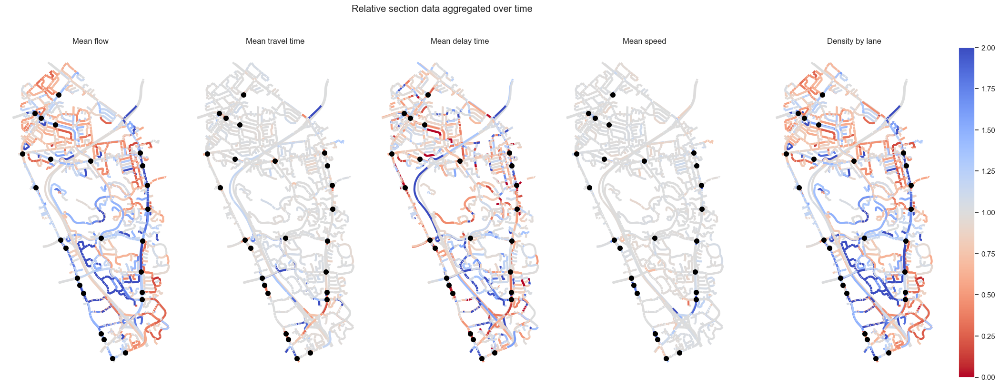

In [40]:
fig, axs = plt.subplots(1, 5, figsize=(30, 9))
fig.suptitle('Relative section data aggregated over time')
for i in range(5):
    ax, metric = axs[i], list(section_cols.values())[i]
    frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
    node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
    ax.set_title(metric.desc)
    ax.axis('off')

plt.subplots_adjust(wspace=-0.5)
plt.savefig(f'{image_path}\\sections.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

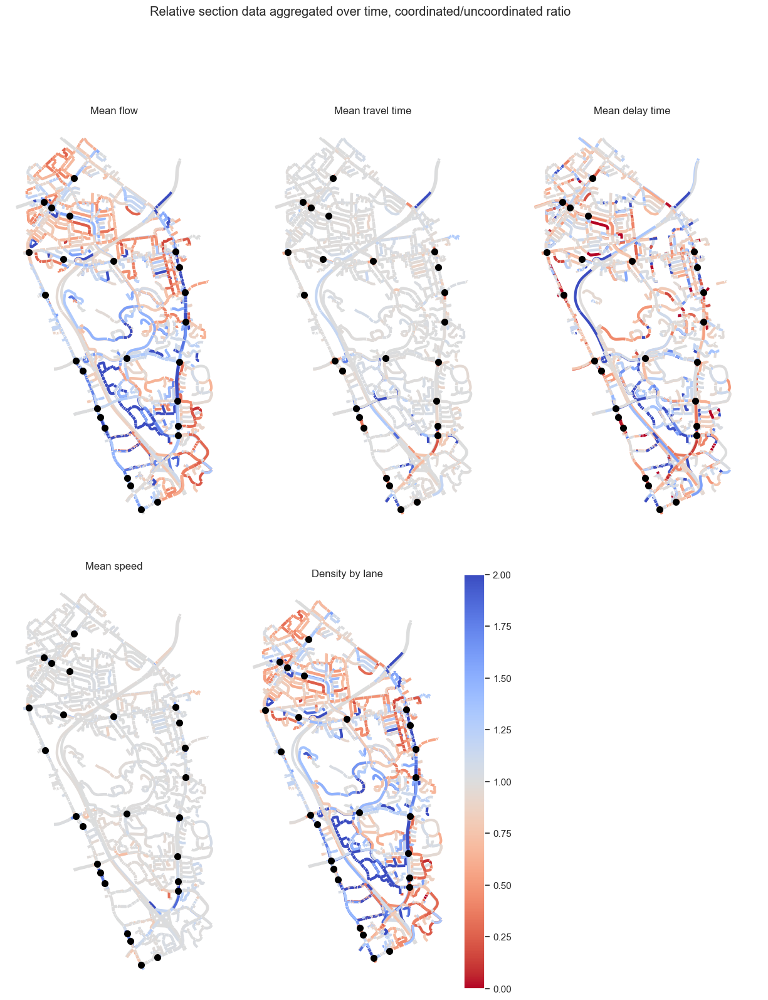

In [41]:
fig, axs = plt.subplots(2, 3, figsize=(16, 18))
fig.suptitle('Relative section data aggregated over time, coordinated/uncoordinated ratio')
for i in range(6):
    ax = axs[i//3][i%3]
    ax.axis('off')
    if i<5:
        metric = list(section_cols.values())[i]
        frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title(metric.desc)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.show()

## Animations

In [42]:
uncoordinated_section_df

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1376.000000,-1.0,344.0,-1.0,1388.000000,...,0.0,-1.0,0.141860,1.154377,0.017442,-1.0,3.668785,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1308.000000,-1.0,327.0,-1.0,1316.000000,...,5.0,-1.0,0.000000,0.000000,0.000000,-1.0,1.422879,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1332.000000,-1.0,333.0,-1.0,1336.000000,...,6.0,-1.0,0.000000,0.000000,0.000000,-1.0,1.011380,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.000000,-1.0,2.0,-1.0,8.000000,...,0.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.011740,-1.0,0.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352870,151642198,151597396,28550,2,0,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
352871,151642198,151600599,28581,2,0,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
352872,151642198,151616088,3425,2,0,394.166667,-1.0,2365.0,-1.0,394.333333,...,18.0,-1.0,0.000000,0.000000,0.000000,-1.0,100.524190,-1.0,0.0,-1.0
352873,151642198,151616494,56150,2,0,275.500000,-1.0,1653.0,-1.0,275.500000,...,19.0,-1.0,0.076467,1.466448,0.000000,-1.0,8.289970,-1.0,0.0,-1.0


In [43]:
null_values['ent'] = 0
null_values

{'eid': None,
 'ent': 0,
 'flow': 0,
 'ttime': -1,
 'dtime': -1,
 'speed': -1,
 'density': 0}

In [44]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}

def preprocess_sections_animation(df):
    df = df[df['sid']==0]
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df

for k, df in dfs_section.items():
    dfs_section[k] = preprocess_sections_animation(df)

dfs_section['uncoordinated']

,eid,ent,flow,ttime,dtime,speed,density
0,242,1,1376.0,24.864037,18.625953,27.077439,52.313737
1,243,1,1308.0,2.650094,0.038512,105.441507,3.136745
2,244,1,1332.0,1.819127,0.071725,105.410827,3.265365
4,247,1,8.0,10.254333,0.576948,41.689960,0.194849
5,248,1,12.0,11.766326,7.641712,16.254352,0.765373
...,...,...,...,...,...,...,...
329340,33076,24,8.0,20.569050,0.393409,39.138701,0.205218
329342,36523,24,4.0,7.981964,0.564500,35.010047,0.114253
329347,3425,24,592.0,4.534206,1.773717,64.590449,4.611765
329348,56150,24,436.0,1.019432,0.256451,62.463459,3.681495


In [45]:
dfs_section['uncoordinated'][(dfs_section['uncoordinated']['eid']=="242") & (dfs_section['uncoordinated']['ent']==1)]

,eid,ent,flow,ttime,dtime,speed,density
0,242,1,1376.0,24.864037,18.625953,27.077439,52.313737


In [47]:
section_df = dfs_section['uncoordinated'].merge(dfs_section['coordinated'], on=['eid', 'ent'], how='left', suffixes=['_uncoordinated', '_coordinated'])

for k in section_cols:
    section_df[k+'_ratio'] = section_df[k+'_coordinated'] / section_df[k+'_uncoordinated']

section_df = section_df.dropna()
section_df

,eid,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
0,242,1,1376.0,24.864037,18.625953,27.077439,52.313737,1356.0,24.155884,17.927443,27.772434,50.106215,0.985465,0.971519,0.962498,1.025667,0.957802
1,243,1,1308.0,2.650094,0.038512,105.441507,3.136745,1256.0,2.659904,0.047324,105.051102,3.019156,0.960245,1.003702,1.228788,0.996297,0.962513
2,243,1,1308.0,2.650094,0.038512,105.441507,3.136745,1272.0,2.785957,0.050646,105.056933,3.052417,0.972477,1.051267,1.315047,0.996353,0.973116
3,243,1,1308.0,2.650094,0.038512,105.441507,3.136745,1268.0,0.562661,0.010235,105.032080,3.044200,0.969419,0.212317,0.265752,0.996117,0.970497
4,244,1,1332.0,1.819127,0.071725,105.410827,3.265365,1280.0,1.823788,0.077166,105.117350,3.145367,0.960961,1.002562,1.075867,0.997216,0.963251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68807,3425,24,592.0,4.534206,1.773717,64.590449,4.611765,636.0,4.733680,1.994731,60.720573,5.190379,1.074324,1.043993,1.124605,0.940086,1.125465
68808,56150,24,436.0,1.019432,0.256451,62.463459,3.681495,828.0,26.831333,22.877550,29.268433,18.928575,1.899083,26.319878,89.208327,0.468569,5.141546
68809,56150,24,436.0,1.019432,0.256451,62.463459,3.681495,852.0,1.090531,0.325831,58.184362,7.695855,1.954128,1.069743,1.270541,0.931494,2.090416
68810,7154,24,2872.0,11.460901,0.220636,104.340222,5.113093,1324.0,12.284400,0.264690,104.312196,2.541104,0.461003,1.071853,1.199667,0.999731,0.496980


In [48]:
section_df = section_df.merge(sections[['eid', 'geometry']], left_on='eid', right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,geometry
eid,,,,,,,,,,,,,,,,,
242,1,1376.0,24.864037,18.625953,27.077439,52.313737,1356.0,24.155884,17.927443,27.772434,50.106215,0.985465,0.971519,0.962498,1.025667,0.957802,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,2,932.0,22.023825,15.840652,30.602339,32.015548,820.0,21.292549,15.107659,31.413536,26.367021,0.879828,0.966796,0.953727,1.026508,0.823569,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,3,928.0,23.068111,16.919972,28.925671,32.669274,748.0,20.712661,14.576582,32.253563,24.012597,0.806034,0.897892,0.861502,1.115050,0.735021,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,4,1028.0,24.250314,18.056209,27.989771,37.866400,780.0,20.496334,14.287262,32.678167,24.019167,0.758755,0.845199,0.791266,1.167504,0.634313,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,5,1152.0,23.811288,17.626821,28.004135,40.838244,892.0,22.238980,16.060410,30.088720,30.119886,0.774306,0.933968,0.911135,1.074438,0.737541,"LINESTRING (-13572344.019 4508460.315, -135723..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36771,23,4.0,1.709982,0.028644,40.952556,0.097674,12.0,1.282409,0.000000,55.411200,0.219753,3.000000,0.749954,0.000000,1.353058,2.249863,"LINESTRING (-13575525.776 4512998.261, -135755..."
298,24,4.0,15.288794,0.954761,46.662473,0.085722,8.0,17.538917,1.474865,40.689142,0.196676,2.000000,1.147175,1.544748,0.871989,2.294349,"LINESTRING (-13573798.612 4512969.259, -135737..."
525,24,4.0,6.343233,0.251891,48.960891,0.081698,8.0,7.023985,0.010860,44.538931,0.180931,2.000000,1.107319,0.043113,0.909684,2.214639,"LINESTRING (-13571754.422 4511855.748, -135717..."


### Side by side (and determining bounds)

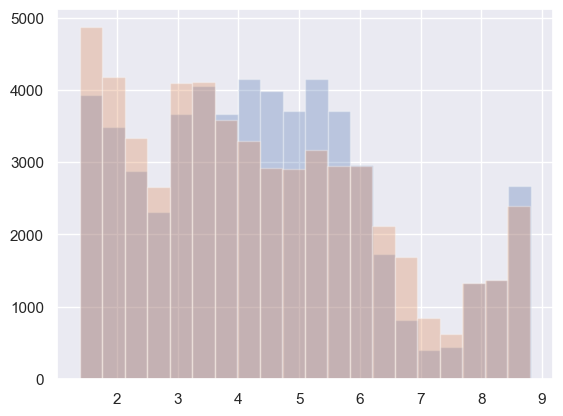

In [63]:
plt.hist(np.log(frame['flow_uncoordinated']), bins=20, alpha=0.3, label='uncoordinated')
plt.hist(np.log(frame['flow_coordinated']), bins=20, alpha=0.3, label='coordinated')
plt.show()

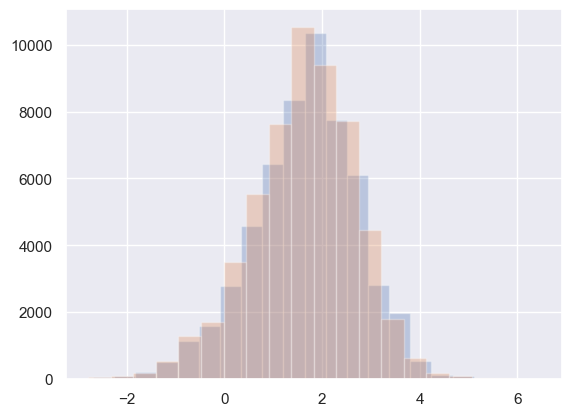

In [64]:
plt.hist(np.log(frame['ttime_uncoordinated']), bins=20, alpha=0.3, label='uncoordinated')
plt.hist(np.log(frame['ttime_coordinated']), bins=20, alpha=0.3, label='coordinated')
plt.show()

<AxesSubplot:>

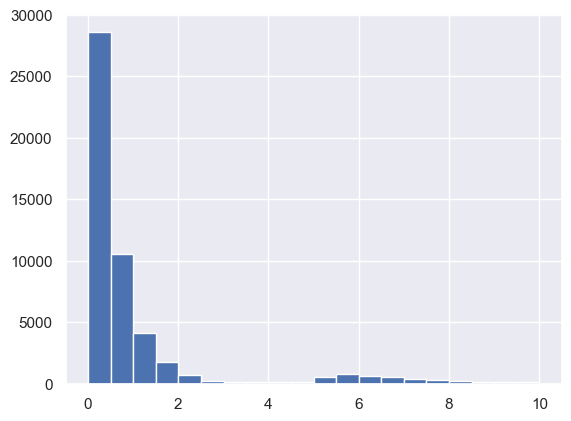

In [87]:
frame['dtime_uncoordinated'][frame['dtime_uncoordinated'] < 10].hist(bins=20)

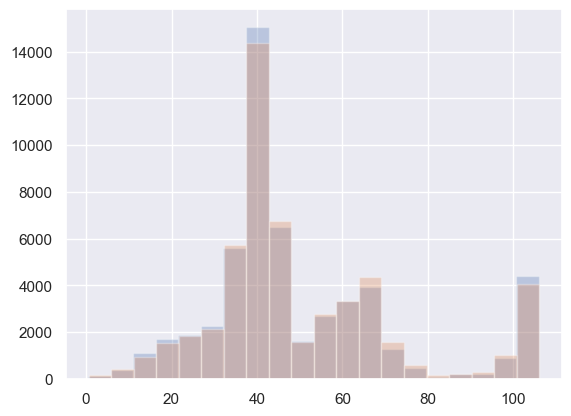

In [94]:
plt.hist(frame['speed_uncoordinated'], bins=20, alpha=0.3, label='uncoordinated')
plt.hist(frame['speed_coordinated'], bins=20, alpha=0.3, label='coordinated')
plt.show()

<AxesSubplot:>

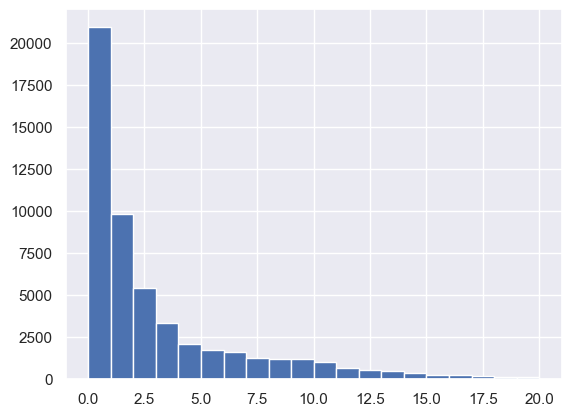

In [88]:
frame['density_uncoordinated'][frame['density_uncoordinated'] < 20].hist(bins=20)

In [90]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])
frame['log_ttime_uncoordinated'] = np.log(frame['ttime_uncoordinated'])
frame['log_ttime_coordinated'] = np.log(frame['ttime_coordinated'])

In [91]:
section_cols

{'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s),
 'dtime': Column(dtime, Mean delay time, s),
 'speed': Column(speed, Mean speed, km/h),
 'density': Column(density, Density by lane, veh/km)}

In [138]:
section_comparisons = {
    'flow': (Column('log_flow', 'Log of mean flow', 'veh/h'), (0, 10)),
    'ttime': (Column('log_ttime', 'Log of mean travel time', 's'), (-2, 6)),
    'dtime': (section_cols['dtime'], (0, 2.5)),
    'speed': (section_cols['speed'], (0, 120)),
    'density': (section_cols['density'], (0, 8))
}

Processing log_flow, frame 1
Processing log_flow, frame 1
Processing log_flow, frame 2
Processing log_flow, frame 3
Processing log_flow, frame 4
Processing log_flow, frame 5
Processing log_flow, frame 6
Processing log_flow, frame 7
Processing log_flow, frame 8
Processing log_flow, frame 9
Processing log_flow, frame 10
Processing log_flow, frame 11
Processing log_flow, frame 12
Processing log_flow, frame 13
Processing log_flow, frame 14
Processing log_flow, frame 15
Processing log_flow, frame 16
Processing log_flow, frame 17
Processing log_flow, frame 18
Processing log_flow, frame 19
Processing log_flow, frame 20
Processing log_flow, frame 21
Processing log_flow, frame 22
Processing log_flow, frame 23
Processing log_flow, frame 24
Processing log_ttime, frame 1
Processing log_ttime, frame 1
Processing log_ttime, frame 2
Processing log_ttime, frame 3
Processing log_ttime, frame 4
Processing log_ttime, frame 5
Processing log_ttime, frame 6
Processing log_ttime, frame 7
Processing log_ttime

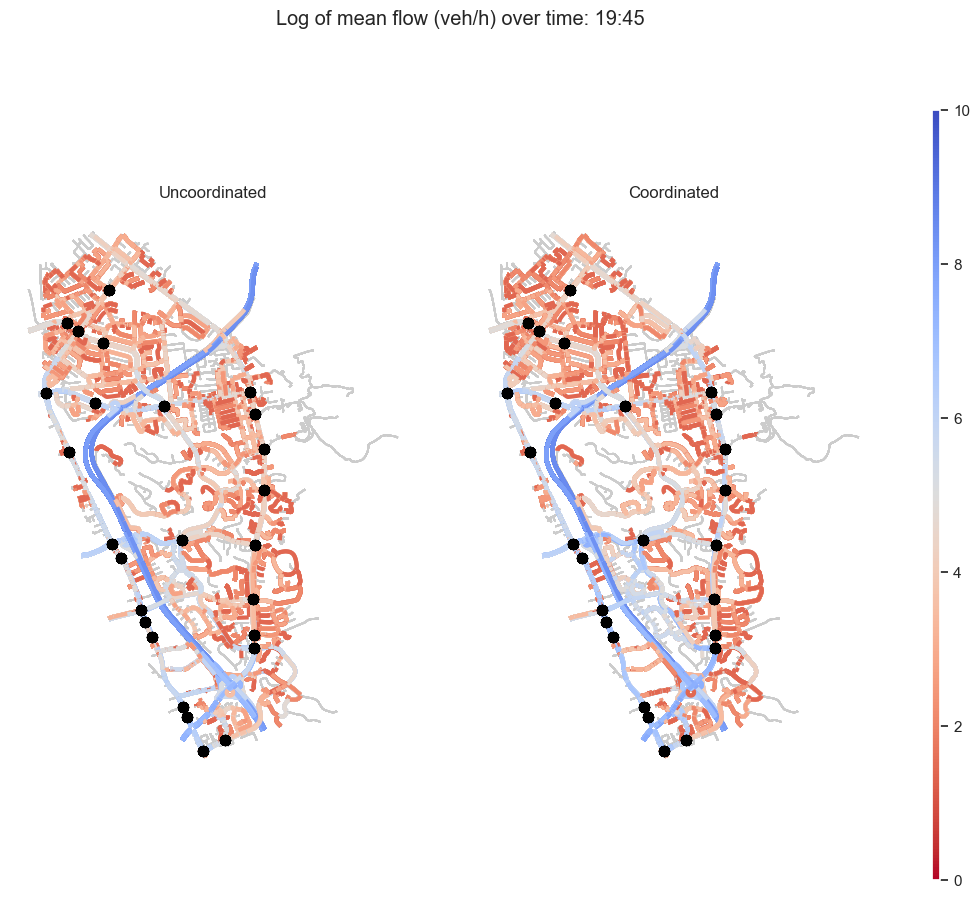

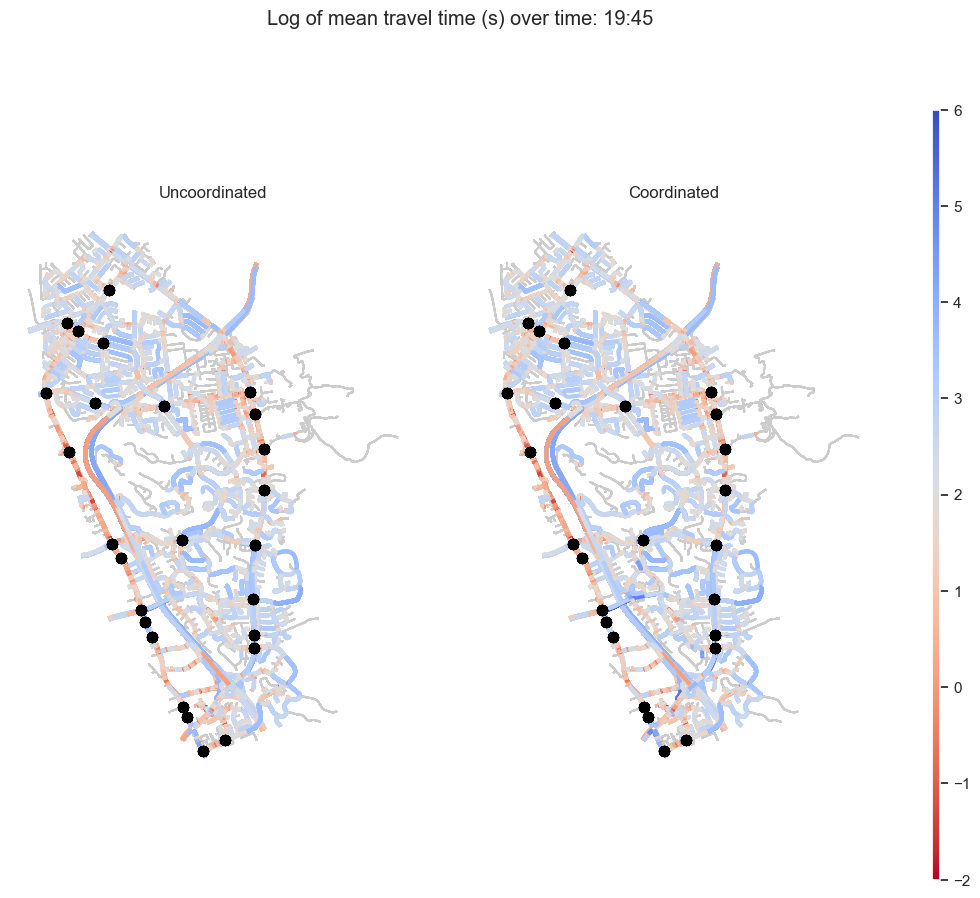

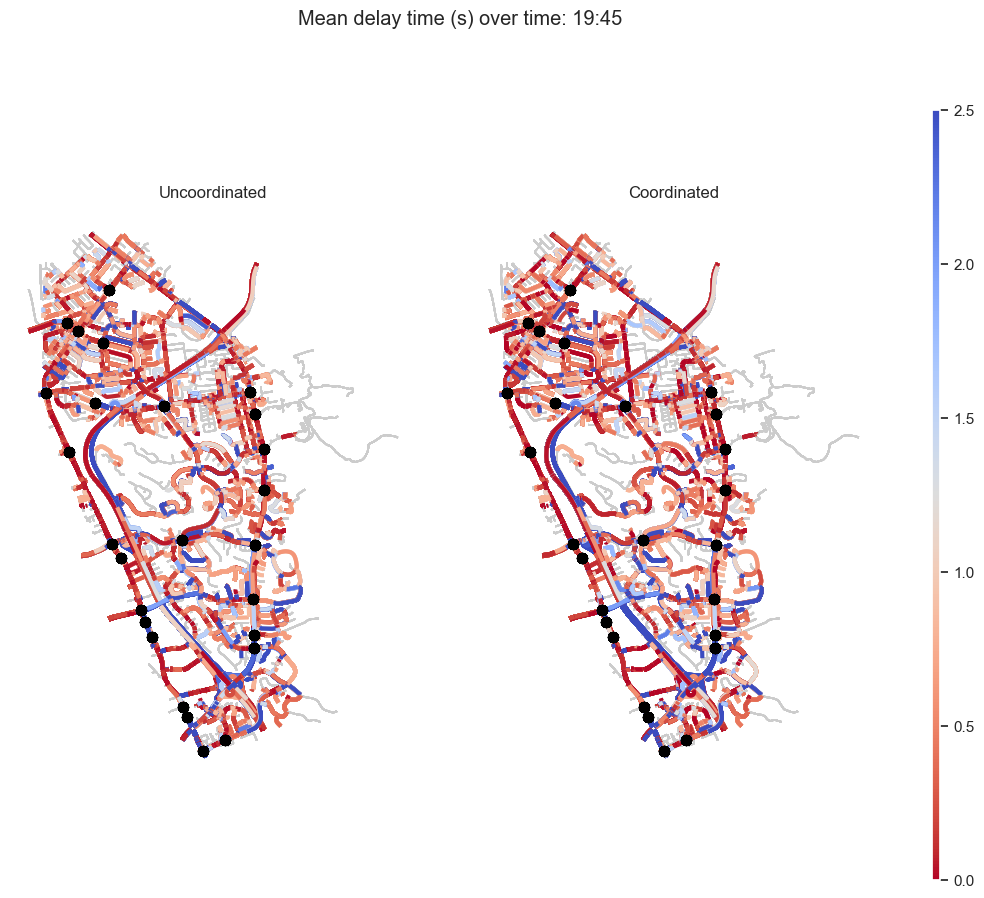

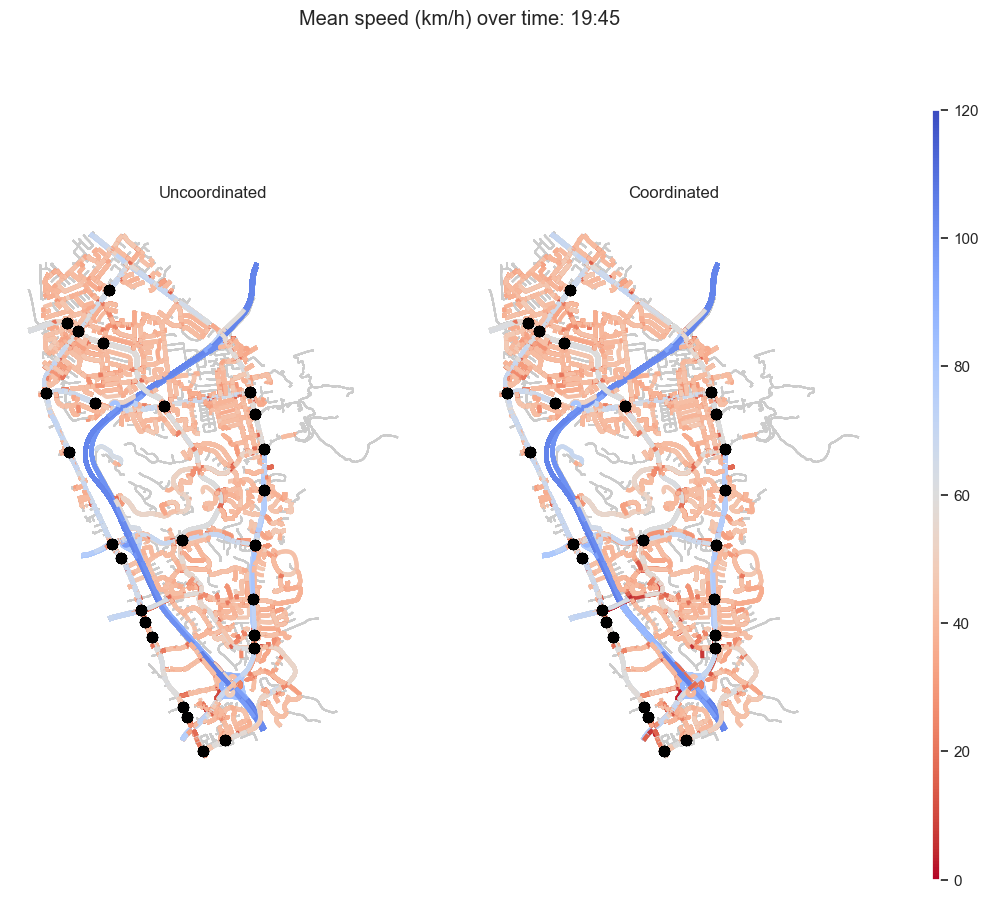

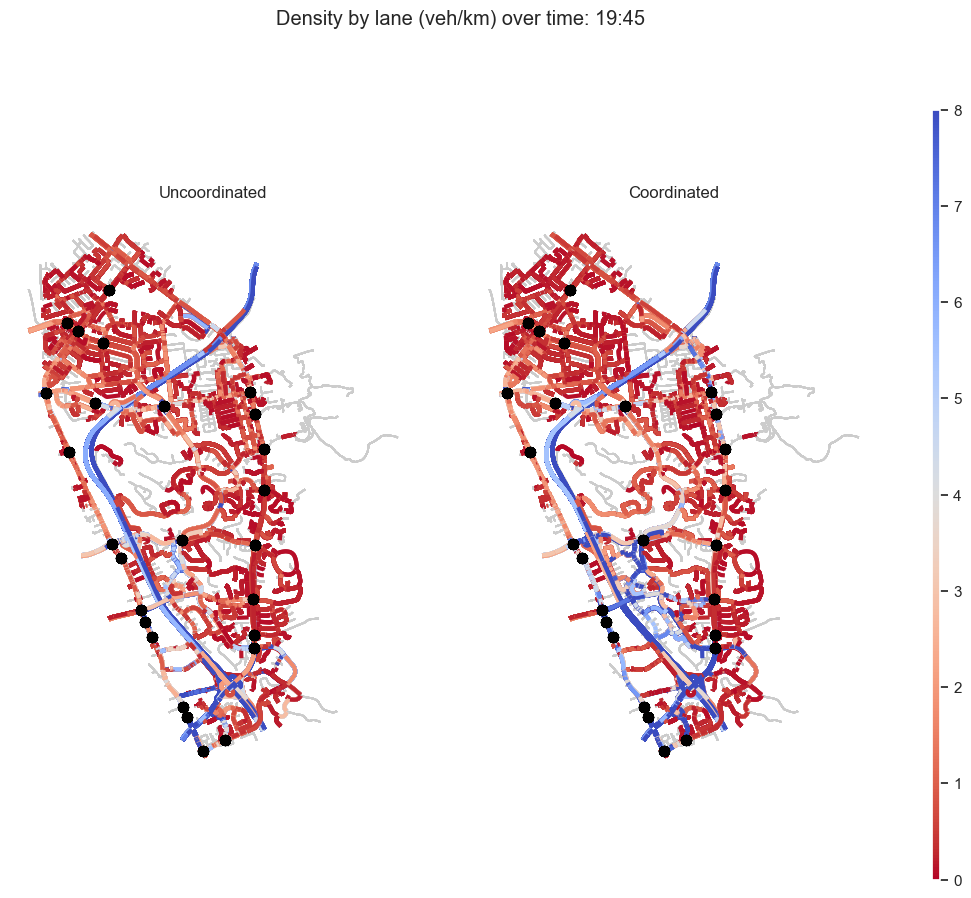

In [157]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_side_by_side(metric, vmin, vmax):
    fig, [ax1, ax2, cax] = plt.subplots(1, 3, figsize=(12, 10), gridspec_kw={"width_ratios":[50,50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax1, lw=1, color='0.8', zorder=-1)
        sections.plot(ax=ax2, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax1, column=(metric.name + '_uncoordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        data.plot(ax=ax2, column=(metric.name + '_coordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im1 = node_geo_city.plot(ax=ax1, color='black', lw=2, zorder=1)
        im2 = node_geo_city.plot(ax=ax2, color='black', lw=2, zorder=1)
        ax1.set_title('Uncoordinated')
        ax2.set_title('Coordinated')
        ax1.set_axis_off()
        ax2.set_axis_off()
        return [im1, im2]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    anim.save(f'{image_path}\\{metric.name}_side_by_side.gif', writer=writergif)
    # plt.show()

for k in section_cols:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

Processing dtime, frame 1
Processing dtime, frame 1
Processing dtime, frame 2
Processing dtime, frame 3
Processing dtime, frame 4
Processing dtime, frame 5
Processing dtime, frame 6
Processing dtime, frame 7
Processing dtime, frame 8
Processing dtime, frame 9
Processing dtime, frame 10
Processing dtime, frame 11
Processing dtime, frame 12
Processing dtime, frame 13
Processing dtime, frame 14
Processing dtime, frame 15
Processing dtime, frame 16
Processing dtime, frame 17
Processing dtime, frame 18
Processing dtime, frame 19
Processing dtime, frame 20
Processing dtime, frame 21
Processing dtime, frame 22
Processing dtime, frame 23
Processing dtime, frame 24
Processing density, frame 1
Processing density, frame 1
Processing density, frame 2
Processing density, frame 3
Processing density, frame 4
Processing density, frame 5
Processing density, frame 6
Processing density, frame 7
Processing density, frame 8
Processing density, frame 9
Processing density, frame 10
Processing density, frame 

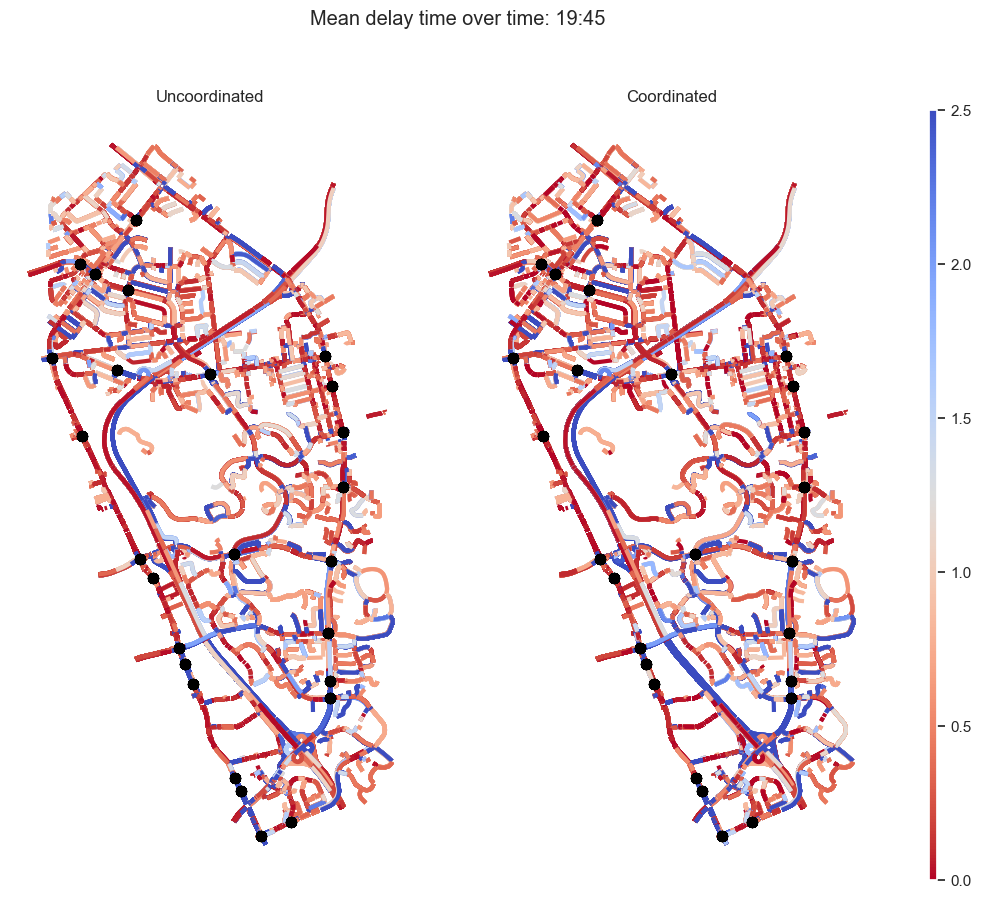

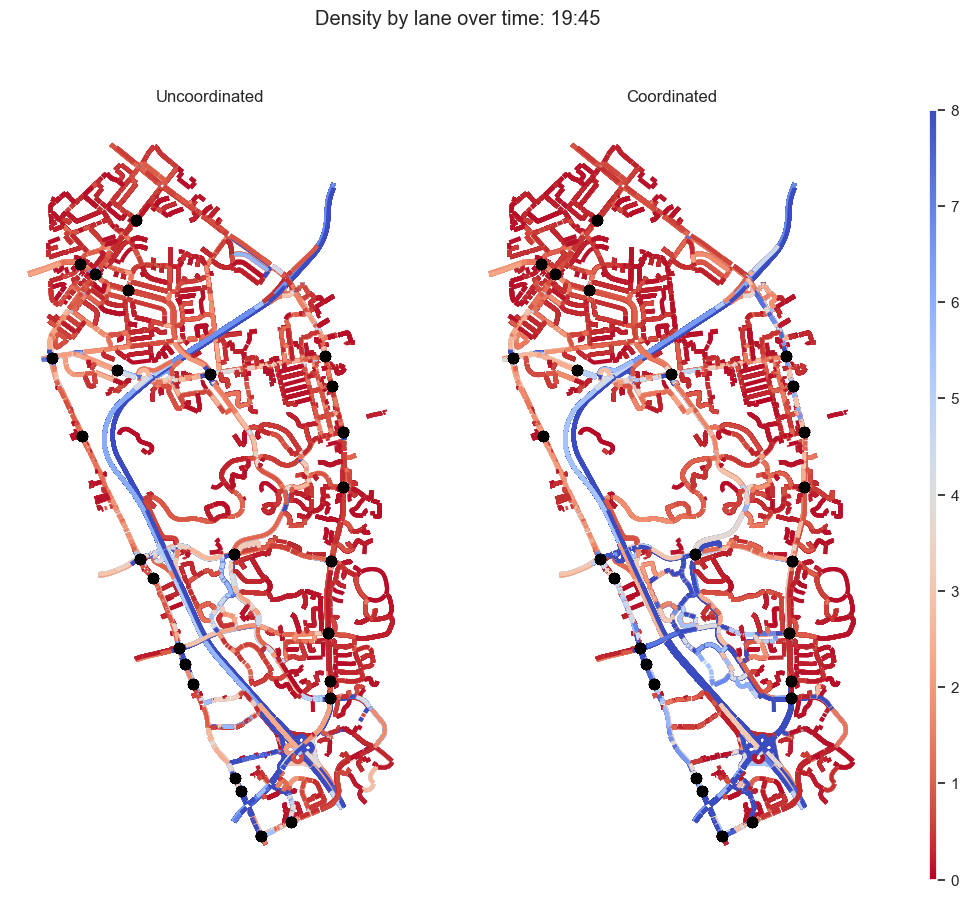

In [102]:
for k in ['dtime', 'density']:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

### Ratio

Processing flow, frame 1
Processing flow, frame 1
Processing flow, frame 2
Processing flow, frame 3
Processing flow, frame 4
Processing flow, frame 5
Processing flow, frame 6
Processing flow, frame 7
Processing flow, frame 8
Processing flow, frame 9
Processing flow, frame 10
Processing flow, frame 11
Processing flow, frame 12
Processing flow, frame 13
Processing flow, frame 14
Processing flow, frame 15
Processing flow, frame 16
Processing flow, frame 17
Processing flow, frame 18
Processing flow, frame 19
Processing flow, frame 20
Processing flow, frame 21
Processing flow, frame 22
Processing flow, frame 23
Processing flow, frame 24
Processing ttime, frame 1
Processing ttime, frame 1
Processing ttime, frame 2
Processing ttime, frame 3
Processing ttime, frame 4
Processing ttime, frame 5
Processing ttime, frame 6
Processing ttime, frame 7
Processing ttime, frame 8
Processing ttime, frame 9
Processing ttime, frame 10
Processing ttime, frame 11
Processing ttime, frame 12
Processing ttime, f

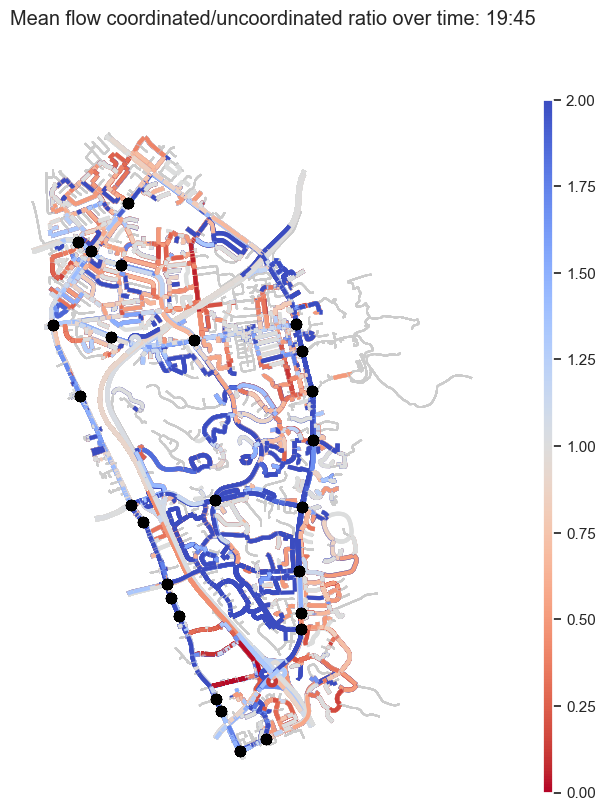

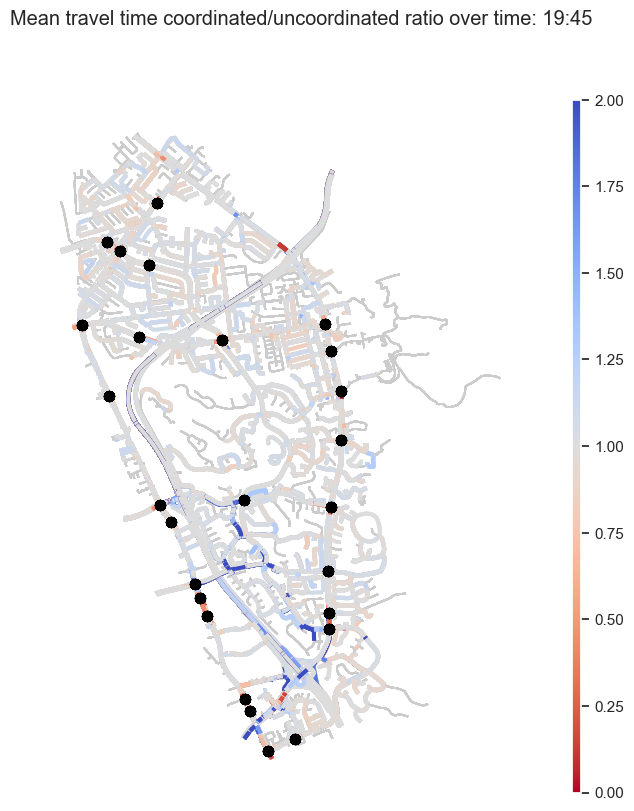

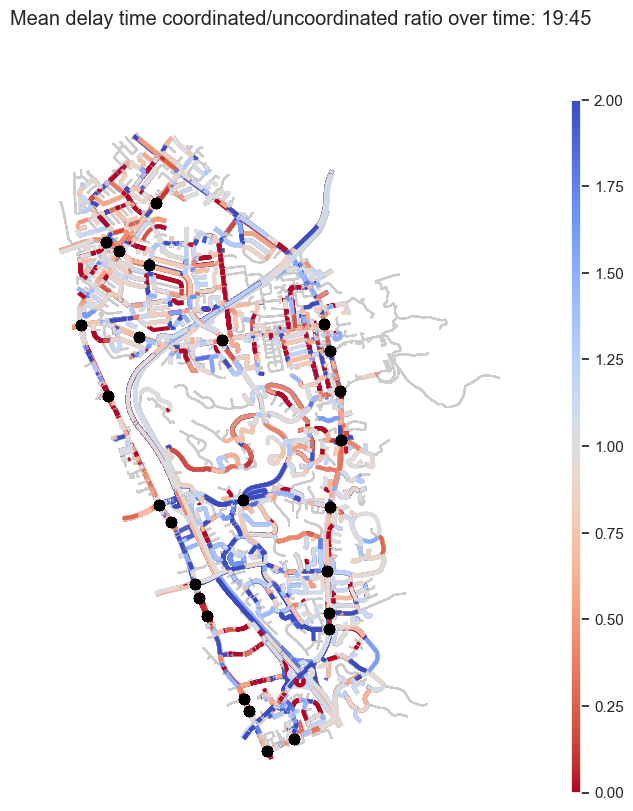

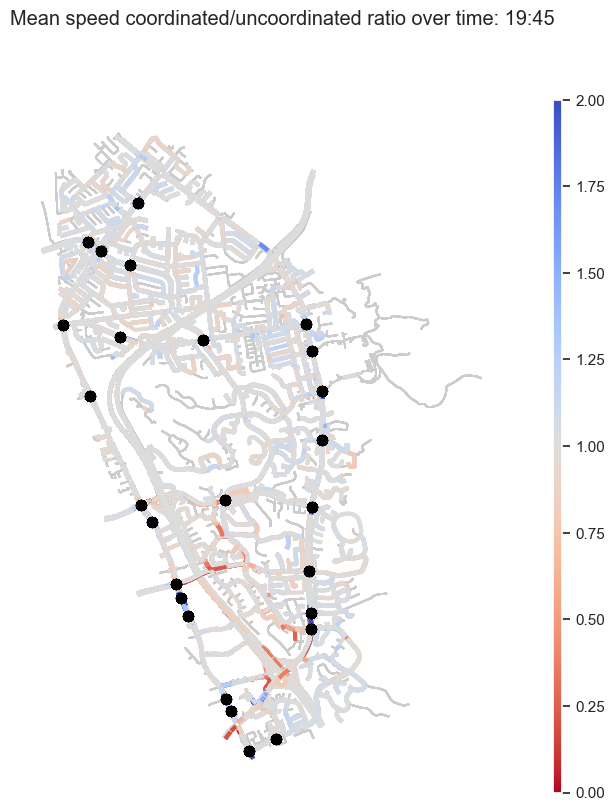

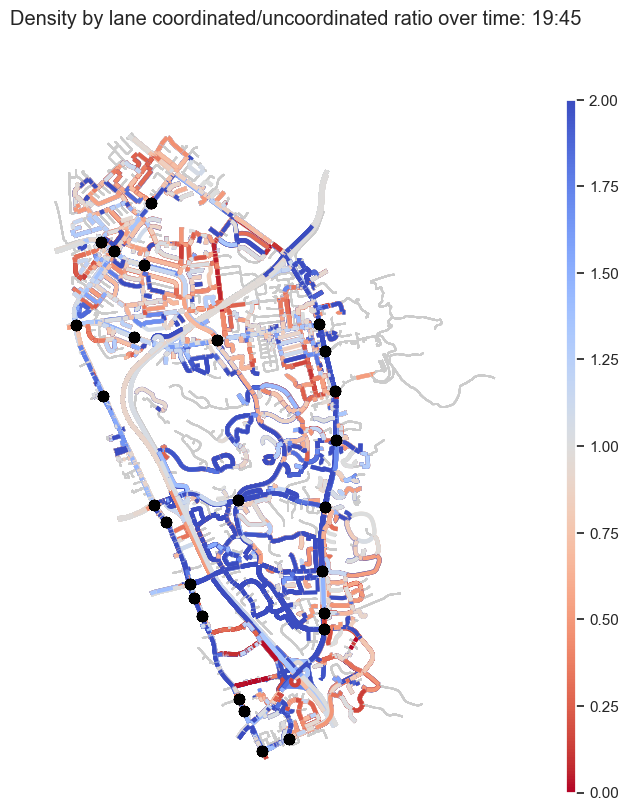

In [158]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_ratio(metric):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated/uncoordinated ratio over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_ratio'), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}\\{metric.name}_ratio.gif', writer=writergif)
    # plt.show()

for k in section_cols:
    make_animation_ratio(section_cols[k])

Processing speed, frame 1
Processing speed, frame 1
Processing speed, frame 2
Processing speed, frame 3
Processing speed, frame 4
Processing speed, frame 5
Processing speed, frame 6
Processing speed, frame 7
Processing speed, frame 8
Processing speed, frame 9
Processing speed, frame 10
Processing speed, frame 11
Processing speed, frame 12
Processing speed, frame 13
Processing speed, frame 14
Processing speed, frame 15
Processing speed, frame 16
Processing speed, frame 17
Processing speed, frame 18
Processing speed, frame 19
Processing speed, frame 20
Processing speed, frame 21
Processing speed, frame 22
Processing speed, frame 23
Processing speed, frame 24


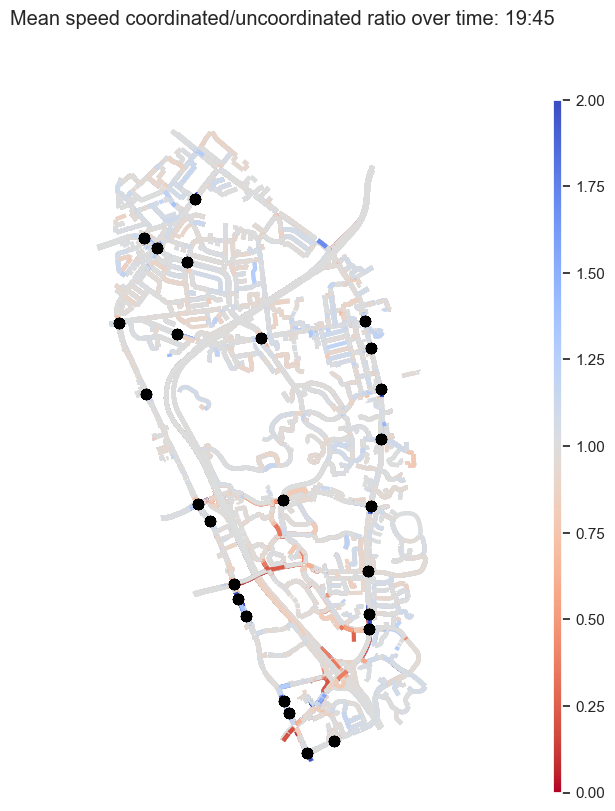

In [134]:
make_animation_ratio(section_cols['speed'])

### Difference

In [104]:
for k in section_cols:
    frame[k + '_difference'] = frame[k + '_coordinated'] - frame[k + '_uncoordinated']

frame

,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,...,geometry,log_flow_uncoordinated,log_flow_coordinated,log_ttime_uncoordinated,log_ttime_coordinated,ttime_difference,speed_difference,flow_difference,dtime_difference,density_difference
eid,,,,,,,,,,,,,,,,,,,,,
242,1,1376.0,24.864037,18.625953,27.077439,52.313737,1356.0,24.155884,17.927443,27.772434,...,"LINESTRING (-13572344.019 4508460.315, -135723...",7.226936,7.212294,3.213422,3.184528,-0.708153,0.694996,-20.0,-0.698510,-2.207521
242,2,932.0,22.023825,15.840652,30.602339,32.015548,820.0,21.292549,15.107659,31.413536,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.837333,6.709304,3.092125,3.058357,-0.731276,0.811197,-112.0,-0.732993,-5.648528
242,3,928.0,23.068111,16.919972,28.925671,32.669274,748.0,20.712661,14.576582,32.253563,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.833032,6.617403,3.138451,3.030745,-2.355450,3.327892,-180.0,-2.343389,-8.656677
242,4,1028.0,24.250314,18.056209,27.989771,37.866400,780.0,20.496334,14.287262,32.678167,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.935370,6.659294,3.188430,3.020246,-3.753980,4.688396,-248.0,-3.768948,-13.847232
242,5,1152.0,23.811288,17.626821,28.004135,40.838244,892.0,22.238980,16.060410,30.088720,...,"LINESTRING (-13572344.019 4508460.315, -135723...",7.049255,6.793466,3.170160,3.101847,-1.572308,2.084585,-260.0,-1.566410,-10.718358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36771,23,4.0,1.709982,0.028644,40.952556,0.097674,12.0,1.282409,0.000000,55.411200,...,"LINESTRING (-13575525.776 4512998.261, -135755...",1.386294,2.484907,0.536483,0.248740,-0.427574,14.458644,8.0,-0.028644,0.122079
298,24,4.0,15.288794,0.954761,46.662473,0.085722,8.0,17.538917,1.474865,40.689142,...,"LINESTRING (-13573798.612 4512969.259, -135737...",1.386294,2.079442,2.727120,2.864422,2.250123,-5.973331,4.0,0.520104,0.110954
525,24,4.0,6.343233,0.251891,48.960891,0.081698,8.0,7.023985,0.010860,44.538931,...,"LINESTRING (-13571754.422 4511855.748, -135717...",1.386294,2.079442,1.847389,1.949331,0.680752,-4.421960,4.0,-0.241031,0.099233


<AxesSubplot:>

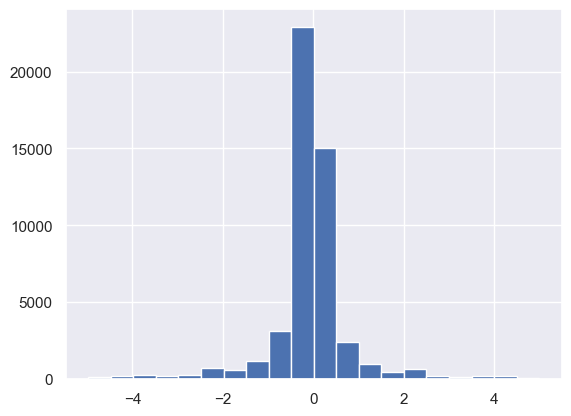

In [145]:
frame['ttime_difference'][abs(frame['ttime_difference']) < 5].hist(bins=20)

<AxesSubplot:>

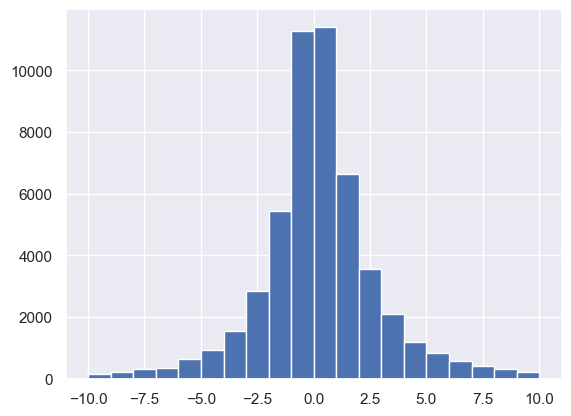

In [127]:
frame['speed_difference'][abs(frame['speed_difference']) < 10].hist(bins=20)

In [146]:
section_comparisons_diff = {
    'ttime': (section_cols['ttime'], (-10, 10)),
    'speed': (section_cols['speed'], (-10, 10))
}

In [149]:
sections

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."
...,...,...,...,...,...,...,...,...,...,...,...
4428,151597396.0,28550,Fernald Common,1,40.0,600.0,179.0,5,42395.0,NaN,"LINESTRING (-13572473.917 4507663.732, -135724..."
4429,151600599.0,28581,Alice Court,1,40.0,600.0,179.0,5,39784.0,NaN,"LINESTRING (-13575454.502 4513910.059, -135754..."
4430,151616088.0,3425,None,2,104.0,2100.0,175.0,1,56586.0,151616089.0,"LINESTRING (-13574102.042 4511052.704, -135741..."
4431,151616494.0,56150,None,2,72.0,1800.0,177.0,3,56168.0,151616495.0,"LINESTRING (-13574438.360 4511038.633, -135744..."


Processing ttime, frame 1
Processing ttime, frame 1
Processing ttime, frame 2
Processing ttime, frame 3
Processing ttime, frame 4
Processing ttime, frame 5
Processing ttime, frame 6
Processing ttime, frame 7
Processing ttime, frame 8
Processing ttime, frame 9
Processing ttime, frame 10
Processing ttime, frame 11
Processing ttime, frame 12
Processing ttime, frame 13
Processing ttime, frame 14
Processing ttime, frame 15
Processing ttime, frame 16
Processing ttime, frame 17
Processing ttime, frame 18
Processing ttime, frame 19
Processing ttime, frame 20
Processing ttime, frame 21
Processing ttime, frame 22
Processing ttime, frame 23
Processing ttime, frame 24
Processing speed, frame 1
Processing speed, frame 1
Processing speed, frame 2
Processing speed, frame 3
Processing speed, frame 4
Processing speed, frame 5
Processing speed, frame 6
Processing speed, frame 7
Processing speed, frame 8
Processing speed, frame 9
Processing speed, frame 10
Processing speed, frame 11
Processing speed, fra

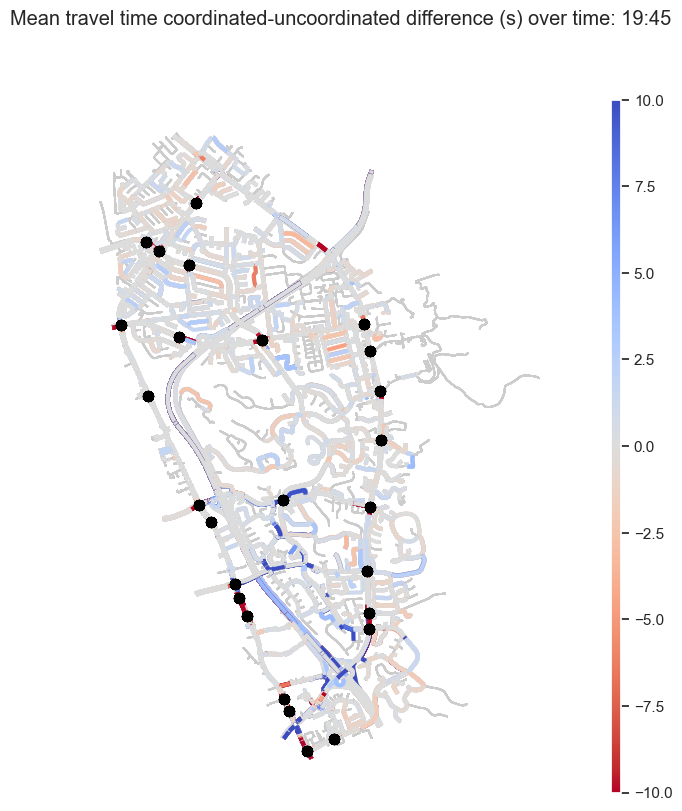

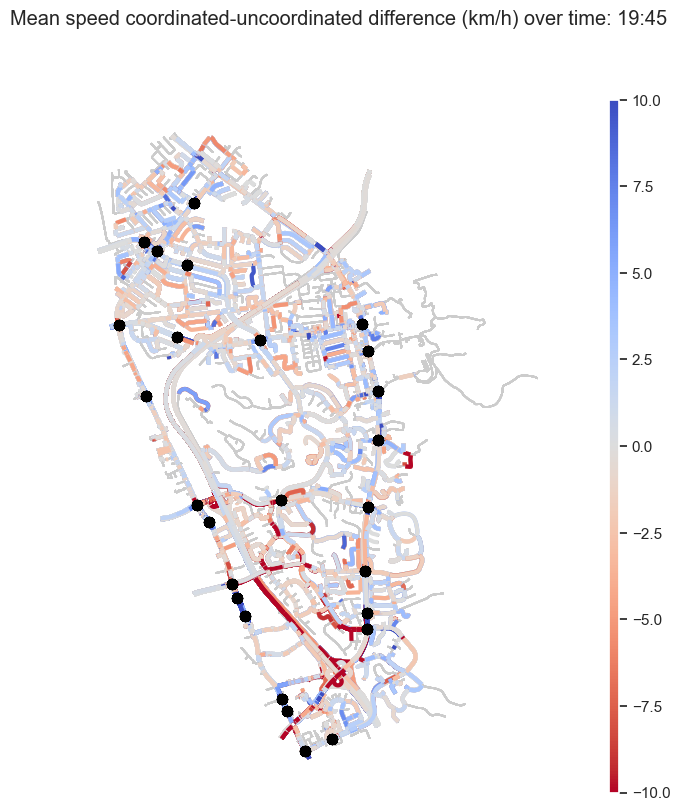

In [159]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_diff(metric, vmin, vmax):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated-uncoordinated difference ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_difference'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}\\{metric.name}_difference.gif', writer=writergif)
    # plt.show()

for k in ['ttime', 'speed']:
    metric, (vmin, vmax) = section_comparisons_diff[k]
    make_animation_diff(metric, vmin, vmax)

### MP4 generation

In [160]:
import moviepy.editor as mp

for filename in os.listdir(image_path):
    f = os.path.join(image_path, filename)
    name, ext = f.split('.')
    if os.path.isfile(f) and ext == 'gif':
        clip = mp.VideoFileClip(f)
        clip.write_videofile(name + ".mp4")

Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\density_ratio.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\density_ratio.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\density_ratio.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\density_side_by_side.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\density_side_by_side.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\density_side_by_side.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\dtime_ratio.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\dtime_ratio.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\dtime_ratio.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\dtime_side_by_side.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\dtime_side_by_side.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\dtime_side_by_side.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\flow_ratio.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\flow_ratio.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\flow_ratio.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\log_flow_side_by_side.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\log_flow_side_by_side.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\log_flow_side_by_side.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\log_ttime_side_by_side.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\log_ttime_side_by_side.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\log_ttime_side_by_side.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_difference.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_difference.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_difference.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_ratio.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_ratio.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_ratio.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_side_by_side.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_side_by_side.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\speed_side_by_side.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\ttime_difference.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\ttime_difference.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\ttime_difference.mp4
Moviepy - Building video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\ttime_ratio.mp4.
Moviepy - Writing video C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\ttime_ratio.mp4



Moviepy - Done !
Moviepy - video ready C:\Users\prest\Preston\Berkeley\fremont_project\images\2022-09-18\ttime_ratio.mp4


<a id='od'></a>
# OD Data

In [44]:
uncoordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', uncoordinated_con)
uncoordinated_od_df = pd.DataFrame(uncoordinated_od_query)

uncoordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [45]:
coordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', coordinated_con)
coordinated_od_df = pd.DataFrame(coordinated_od_query)

coordinated_od_df

KeyboardInterrupt: 

In [ ]:
centroids = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp')
centroids = centroids.to_crs("EPSG:3857")

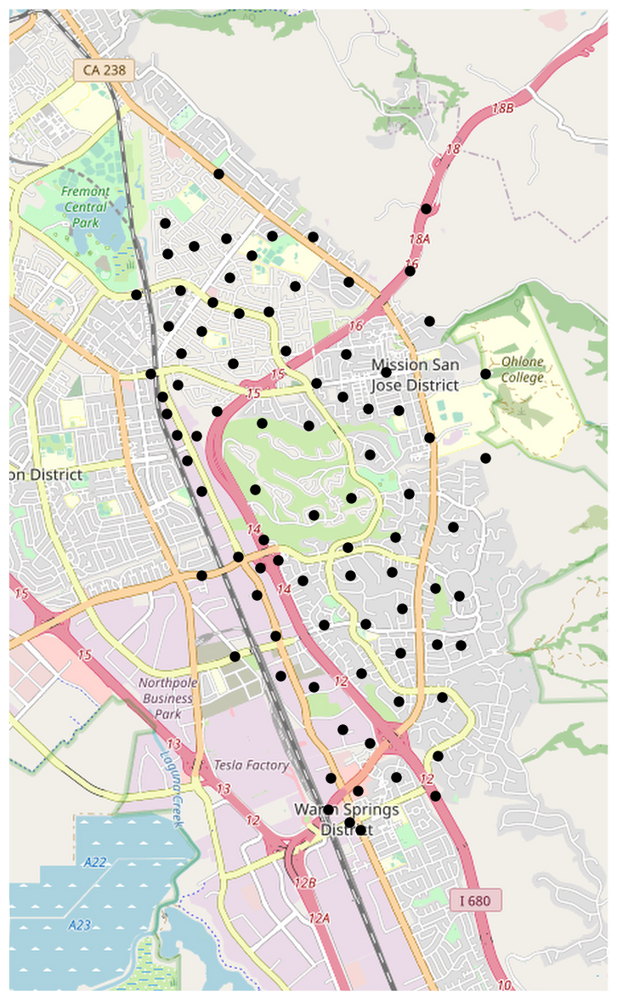

In [ ]:
import tilemapbase
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(frame, buffer=25)

fig, ax = plt.subplots(figsize=(15, 15))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
plotter.plot(ax)
# frame.plot(ax=ax, column="name", color="0.8")
centroids.plot(ax=ax, color='black', lw=3)
# ax.legend(frame.name)

# ax = frame.plot('name', color='0.8', figsize=(15, 15))
# nodes.to_crs("EPSG:3857").plot(ax=ax, color='yellow', lw=0.01)
# uncoordinated_node_geo.plot(ax=ax, color='red', lw=3)
# plt.title('Uncoordinated nodes')
# plt.axis('off')
plt.show()

In [ ]:
coordinated_od_df[(coordinated_od_df['sid']==0) & (coordinated_od_df['nbveh']>0)][['oid', 'eid', 'destination', 'spdh', 'ttime', 'dtime', 'travel']]

,oid,eid,destination,spdh,ttime,dtime,travel
79,151634377,int_0,151635727.0,92.683149,254.547249,21.282066,13.088924
81,151634377,int_0,151635733.0,74.252867,190.034951,50.948261,3.919622
85,151634377,int_0,151635745.0,38.395220,161.413348,79.459261,1.721528
86,151634377,int_0,0.0,65.475774,215.135699,43.242914,18.730075
166,151634402,int_1,151635727.0,52.916627,610.861359,207.971480,17.950058
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600.0,42.216974,223.479824,65.809634,102.250255
546170,151635745,ext_10,151635648.0,53.051312,23.416811,3.675807,1.725406
546172,151635745,ext_10,151635666.0,33.644010,215.872021,95.501427,47.240295
546173,151635745,ext_10,151635689.0,45.006719,227.497739,68.900265,73.837089


In [ ]:
dfs_od = {'uncoordinated': uncoordinated_od_df, 'coordinated': coordinated_od_df}
od_columns = {
    'oid': Column('oid', 'Origin centroid identifier', None),
    'eid': Column('eid', 'Origin centroid external ID', None),
    'destination': Column('destination', 'Destination centroid identifier', None),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's')
}
od_column_names = list(od_columns.keys())

mean_dist = Column('mean_dist', 'Mean travel distance', 'km')

def preprocess_od(df):
    df = df[(df['sid']==0) & (df['nbveh']>0)][od_column_names]
    df['mean_dist'] = df['speed'] * df['ttime'] / 3600
    df['oid'] = df['oid'].astype(int)
    df['destination'] = df['destination'].astype(int)
    return df

for k, df in dfs_od.items():
    dfs_od[k] = preprocess_od(df)

dfs_od['uncoordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,92.354351,257.477739,24.204354,6.605330
81,151634377,int_0,151635733,44.388216,317.837200,178.763933,3.918952
85,151634377,int_0,151635745,41.809689,148.246362,66.308671,1.721704
86,151634377,int_0,0,67.726652,245.259760,73.370328,4.614062
166,151634402,int_1,151635727,51.018652,621.714604,210.039434,8.810845
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,39.247670,272.716084,103.902120,2.973186
546170,151635745,ext_10,151635648,55.183013,23.320849,3.579845,0.357476
546172,151635745,ext_10,151635666,38.882711,193.086533,75.910481,2.085480
546173,151635745,ext_10,151635689,38.088003,313.202431,121.040948,3.313682


In [ ]:
dfs_od['coordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,93.440063,254.547249,21.282066,6.606920
81,151634377,int_0,151635733,74.252867,190.034951,50.948261,3.919622
85,151634377,int_0,151635745,38.395220,161.413348,79.459261,1.721528
86,151634377,int_0,0,74.882053,215.135699,43.242914,4.474945
166,151634402,int_1,151635727,52.950571,610.861359,207.971480,8.984849
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,43.566268,223.479824,65.809634,2.704495
546170,151635745,ext_10,151635648,54.411089,23.416811,3.675807,0.353926
546172,151635745,ext_10,151635666,36.948646,215.872021,95.501427,2.215605
546173,151635745,ext_10,151635689,45.939318,227.497739,68.900265,2.903081


In [ ]:
od_columns_compare = {
    'speed': od_columns['speed'],
    'ttime': od_columns['ttime'],
    'dtime': od_columns['dtime'],
    'mean_dist': mean_dist
}

od_df = dfs_od['uncoordinated'][od_columns_compare].join(
    dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')

for k in od_columns:
    if k not in od_columns_compare:
        od_df[k] = dfs_od['uncoordinated'][k]

for k in od_columns_compare:
    od_df[f'{k}_ratio'] = od_df[f'{k}_coordinated'] / od_df[f'{k}_uncoordinated']

od_df

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\3333267968.py:8: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  od_df = dfs_od['uncoordinated'][od_columns_compare].join(
C:\Users\prest\AppData\Local\Temp\ipykernel_15440\3333267968.py:9: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  dfs_od['calibrated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_calibrated')


,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
546173,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [ ]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio']].sort_values(by=f'{metric_name}_ratio')
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

speed_head, speed_tail = most_impacted('speed', 30)
ttime_head, ttime_tail = most_impacted('ttime', 30)
dtime_head, dtime_tail = most_impacted('dtime', 30)
mean_dist_head, mean_dist_tail = most_impacted('mean_dist', 30)

In [ ]:
speed_head

,oid,eid,destination,speed_ratio
522910,151635718,ext_1,151635184,0.158159
500431,151635718,ext_1,151634562,0.217799
410640,151635718,ext_1,151634377,0.233210
366455,151635742,ext_9,151634638,0.260233
516943,151634562,int_7,151635718,0.266526
340771,151635291,int_46,151635727,0.280286
522877,151635718,ext_1,151634562,0.281149
343744,151635733,ext_6,151634562,0.288287
411340,151635742,ext_9,151634517,0.297448
406366,151634913,int_26,151635718,0.308892


In [ ]:
speed_tail

,oid,eid,destination,speed_ratio
29448,151635730,ext_5,151635210,2.521947
523625,151635742,ext_9,151635460,2.532936
73950,151635718,ext_1,151634377,2.568910
298784,151635730,ext_5,151634913,2.572595
51568,151635718,ext_1,151635521,2.655512
29337,151635727,ext_4,151634773,2.662807
118865,151635718,ext_1,151634856,2.694929
26181,151635210,int_42,151635733,2.722103
29383,151635727,ext_4,151635521,2.759648
29076,151635718,ext_1,151634773,2.766867


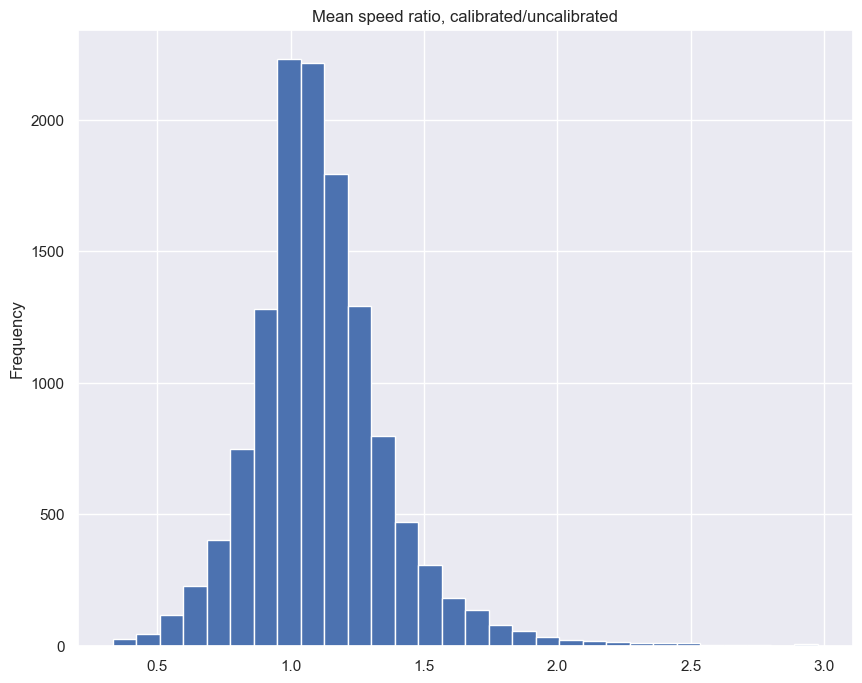

In [ ]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

    # with curve fitting (https://stackoverflow.com/a/35545265):
    # 
    # def gaussian(x, mean, amplitude, standard_deviation):
    #     return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))

    # metric_data = od_df[f'{metric_name}_ratio']
    # metric_data = metric_data[~is_outlier(metric_data)]
    
    # fig = plt.figure(figsize=(10, 8))
    # bin_heights, bin_borders, _ = plt.hist(metric_data, bins=30)
    # bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    # popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[1., 0., 1.])
    # x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)

    # plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated (outliers removed)')
    # plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), linestyle='dashed')


plot('speed')

In [ ]:
ttime_head

,oid,eid,destination,ttime_ratio
385148,151635184,int_40,0,0.087325
518606,151634913,int_26,0,0.144919
433111,151635718,ext_1,151634880,0.171315
298938,151635736,ext_7,151634543,0.173944
543305,151635369,int_52,151635721,0.183404
184171,151635369,int_52,151635727,0.191894
29324,151635727,ext_4,151634526,0.195407
338419,151634794,int_19,151635718,0.195790
340249,151635184,int_40,151635727,0.196793
411469,151635745,ext_10,151635291,0.197021


In [ ]:
ttime_tail

,oid,eid,destination,ttime_ratio
431255,151635403,int_54,151635739,4.002838
364960,151635541,int_66,151635736,4.007527
472409,151634638,int_11,0,4.017531
456031,151635733,ext_6,151635521,4.039948
472837,151634723,int_16,151635727,4.057021
544003,151635479,int_60,151635727,4.195872
343744,151635733,ext_6,151634562,4.226791
366455,151635742,ext_9,151634638,4.257741
388681,151635733,ext_6,151635369,4.259770
157807,151634562,int_7,151635718,4.327513


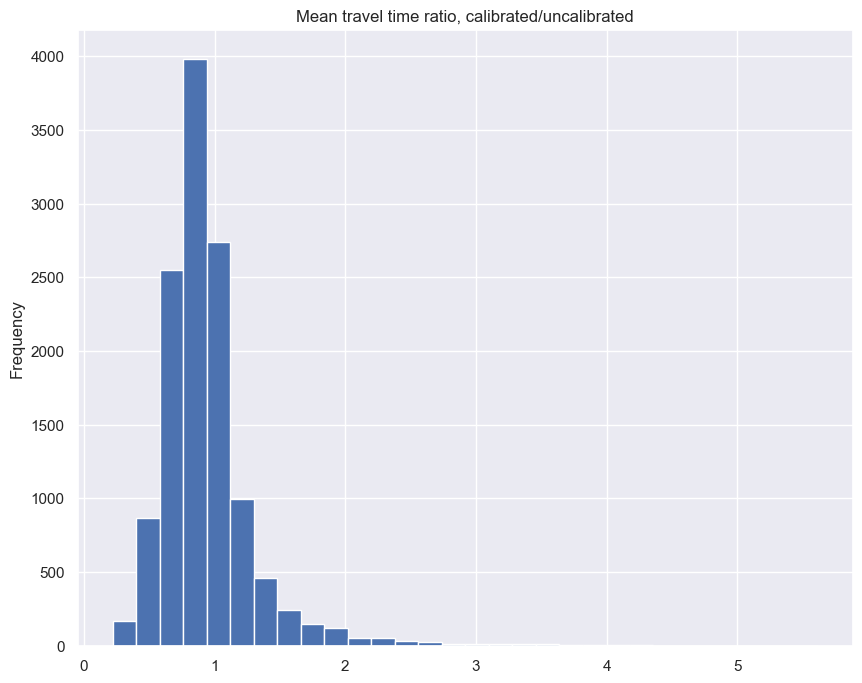

In [ ]:
plot('ttime')

In [ ]:
dtime_head

,oid,eid,destination,dtime_ratio
141295,151635718,ext_1,151634562,0.000000
7395,151635745,ext_10,151634377,0.004799
456342,151635745,ext_10,151634935,0.007616
432907,151635666,int_73,151635736,0.012855
385148,151635184,int_40,0,0.013747
119625,151635745,ext_10,151634377,0.013979
209080,151635733,ext_6,151634794,0.015503
115965,151635210,int_42,151635733,0.016198
411146,151635733,ext_6,151635648,0.019545
186212,151635718,ext_1,151635051,0.020080


In [ ]:
dtime_tail

,oid,eid,destination,dtime_ratio
411340,151635742,ext_9,151634517,15.702178
141198,151635689,int_74,151635742,15.734976
478753,151635742,ext_9,151635727,15.976498
388901,151635742,ext_9,151634638,16.268689
494855,151634638,int_11,0,16.288210
411087,151635733,ext_6,151634657,16.817309
142137,151635745,ext_10,151635541,16.824223
1129,151634657,int_12,151635745,17.806989
501199,151635742,ext_9,151635727,18.744570
475621,151635317,int_48,151635727,20.033023


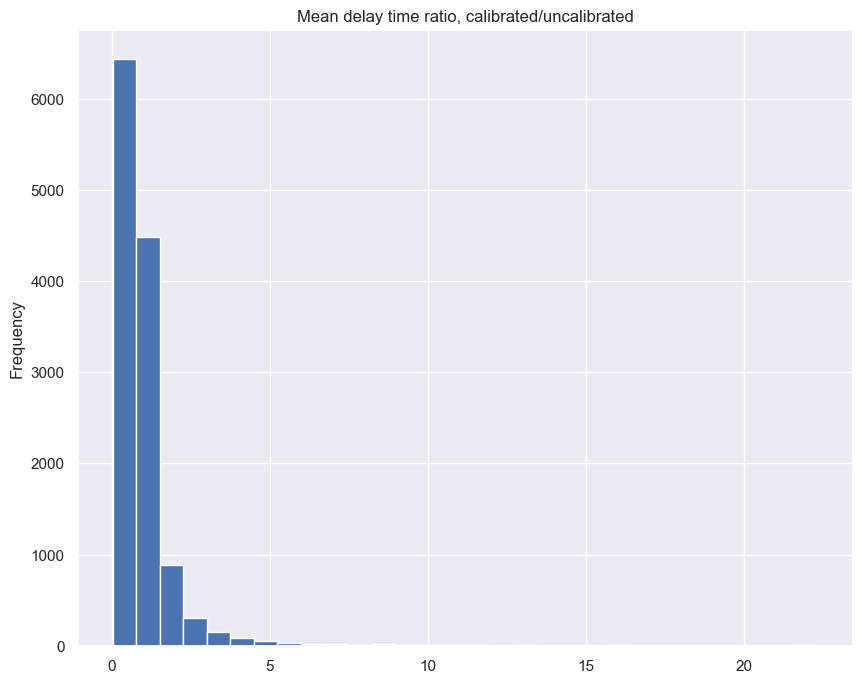

In [ ]:
plot('dtime')

In [ ]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio', f'{metric_name}_uncoordinated', f'{metric_name}_coordinated']].sort_values(by=f'{metric_name}_ratio')
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

dtime_head, dtime_tail = most_impacted('dtime', 30)

In [ ]:
mean_dist_head

,oid,eid,destination,mean_dist_ratio
518606,151634913,int_26,0,0.142530
543305,151635369,int_52,151635721,0.184874
433111,151635718,ext_1,151634880,0.212069
517987,151634794,int_19,151635718,0.218454
298938,151635736,ext_7,151634543,0.225798
411469,151635745,ext_10,151635291,0.234409
385148,151635184,int_40,0,0.256996
298676,151635727,ext_4,151634526,0.277922
366014,151635727,ext_4,151634526,0.291545
224630,151634402,int_1,151635739,0.299933


In [ ]:
mean_dist_tail

,oid,eid,destination,mean_dist_ratio
519121,151635051,int_32,151635727,3.323676
70201,151635051,int_32,151635727,3.342916
544003,151635479,int_60,151635727,3.360703
343640,151635727,ext_4,151635721,3.402636
472409,151634638,int_11,0,3.517586
427169,151634562,int_7,0,3.524444
253724,151635724,ext_3,151635051,3.599012
545410,151635721,ext_2,151634562,3.672587
478016,151635718,ext_1,151635156,3.934780
50807,151635580,int_67,0,3.957031


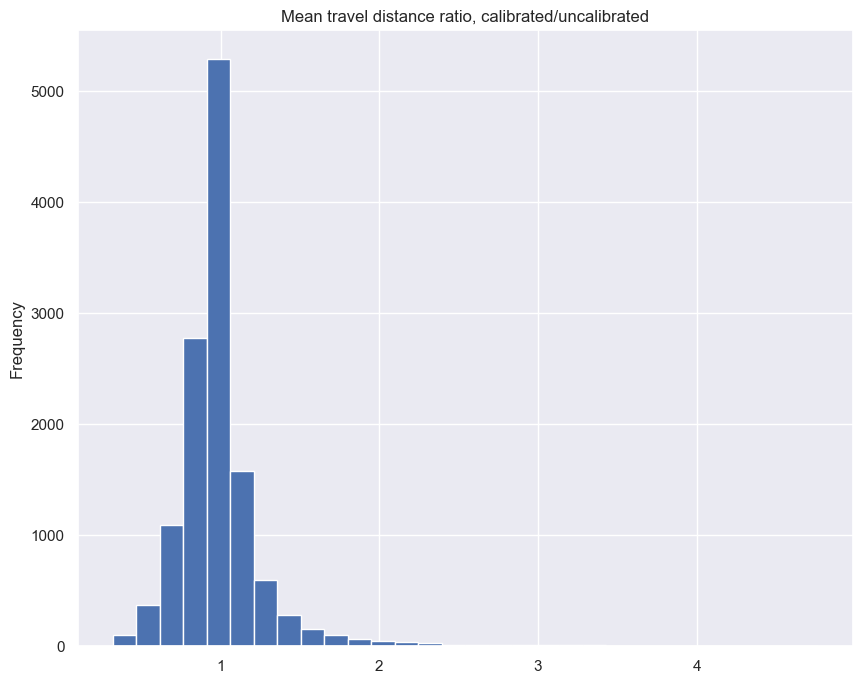

In [ ]:
od_columns['mean_dist'] = mean_dist
plot('mean_dist')

In [ ]:
centroids = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp')
centroids

,id,eid,name,type,percentage,geometry
0,151630699.0,int_0,int_0,from_to,nothing,POINT (594180.928 4153952.743)
1,151630724.0,int_1,int_1,from_to,nothing,POINT (592545.036 4155899.879)
2,151630733.0,int_2,int_2,from_to,nothing,POINT (595661.828 4152106.190)
3,151630752.0,int_3,int_3,from_to,nothing,POINT (596205.194 4154563.504)
4,151630839.0,int_4,int_4,from_to,nothing,POINT (593310.093 4154654.882)
...,...,...,...,...,...,...
81,151632055.0,ext_6,ext_6,from_to,nothing,POINT (592975.725 4152220.472)
82,151632058.0,ext_7,ext_7,from_to,nothing,POINT (592179.865 4155425.934)
83,151632061.0,ext_8,ext_8,from_to,nothing,POINT (593115.025 4156815.397)
84,151632064.0,ext_9,ext_9,from_to,nothing,POINT (595501.160 4156449.955)


In [ ]:
od_df[od_df['oid']==151635727]['eid'].unique()

array(['ext_4'], dtype=object)

In [ ]:
centroids[centroids['eid']=='ext_4']

,id,eid,name,type,percentage,geometry
79,151632049.0,ext_4,ext_4,from_to,nothing,POINT (595684.167 4149732.229)


In [ ]:
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
546173,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [ ]:
od_df[od_df['oid']==151635727]

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
6875,44.448167,257.199941,127.462022,3.175574,64.037838,134.138906,27.244072,2.386102,151635727,ext_4,151634411,1.440731,0.521536,0.213743,0.751392
6876,37.320815,486.543143,228.874549,5.043941,68.332362,242.343616,30.470995,4.599975,151635727,ext_4,151634430,1.830945,0.498093,0.133134,0.911980
6877,67.588219,384.494704,52.424421,7.218698,73.579028,353.189121,21.118838,7.218698,151635727,ext_4,151634517,1.088637,0.918580,0.402844,1.000000
6878,61.204145,124.638857,14.300421,2.119004,58.075985,122.929957,22.015616,1.983133,151635727,ext_4,151634526,0.948890,0.986289,1.539508,0.935880
6879,65.992246,258.557063,74.314427,4.739656,75.695016,217.618974,33.027211,4.575742,151635727,ext_4,151634543,1.147029,0.841667,0.444425,0.965417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545654,32.598260,412.755326,233.611947,3.737529,30.535892,648.908108,427.854176,5.504163,151635727,ext_4,151635721,0.936734,1.572137,1.831474,1.472674
545657,54.290743,455.042178,140.823559,6.862383,48.777151,464.864668,172.919240,6.298548,151635727,ext_4,151635730,0.898443,1.021586,1.227914,0.917837
545658,62.024713,267.851414,98.425201,4.614835,69.476149,230.232331,62.882098,4.443238,151635727,ext_4,151635733,1.120137,0.859552,0.638882,0.962816
545661,100.137572,305.978434,17.218999,8.511094,100.487418,304.921195,16.195414,8.511318,151635727,ext_4,151635742,1.003494,0.996545,0.940555,1.000026


In [ ]:
od_df = od_df.reset_index(drop=True)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
1,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
2,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
3,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
4,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13381,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
13382,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
13383,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
13384,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [ ]:
# for each destination, find a matching oid, find the corresponding eid, and add it to the dataframe
od_df['destination_eid'] = od_df[['destination', 'eid']].merge(od_df.drop_duplicates('oid'), how='left', left_on='destination', right_on='oid')['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4
1,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171,ext_6
2,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898,ext_10
3,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849,NaN
4,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749,ext_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13381,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628,int_69
13382,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71
13383,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396,int_73
13384,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089,int_74


In [ ]:
od_df.dropna(inplace=True)

In [ ]:
centroids[centroids['eid']=='int_0']['geometry']

0    POINT (594180.928 4153952.743)
Name: geometry, dtype: geometry

In [ ]:
od_df = od_df.merge(centroids[['eid', 'geometry']], on='eid').rename(columns={'geometry': 'geometry_o'})
od_df = od_df.merge(centroids[['eid', 'geometry']], left_on='destination_eid', right_on='eid').rename(columns={'geometry': 'geometry_d'})
# section_df = gpd.GeoDataFrame(section_df, geometry='geometry')

od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),int_71,POINT (592500.283 4154266.046)
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135)
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135)
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (592356.096 4154524.181),int_15,POINT (594252.375 4152933.135)


In [ ]:
from shapely.geometry import Point, LineString, Polygon

od_df['geometry'] = od_df[['geometry_o', 'geometry_d']].apply(lambda *args: LineString(*args), axis=1)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),ext_4,POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),int_71,POINT (592500.283 4154266.046),LINESTRING (592356.096014848 4154524.181414859...
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),int_15,POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (592356.096 4154524.181),int_15,POINT (594252.375 4152933.135),LINESTRING (592356.096014848 4154524.181414859...


In [ ]:
od_df.rename(columns={'eid_x': 'eid'})
del od_df['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),LINESTRING (594180.9279909714 4153952.74253129...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),POINT (592500.283 4154266.046),LINESTRING (592356.096014848 4154524.181414859...
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),LINESTRING (595684.1668666241 4149732.22909696...
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (592356.096 4154524.181),POINT (594252.375 4152933.135),LINESTRING (592356.096014848 4154524.181414859...


In [ ]:
od_df = gpd.GeoDataFrame(od_df, geometry='geometry')
od_df.crs = 'EPSG:3857'
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (594180.928 4153952.743),POINT (595684.167 4149732.229),"LINESTRING (594180.928 4153952.743, 595684.167..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (592356.096 4154524.181),POINT (592500.283 4154266.046),"LINESTRING (592356.096 4154524.181, 592500.283..."
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),"LINESTRING (595684.167 4149732.229, 594252.375..."
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (595684.167 4149732.229),POINT (594252.375 4152933.135),"LINESTRING (595684.167 4149732.229, 594252.375..."
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (592356.096 4154524.181),POINT (594252.375 4152933.135),"LINESTRING (592356.096 4154524.181, 594252.375..."


In [ ]:
od_df.groupby(['eid_x', 'destination_eid']).size().reset_index(name='num_trips')

,eid_x,destination_eid,num_trips
0,ext_1,ext_4,25
1,ext_1,ext_9,25
2,ext_1,int_0,22
3,ext_1,int_1,17
4,ext_1,int_11,18
...,...,...,...
977,int_8,ext_5,4
978,int_8,ext_6,16
979,int_8,ext_7,13
980,int_8,ext_8,6


In [ ]:
od_df.groupby(['eid_x', 'destination_eid']).mean().reset_index()

,eid_x,destination_eid,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,ext_1,ext_4,48.778798,163.210490,90.817489,2.031444,43.952550,252.945667,165.505013,2.415006,151635718.0,151635727.0,0.876795,1.513957,1.738668,1.256130
1,ext_1,ext_9,45.897654,938.253990,467.775647,11.639565,55.066129,713.964463,311.547435,10.234456,151635718.0,151635742.0,1.202926,0.766853,0.656375,0.887088
2,ext_1,int_0,42.222810,696.284381,350.523937,7.803327,46.873261,652.416028,314.718960,7.658269,151635718.0,151634377.0,1.153515,1.015517,1.119017,0.988610
3,ext_1,int_1,42.837020,881.051748,368.189862,10.270667,53.762363,671.771139,210.657794,9.886921,151635718.0,151634402.0,1.275272,0.779363,0.645384,0.966218
4,ext_1,int_11,49.920756,732.876440,351.234659,9.590928,55.575417,633.052848,247.120805,9.455386,151635718.0,151634638.0,1.131676,0.886696,0.739487,0.986128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,int_8,ext_5,41.474406,422.262595,138.913396,4.846292,40.608153,413.596639,148.840636,4.500638,151634607.0,151635730.0,0.974287,0.968125,1.115570,0.929363
978,int_8,ext_6,35.815211,430.338663,178.979433,4.256666,47.642079,291.834330,77.698932,3.809383,151634607.0,151635733.0,1.340021,0.693158,0.464618,0.908174
979,int_8,ext_7,38.006582,578.057284,184.488285,6.022252,47.639776,483.553452,89.352698,6.232451,151634607.0,151635736.0,1.265474,0.854452,0.565628,1.043727
980,int_8,ext_8,38.503184,528.822492,166.538630,5.620882,44.095882,401.022795,94.617479,4.857950,151634607.0,151635739.0,1.151096,0.769952,0.574692,0.873260


In [ ]:
od_df.sort_values('speed_ratio')

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_calibrated,ttime_calibrated,dtime_calibrated,mean_dist_calibrated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
6387,52.009781,36.916287,14.346550,0.533336,8.225835,215.329987,193.439180,0.492019,151635718,ext_1,151635184,0.158159,5.832926,13.483324,0.922532,int_40,POINT (594457.347 4149562.362),POINT (594803.056 4149777.261),"LINESTRING (594457.347 4149562.362, 594803.056..."
5699,37.883461,74.362924,30.601468,0.782535,8.250994,394.377134,338.342388,0.903890,151635718,ext_1,151634562,0.217799,5.303411,11.056410,1.155080,int_7,POINT (594457.347 4149562.362),POINT (595234.984 4149939.736),"LINESTRING (594457.347 4149562.362, 595234.984..."
9462,63.876114,374.569241,125.949314,6.646119,14.896568,1405.546844,1065.855779,5.816062,151635718,ext_1,151634377,0.233210,3.752435,8.462577,0.875107,int_0,POINT (594457.347 4149562.362),POINT (594180.928 4153952.743),"LINESTRING (594457.347 4149562.362, 594180.928..."
10454,67.229622,116.652424,15.002786,2.178472,17.495358,496.675849,390.024873,2.413756,151635742,ext_9,151634638,0.260233,4.257741,25.996829,1.108004,int_11,POINT (595501.160 4156449.955),POINT (594208.129 4156110.158),"LINESTRING (595501.160 4156449.955, 594208.129..."
2651,35.917647,263.277528,119.356940,2.626753,9.573000,559.803973,465.101531,1.488612,151634562,int_7,151635718,0.266526,2.126288,3.896728,0.566712,ext_1,POINT (595234.984 4149939.736),POINT (594457.347 4149562.362),"LINESTRING (595234.984 4149939.736, 594457.347..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7335,12.176857,730.345283,596.739574,2.470364,49.578521,165.764565,30.490371,2.282878,151635727,ext_4,151635521,4.071537,0.226967,0.051095,0.924106,int_64,POINT (595684.167 4149732.229),POINT (595687.140 4151463.150),"LINESTRING (595684.167 4149732.229, 595687.140..."
1953,11.013664,237.776870,197.781711,0.727443,45.750390,113.296209,30.851096,1.439818,151634657,int_12,151635745,4.153966,0.476481,0.155986,1.979287,ext_10,POINT (592893.285 4153822.951),POINT (592356.096 4154524.181),"LINESTRING (592893.285 4153822.951, 592356.096..."
8791,16.703130,1330.476381,1004.486340,6.173089,69.632313,437.830810,119.356119,8.468659,151635718,ext_1,151635245,4.168818,0.329078,0.118823,1.371867,int_44,POINT (594457.347 4149562.362),POINT (595562.104 4155167.034),"LINESTRING (594457.347 4149562.362, 595562.104..."
7798,12.699611,649.457161,537.074759,2.291070,58.350632,144.991283,40.555221,2.350093,151635727,ext_4,151634526,4.594679,0.223250,0.075511,1.025762,int_5,POINT (595684.167 4149732.229),POINT (595265.212 4151362.353),"LINESTRING (595684.167 4149732.229, 595265.212..."


Below is a big plot that takes a while to run. Instead, I've decided to split into subplots and save them individually.

In [ ]:
# fig, axs = plt.subplots(4, 2, figsize=(15,30))
# fig.suptitle('Relative OD aggregated over time')
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
#         suffix = ['_uncoordinated', '_coordinated'][j]
#         taz_int.plot(ax=ax, color='#353535', zorder=0)
#         taz_int.boundary.plot(ax=ax, color='black', zorder=1)
#         od_df.sort_values(by=metric.name+suffix).plot(
#             ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, zorder=2)
#         # node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
#         ax.set_title(f'{metric.desc} {suffix[1:]} ({metric.unit})')
#         ax.axis('off')

# plt.subplots_adjust(wspace=-.7)
# plt.show()

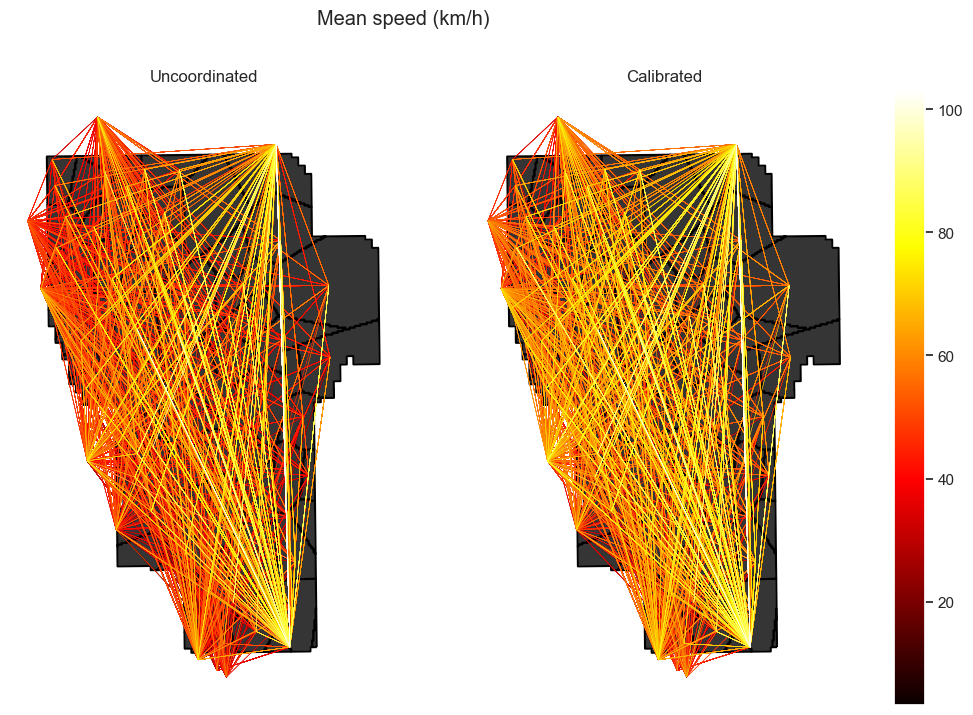

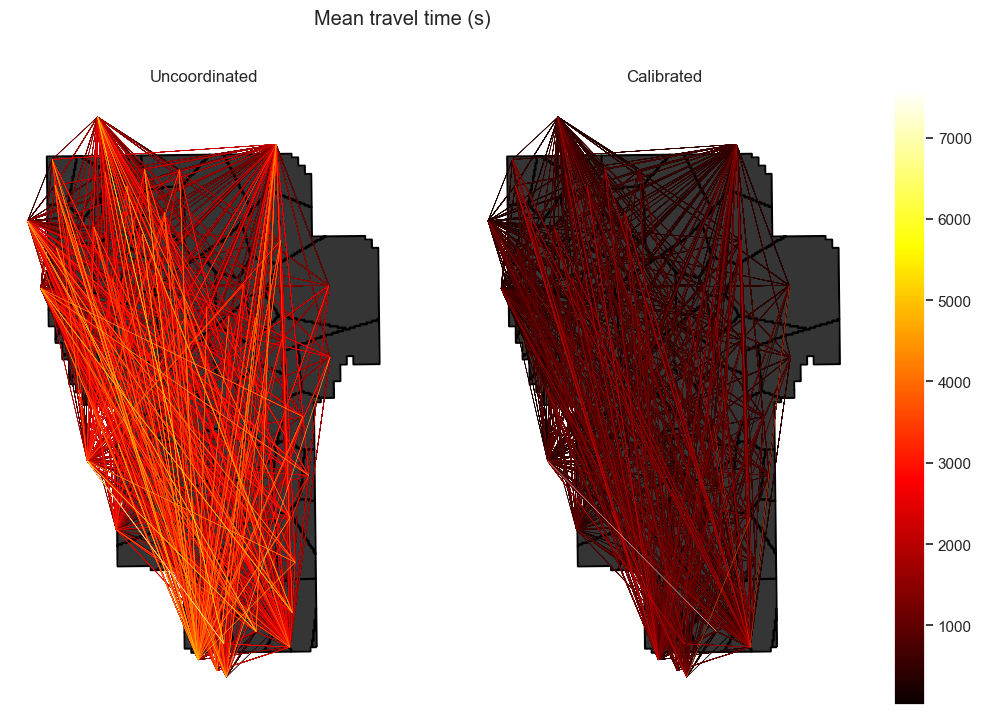

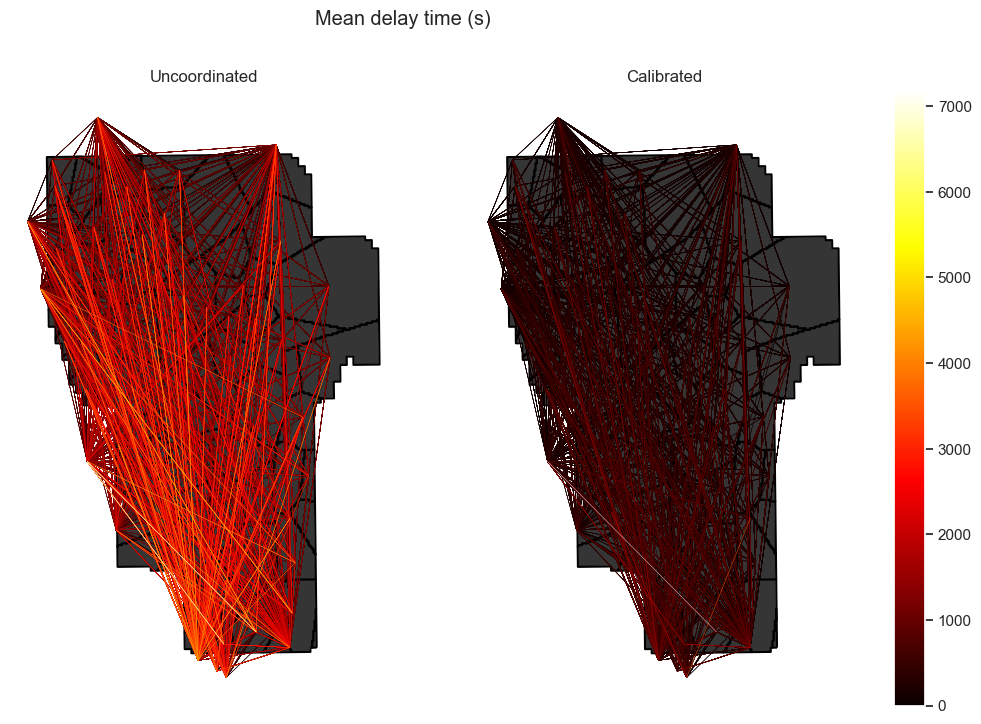

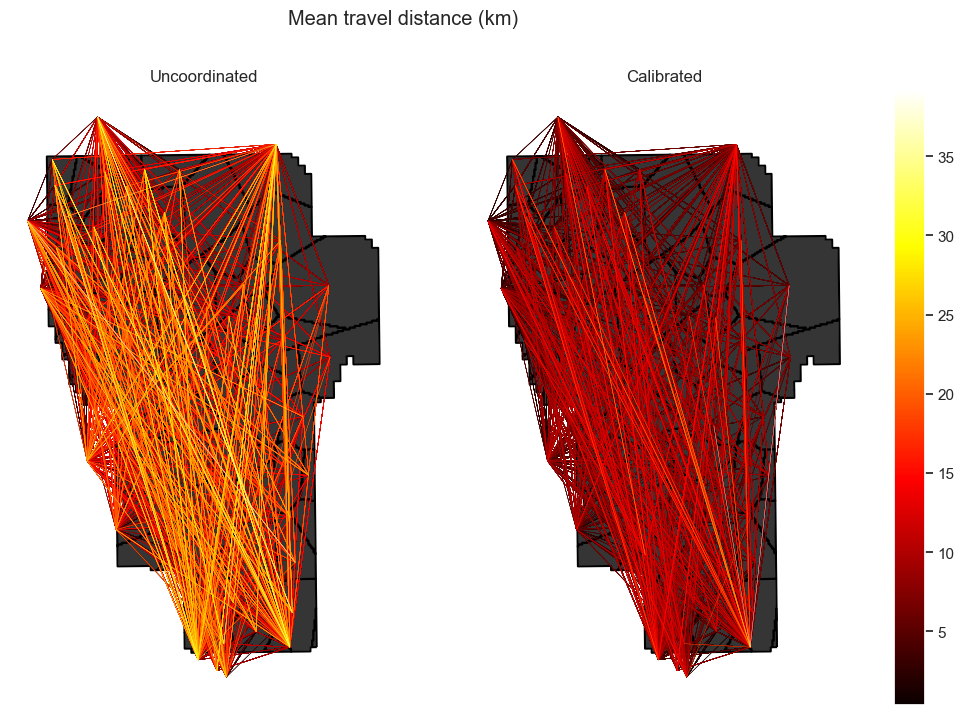

In [ ]:
for i in range(4):
    fig, axs = plt.subplots(1, 2, figsize=(15, 8))
    metric = od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
    fig.suptitle(f'{metric.desc} ({metric.unit})')
    for j in range(2):
        suffix = ['_uncoordinated', '_coordinated'][j]
        label = ['Uncoordinated', 'coordinated'][j]
        ax = axs[j]
        taz_int.plot(ax=ax, color='#353535', zorder=0)
        taz_int.boundary.plot(ax=ax, color='black', zorder=1)
        od_df.sort_values(by=metric.name+suffix).plot(
            ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, zorder=2)
        ax.set_title(label)
        ax.axis('off')

    plt.subplots_adjust(wspace=-0.4)
    plt.savefig(f'{image_path}\\centroid-{metric.name}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()

In [ ]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

<a id='trajectory'></a>
# Trajectories

In [ ]:
uncoordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', uncoordinated_con)
uncoordinated_trajectory_df = pd.DataFrame(uncoordinated_trajectory_query)

uncoordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None


In [ ]:
uncoordinated_trajectory_df

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3068,151642198,91275,151590242,151635727,151635742,0,21241.10000,21241.30000,21557.700,0.0,5.30547,8502.56,None
3069,151642198,91278,151590242,151635742,151635727,0,21241.50000,21241.50000,21539.100,0.0,18.28580,8635.38,None
3070,151642198,91280,151590242,151635727,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.03300,8490.61,None
3071,151642198,91290,151590242,151635742,151635727,0,21245.40000,21245.40000,21543.200,0.0,16.28200,8632.46,None


In [ ]:
uncoordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', uncoordinated_con)
uncoordinated_detailed_trajectory_df = pd.DataFrame(uncoordinated_detailed_trajectory_query)

uncoordinated_detailed_trajectory_df.head()

,did,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance,acceleration
0,151642198,29,1,3400,1,595671.15,4149769.75,7.08379,105.59,3.41,0.0
1,151642198,29,2,3400,1,595660.26,4149790.54,7.20000,105.59,26.87,0.0
2,151642198,29,3,3400,1,595649.38,4149811.32,8.00000,105.59,50.34,0.0
3,151642198,29,4,3400,1,595638.5,4149832.11,8.80000,105.59,73.8,0.0
4,151642198,29,5,2752,1,595629.09,4149852.68,9.60000,105.59,97.26,0.0


In [ ]:
uncoordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None


In [ ]:
coordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', coordinated_con)
coordinated_trajectory_df = pd.DataFrame(coordinated_trajectory_query)

coordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.448,0.0,1.42955,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.264,0.0,5.69052,8629.10,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,337.770,0.0,9.37387,8658.64,None


In [ ]:
coordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', coordinated_con)
coordinated_detailed_trajectory_df = pd.DataFrame(coordinated_detailed_trajectory_query)

coordinated_detailed_trajectory_df.head()

,did,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance,acceleration
0,151642198,29,1,3400,1,595671.15,4149769.75,7.08379,105.59,3.41,0.0
1,151642198,29,2,3400,1,595660.26,4149790.54,7.20000,105.59,26.87,0.0
2,151642198,29,3,3400,1,595649.38,4149811.32,8.00000,105.59,50.34,0.0
3,151642198,29,4,3400,1,595638.5,4149832.11,8.80000,105.59,73.8,0.0
4,151642198,29,5,2752,1,595629.09,4149852.68,9.60000,105.59,97.26,0.0


In [ ]:
def od_demand(df):
    return df.groupby(['origin', 'destination']).size().reset_index(name='freq').sort_values(by='freq', ascending=False)

od_demand(uncoordinated_trajectory_df)

,origin,destination,freq
8,151635727,151635742,993
15,151635742,151635727,790
13,151635742,151635718,452
1,151635718,151635742,354
4,151635727,151635718,118
0,151635718,151635727,105
17,151635742,151635733,69
3,151635721,151635742,62
10,151635730,151635742,42
12,151635733,151635742,37


In [ ]:
od_demand(coordinated_trajectory_df)

,origin,destination,freq
8,151635727,151635742,993
15,151635742,151635727,791
13,151635742,151635718,438
1,151635718,151635742,360
4,151635727,151635718,119
0,151635718,151635727,112
17,151635742,151635733,70
3,151635721,151635742,63
10,151635730,151635742,50
12,151635733,151635742,33


In [ ]:
od_df[od_df['oid']==151635727]['eid_x'].unique()[0]

'ext_4'

In [ ]:
dfs_traj = {
    'uncoordinated': uncoordinated_detailed_trajectory_df.merge(uncoordinated_trajectory_df, how='left', on='oid'),
    'coordinated': coordinated_detailed_trajectory_df.merge(coordinated_trajectory_df, how='left', on='oid')
}

top_pairs_oid = [
    (151635727, 151635742),
    (151635742, 151635727),
    (151635742, 151635718),
    (151635718, 151635742),
    (151635727, 151635718),
    (151635718, 151635727),
]

dfs_traj_top = {}

def astype_per_column(df, columns, dtype):
    for col in columns:
        df[col] = df[col].astype(dtype)

for k in dfs_traj:
    for p in top_pairs_oid:
        o_oid, d_oid = p
        o_eid = od_df[od_df['oid']==o_oid]['eid_x'].unique()[0]
        d_eid = od_df[od_df['oid']==d_oid]['eid_x'].unique()[0]
        key = f'{o_eid}_{d_eid}_{k}'
        dfs_traj_top[key] = dfs_traj[k][(dfs_traj[k]['origin']==o_oid) & (dfs_traj[k]['destination']==d_oid)]
        astype_per_column(dfs_traj_top[key], ['xCoord', 'yCoord'], float)

dfs_traj_top['ext_4_ext_9_uncoordinated'].head()


C:\Users\prest\AppData\Local\Temp\ipykernel_15440\3413748616.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(dtype)


,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None


In [ ]:
for k, df in dfs_traj_top.items():
    dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)
    print(dfs_traj_top[k].head())

# dfs_traj_top['ext_4_ext_9_uncoordinated'].head()

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
136  151642198   31    1       3400          3  595659.46  4149779.13   
137  151642198   31    2       3400          3  595649.35  4149798.44   
138  151642198   31    3       3400          3  595639.24  4149817.75   
139  151642198   31    4       3400          3  595629.13  4149837.07   
140  151642198   31    5       2752          4  595617.68  4149854.48   

     stationaryTime  speed travelledDistance_x  ... destination  \
136         7.37098  98.09               17.14  ...   151635742   
137         8.00000  98.09               38.94  ...   151635742   
138         8.80000  98.09               60.73  ...   151635742   
139         9.60000  98.12               82.54  ...   151635742   
140        10.40000  98.09              104.34  ...   151635742   

     entranceSection  generationTime  entranceTime  exitTime  \
136                0         6.40615       7.37098   272.465   
137                0         6

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
603  151642198   56    1  151597045          3  595480.40  4156431.96   
604  151642198   56    2  151597045          3  595473.64  4156415.28   
605  151642198   56    3       2873          3  595466.41  4156398.18   
606  151642198   56    4       2873          3  595459.66  4156380.40   
607  151642198   56    5       2873          3  595452.66  4156362.26   

     stationaryTime  speed travelledDistance_x  ... destination  \
603         9.94191  81.58               10.38  ...   151635727   
604        10.40000  80.38               28.38  ...   151635727   
605        11.20000  83.59               46.95  ...   151635727   
606        12.00000  85.58               65.97  ...   151635727   
607        12.80000  87.51               85.42  ...   151635727   

     entranceSection  generationTime  entranceTime  exitTime  \
603                0         9.94191       9.94191   294.713   
604                0         9

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
7688  151642198  617    1  151597045          2  595473.45  4156422.79   
7689  151642198  617    2  151597051          0  595464.12  4156400.62   
7690  151642198  617    3       2873          2  595455.58  4156378.18   
7691  151642198  617    4       2873          2  595447.00  4156355.73   
7692  151642198  617    5       2873          2  595439.37  4156332.94   

      stationaryTime   speed travelledDistance_x  ... destination  \
7688         158.487  108.46               21.49  ...   151635718   
7689         159.200  108.06               45.55  ...   151635718   
7690         160.000  108.06               69.56  ...   151635718   
7691         160.800  108.14               93.59  ...   151635718   
7692         161.600  108.21              117.64  ...   151635718   

      entranceSection  generationTime  entranceTime  exitTime  \
7688                0         158.487       158.487   512.439   
7689      

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
1738  151642198   87    1      30451          2  594493.95  4149597.27   
1739  151642198   87    2      30451          2  594504.12  4149612.15   
1740  151642198   87    3      41482          0  594514.28  4149627.04   
1741  151642198   87    4      31086          2  594525.00  4149641.52   
1742  151642198   87    5      31086          2  594535.86  4149655.75   

      stationaryTime  speed travelledDistance_x  ... destination  \
1738         20.7088  81.12                2.05  ...   151635742   
1739         20.8000  81.12               20.08  ...   151635742   
1740         21.6000  81.12               38.11  ...   151635742   
1741         22.4000  81.12               56.13  ...   151635742   
1742         23.2000   80.0               74.03  ...   151635742   

      entranceSection  generationTime  entranceTime  exitTime  \
1738                0         20.7088       20.7088   412.261   
1739            

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


       did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
0  151642198   29    1       3400          1  595671.15  4149769.75   
1  151642198   29    2       3400          1  595660.26  4149790.54   
2  151642198   29    3       3400          1  595649.38  4149811.32   
3  151642198   29    4       3400          1  595638.50  4149832.11   
4  151642198   29    5       2752          1  595629.09  4149852.68   

   stationaryTime   speed travelledDistance_x  ... destination  \
0         7.08379  105.59                3.41  ...   151635718   
1         7.20000  105.59               26.87  ...   151635718   
2         8.00000  105.59               50.34  ...   151635718   
3         8.80000  105.59                73.8  ...   151635718   
4         9.60000  105.59               97.26  ...   151635718   

   entranceSection  generationTime  entranceTime  exitTime  \
0                0         6.10353       7.08379   113.863   
1                0         6.10353       7.08379   1

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


           did_x   oid  ent  sectionId  laneIndex     xCoord      yCoord  \
17536  151642198  1148    1      30451          2  594496.10  4149600.43   
17537  151642198  1148    2      30451          1  594507.69  4149612.07   
17538  151642198  1148    3      41482          0  594516.80  4149625.41   
17539  151642198  1148    4      31086          1  594526.39  4149638.39   
17540  151642198  1148    5      31086          1  594536.11  4149651.14   

       stationaryTime  speed travelledDistance_x  ... destination  \
17536         285.309  72.67                5.88  ...   151635727   
17537         285.600  72.67               22.03  ...   151635727   
17538         286.400  72.67               38.18  ...   151635727   
17539         287.200  72.67               54.33  ...   151635727   
17540         288.000  71.67               70.36  ...   151635727   

       entranceSection  generationTime  entranceTime  exitTime  \
17536                0         285.309       285.309   367.131

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
136  151642198   31    1       3400          3  595659.46  4149779.13   
137  151642198   31    2       3400          3  595649.35  4149798.44   
138  151642198   31    3       3400          3  595639.24  4149817.75   
139  151642198   31    4       3400          3  595629.13  4149837.07   
140  151642198   31    5       2752          4  595617.68  4149854.48   

     stationaryTime  speed travelledDistance_x  ... destination  \
136         7.37098  98.09               17.14  ...   151635742   
137         8.00000  98.09               38.94  ...   151635742   
138         8.80000  98.09               60.73  ...   151635742   
139         9.60000  98.12               82.54  ...   151635742   
140        10.40000  98.09              104.34  ...   151635742   

     entranceSection  generationTime  entranceTime  exitTime  \
136                0         6.40615       7.37098   272.448   
137                0         6

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
603  151642198   56    1  151597045          3  595480.40  4156431.96   
604  151642198   56    2  151597045          3  595473.64  4156415.28   
605  151642198   56    3       2873          3  595466.41  4156398.18   
606  151642198   56    4       2873          3  595459.66  4156380.40   
607  151642198   56    5       2873          3  595452.66  4156362.26   

     stationaryTime  speed travelledDistance_x  ... destination  \
603         9.94191  81.58               10.38  ...   151635727   
604        10.40000  80.38               28.38  ...   151635727   
605        11.20000  83.59               46.95  ...   151635727   
606        12.00000  85.58               65.97  ...   151635727   
607        12.80000  87.51               85.42  ...   151635727   

     entranceSection  generationTime  entranceTime  exitTime  \
603                0         9.94191       9.94191   294.264   
604                0         9

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
8057  151642198  617    1  151597045          2  595473.45  4156422.79   
8058  151642198  617    2  151597051          0  595464.12  4156400.62   
8059  151642198  617    3       2873          2  595455.58  4156378.18   
8060  151642198  617    4       2873          2  595447.00  4156355.73   
8061  151642198  617    5       2873          2  595439.37  4156332.94   

      stationaryTime   speed travelledDistance_x  ... destination  \
8057         158.487  108.46               21.49  ...   151635718   
8058         159.200  108.06               45.55  ...   151635718   
8059         160.000  108.06               69.56  ...   151635718   
8060         160.800  108.14               93.59  ...   151635718   
8061         161.600  108.21              117.64  ...   151635718   

      entranceSection  generationTime  entranceTime  exitTime  \
8057                0         158.487       158.487   518.513   
8058      

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
1742  151642198   87    1      30451          2  594493.95  4149597.27   
1743  151642198   87    2      30451          2  594504.12  4149612.15   
1744  151642198   87    3      41482          0  594514.28  4149627.04   
1745  151642198   87    4      31086          2  594525.00  4149641.52   
1746  151642198   87    5      31086          2  594535.86  4149655.75   

      stationaryTime  speed travelledDistance_x  ... destination  \
1742         20.7088  81.12                2.05  ...   151635742   
1743         20.8000  81.12               20.08  ...   151635742   
1744         21.6000  81.12               38.11  ...   151635742   
1745         22.4000  81.12               56.13  ...   151635742   
1746         23.2000   80.0               74.03  ...   151635742   

      entranceSection  generationTime  entranceTime  exitTime  \
1742                0         20.7088       20.7088   403.742   
1743            

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


       did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
0  151642198   29    1       3400          1  595671.15  4149769.75   
1  151642198   29    2       3400          1  595660.26  4149790.54   
2  151642198   29    3       3400          1  595649.38  4149811.32   
3  151642198   29    4       3400          1  595638.50  4149832.11   
4  151642198   29    5       2752          1  595629.09  4149852.68   

   stationaryTime   speed travelledDistance_x  ... destination  \
0         7.08379  105.59                3.41  ...   151635718   
1         7.20000  105.59               26.87  ...   151635718   
2         8.00000  105.59               50.34  ...   151635718   
3         8.80000  105.59                73.8  ...   151635718   
4         9.60000  105.59               97.26  ...   151635718   

   entranceSection  generationTime  entranceTime  exitTime  \
0                0         6.10353       7.08379   113.863   
1                0         6.10353       7.08379   1

C:\Users\prest\AppData\Local\Temp\ipykernel_15440\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


In [ ]:
bruh = gpd.GeoDataFrame(dfs_traj_top['ext_4_ext_9_uncoordinated'], geometry='geometry')
bruh.crs = "EPSG:32610"
bruh.head()

,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType,geometry
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595659.460 4149779.130)
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595649.350 4149798.440)
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595639.240 4149817.750)
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595629.130 4149837.070)
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595617.680 4149854.480)


In [ ]:
bruh.to_crs('EPSG:3857')

,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType,geometry
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571840.702 4507625.053)
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571853.151 4507649.614)
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571865.600 4507674.176)
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571878.049 4507698.751)
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571892.213 4507720.930)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1823715,151642198,91280,369,2879,1,595459.27,4156316.74,21536.00000,96.51,8403.63,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571998.184 4515897.083)
1823716,151642198,91280,370,2879,1,595465.49,4156337.26,21536.80000,96.49,8425.08,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571990.049 4515922.957)
1823717,151642198,91280,371,2879,1,595472.99,4156357.34,21537.60000,96.48,8446.52,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571980.308 4515948.256)
1823718,151642198,91280,372,2879,1,595480.93,4156377.72,21538.40000,98.41,8468.39,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571970.008 4515973.929)


In [ ]:
node_data = od_df[['eid_x', 'geometry_o']].copy()
node_data = gpd.GeoDataFrame(node_data, geometry='geometry_o')
node_data = node_data.to_crs('EPSG:3857').drop_duplicates()
node_data

,eid_x,geometry_o
0,int_0,POINT (-13573642.679 4512924.678)
20,int_1,POINT (-13575676.027 4515411.360)
42,int_2,POINT (-13571804.021 4510567.669)
48,int_3,POINT (-13571083.898 4513667.978)
63,int_4,POINT (-13574729.704 4513825.353)
...,...,...
1698,ext_4,POINT (-13571810.274 4507565.394)
5472,ext_7,POINT (-13576142.758 4514816.830)
5480,ext_8,POINT (-13574944.926 4516561.766)
5500,ext_10,POINT (-13575933.355 4513673.488)


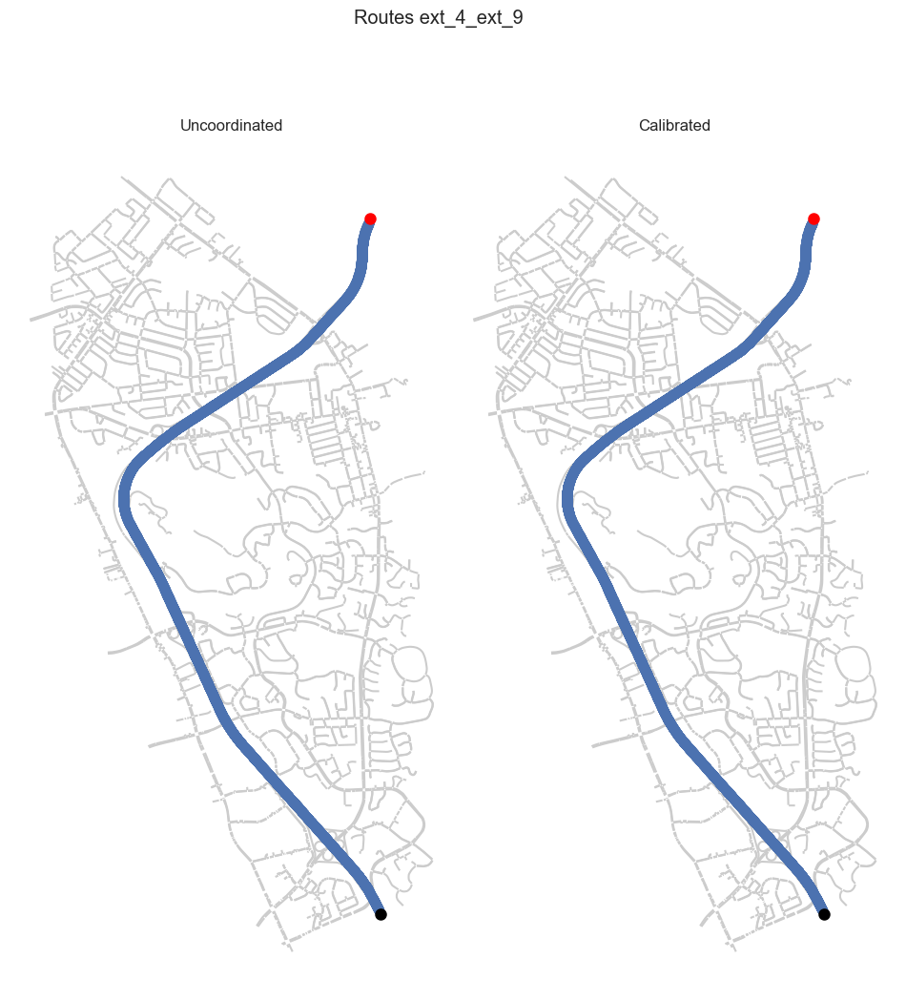

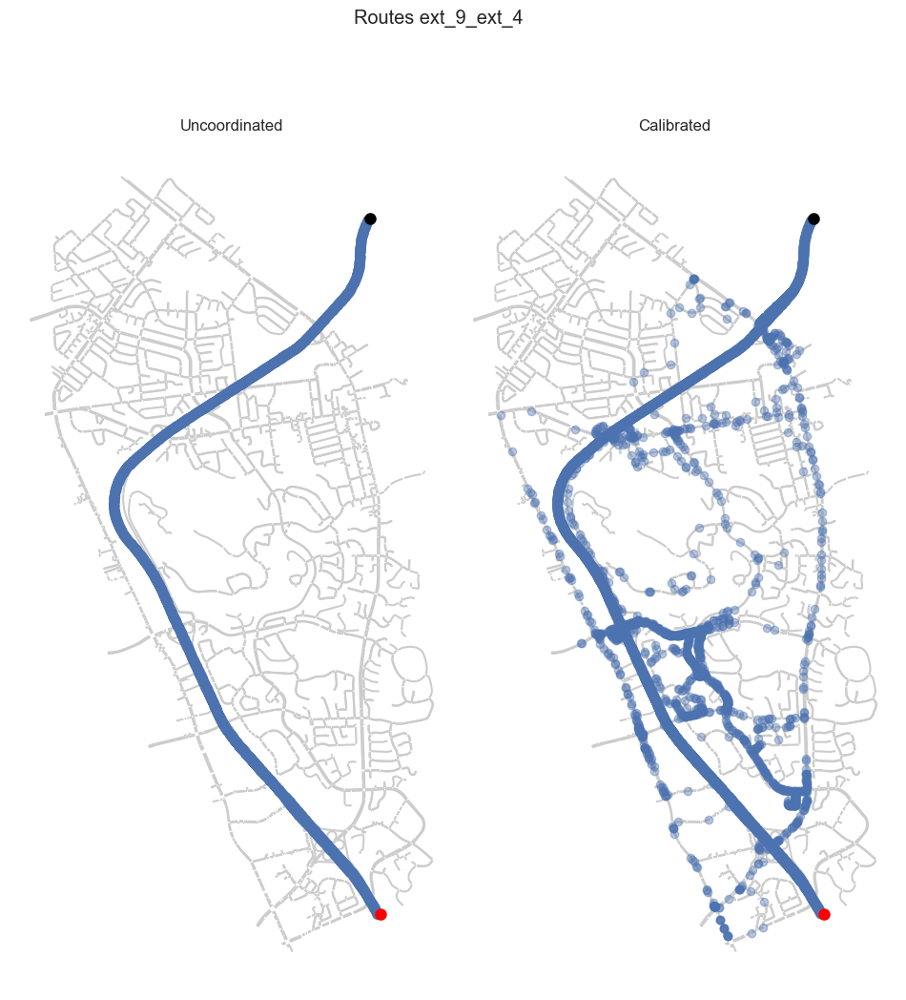

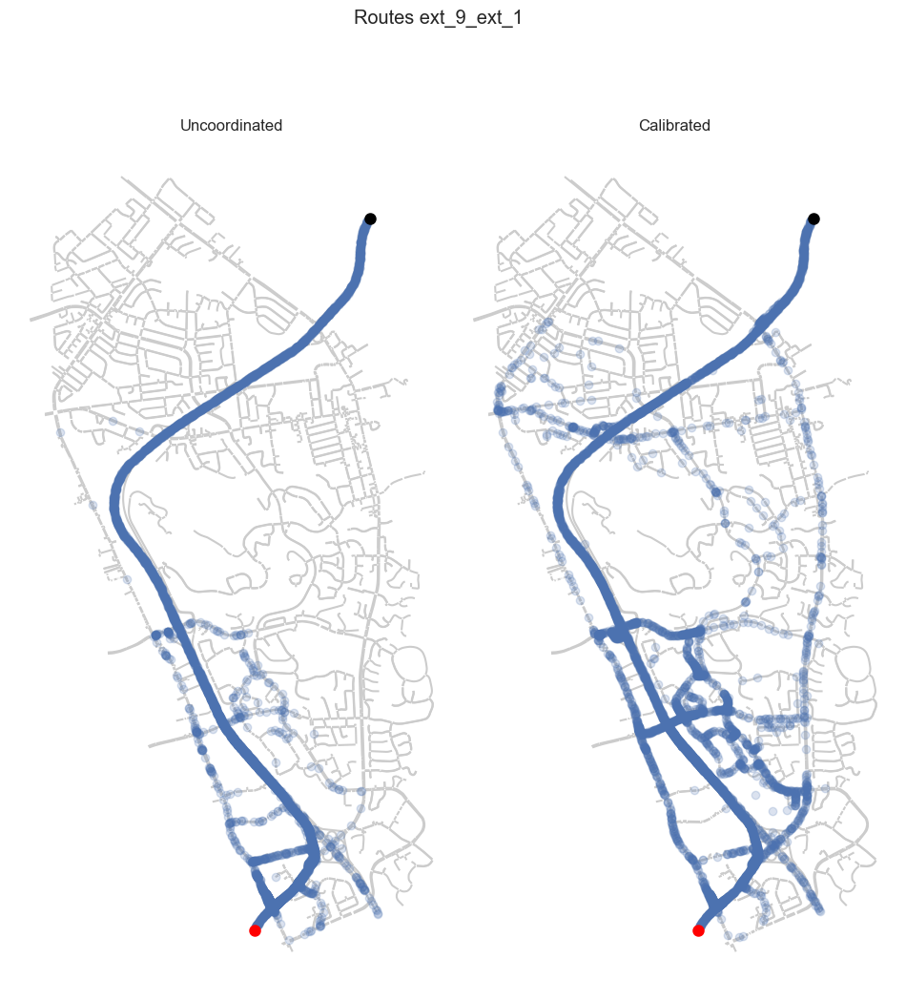

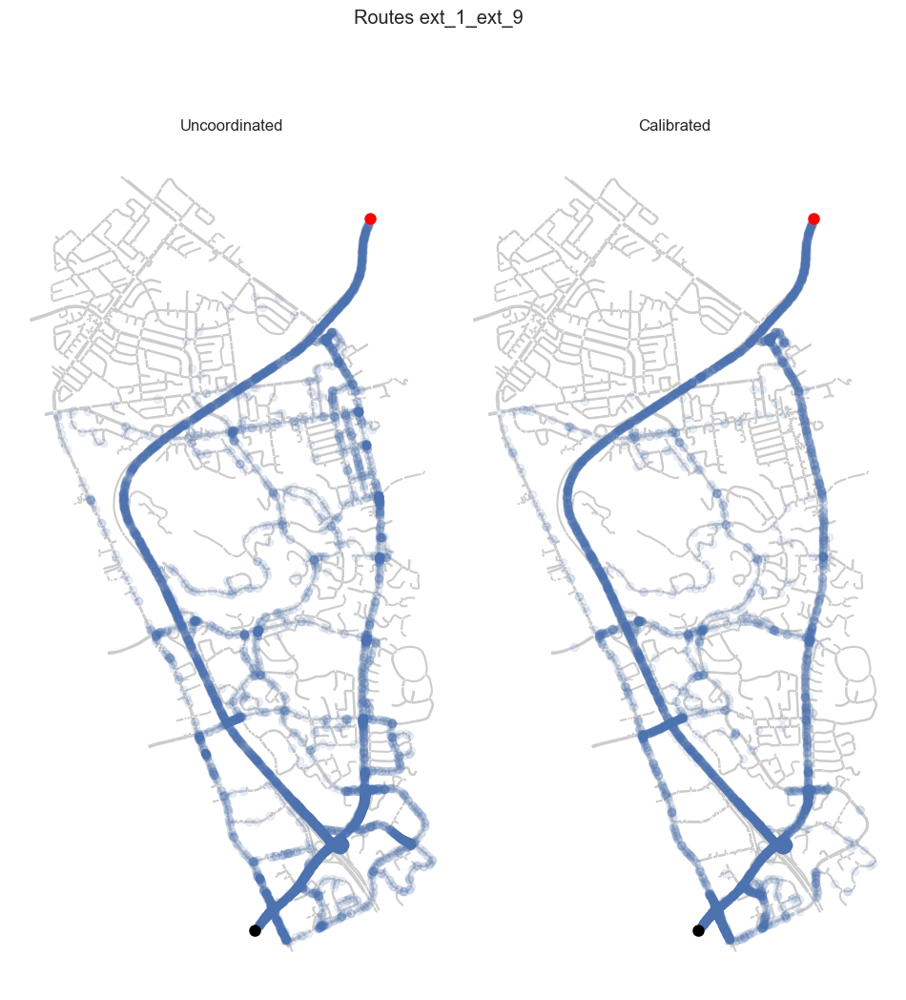

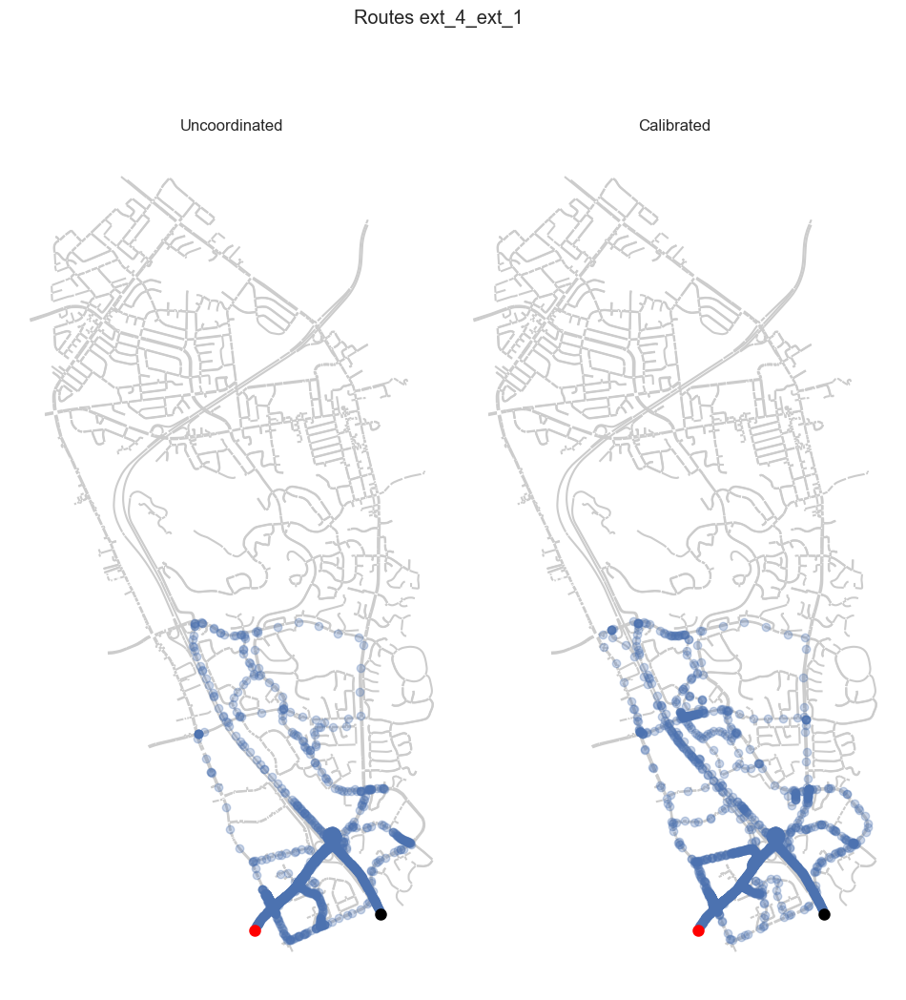

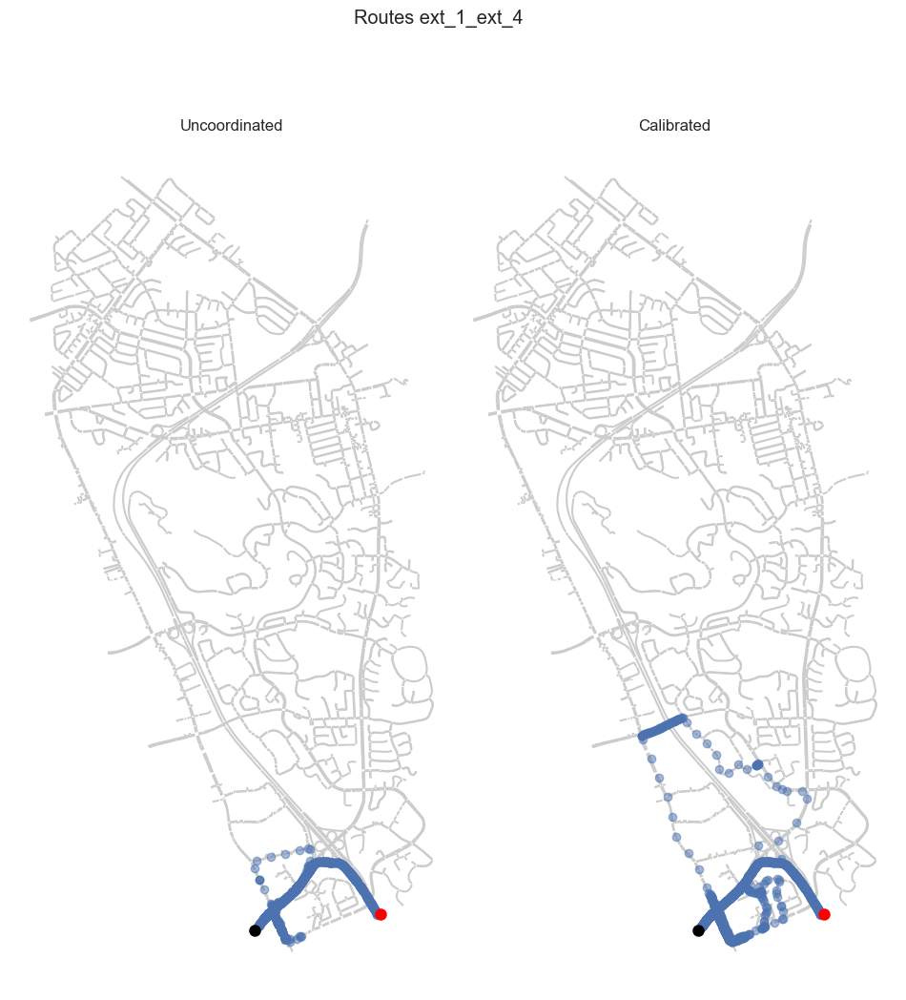

In [ ]:
class ODPlot:
    def __init__(self, origin, destination, sample_every_nth, alpha):
        self.origin = origin
        self.destination = destination
        self.sample_every_nth = sample_every_nth
        self.alpha = alpha
    
    def __repr__(self):
        return f'{self.origin}_{self.destination}'

popular_ods = [
    ODPlot('ext_4', 'ext_9', 10, 0.5),
    ODPlot('ext_9', 'ext_4', 30, 0.4),
    ODPlot('ext_9', 'ext_1', 60, 0.2),
    ODPlot('ext_1', 'ext_9', 50, 0.1),
    ODPlot('ext_4', 'ext_1', 15, 0.3),
    ODPlot('ext_1', 'ext_4', 15, 0.5)
]

def plot_routes(data, ax, type, od):
    ax.set_title(type)
    ax.axis('off')
    data = gpd.GeoDataFrame(data, geometry='geometry').iloc[::od.sample_every_nth, :]
    data.crs = "EPSG:32610"
    data = data.to_crs('EPSG:3857')
    origin = node_data[node_data['eid_x']==od.origin]
    destination = node_data[node_data['eid_x']==od.destination]['geometry_o']

    frame.plot(ax=ax, color='0.8', zorder=0)
    data.plot(ax=ax, lw=1, alpha=od.alpha, zorder=1)
    origin.plot(ax=ax, color='black', lw=3, zorder=2)
    destination.plot(ax=ax, color='red', lw=3, zorder=2)


for i in range(6):
    od = popular_ods[i]
    fig, axs = plt.subplots(1, 2, figsize=(12, 12), squeeze=False)
    plot_routes(dfs_traj_top[f'{str(od)}_uncoordinated'], axs[0][0], 'Uncoordinated', od)
    plot_routes(dfs_traj_top[f'{str(od)}_coordinated'], axs[0][1], 'coordinated', od)
    fig.suptitle(f'Routes {od}')
    plt.subplots_adjust(wspace=0)
    plt.savefig(f'{image_path}\\routes_{od}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()


In [ ]:
# fig, axs = plt.subplots(2, 3, figsize=(16, 18))
# fig.suptitle('Routes')
# for i in range(6):
#     ax = axs[i//3][i%3]
#     ax.axis('off')
#         node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)

# plt.subplots_adjust(wspace=0, hspace=0.1)
# plt.show()

# Emissions

In [ ]:
uncoordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', uncoordinated_con)
uncoordinated_emissions_df = pd.DataFrame(uncoordinated_emissions_query)

uncoordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.749354e+06,0.0,1577.548627,0.0,3830.469273,...,78.739112,0.0,5852.013213,0.0,3.357819,0.0,8.153171,0.0,0.167597,0.0
1,151642198,151642198,None,1,1,7.326504e+05,0.0,481.007896,0.0,1059.753445,...,38.899856,0.0,1559.449725,0.0,1.023827,0.0,2.255690,0.0,0.082799,0.0
2,151642198,151642198,None,2,1,2.016704e+06,0.0,1096.540730,0.0,2770.715828,...,39.839256,0.0,4292.563488,0.0,2.333992,0.0,5.897481,0.0,0.084798,0.0
3,151642198,151642198,None,0,2,4.091769e+06,0.0,2588.799222,0.0,5917.653305,...,148.069969,0.0,8709.349285,0.0,5.510271,0.0,12.595752,0.0,0.315168,0.0
4,151642198,151642198,None,1,2,1.139482e+06,0.0,781.639070,0.0,1694.038238,...,68.443746,0.0,2425.392463,0.0,1.663722,0.0,3.605768,0.0,0.145683,0.0


In [ ]:
coordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', coordinated_con)
coordinated_emissions_df = pd.DataFrame(coordinated_emissions_query)

coordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.712312e+06,0.0,1546.325642,0.0,3690.773125,...,73.111917,0.0,5773.167849,0.0,3.291361,0.0,7.855827,0.0,0.155619,0.0
1,151642198,151642198,None,1,1,6.909020e+05,0.0,451.292610,0.0,929.713416,...,32.977093,0.0,1470.588035,0.0,0.960578,0.0,1.978899,0.0,0.070192,0.0
2,151642198,151642198,None,2,1,2.021410e+06,0.0,1095.033032,0.0,2761.059709,...,40.134825,0.0,4302.579814,0.0,2.330783,0.0,5.876928,0.0,0.085427,0.0
3,151642198,151642198,None,0,2,4.009013e+06,0.0,2468.822826,0.0,5424.977140,...,133.640905,0.0,8533.202553,0.0,5.254900,0.0,11.547088,0.0,0.284455,0.0
4,151642198,151642198,None,1,2,1.046384e+06,0.0,695.598797,0.0,1428.788531,...,57.778409,0.0,2227.233238,0.0,1.480585,0.0,3.041183,0.0,0.122982,0.0


In [ ]:
uncoordinated_emissions_df

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.749354e+06,0.0,1577.548627,0.0,3830.469273,...,78.739112,0.0,5852.013213,0.0,3.357819,0.0,8.153171,0.0,0.167597,0.0
1,151642198,151642198,None,1,1,7.326504e+05,0.0,481.007896,0.0,1059.753445,...,38.899856,0.0,1559.449725,0.0,1.023827,0.0,2.255690,0.0,0.082799,0.0
2,151642198,151642198,None,2,1,2.016704e+06,0.0,1096.540730,0.0,2770.715828,...,39.839256,0.0,4292.563488,0.0,2.333992,0.0,5.897481,0.0,0.084798,0.0
3,151642198,151642198,None,0,2,4.091769e+06,0.0,2588.799222,0.0,5917.653305,...,148.069969,0.0,8709.349285,0.0,5.510271,0.0,12.595752,0.0,0.315168,0.0
4,151642198,151642198,None,1,2,1.139482e+06,0.0,781.639070,0.0,1694.038238,...,68.443746,0.0,2425.392463,0.0,1.663722,0.0,3.605768,0.0,0.145683,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,151642198,151642198,None,1,24,1.044501e+06,0.0,713.205005,0.0,2462.866146,...,46.008333,0.0,2223.224255,0.0,1.518060,0.0,5.242222,0.0,0.097929,0.0
71,151642198,151642198,None,2,24,2.404059e+06,0.0,1674.123667,0.0,4726.821917,...,64.240091,0.0,5117.049753,0.0,3.563380,0.0,10.061062,0.0,0.136735,0.0
72,151642198,151642198,None,0,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0
73,151642198,151642198,None,1,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0


In [ ]:
dfs_emissions = {'uncoordinated': uncoordinated_emissions_df, 'coordinated': coordinated_emissions_df}
emissions_columns = {
    'CO2': Column('CO2', 'Carbon Dioxide Emissions', 'g'),
    'NOx': Column('NOx', 'Carbon Dioxide Emissions', 'g'),
    'VOC': Column('VOC', 'Carbon Dioxide Emissions', 'g'),
    'PM': Column('PM', 'Carbon Dioxide Emissions', 'g'),
    'CO2_Interurban': Column('CO2_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'NOx_Interurban': Column('NOx_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'VOC_Interurban': Column('VOC_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'PM_Interurban': Column('PM_Interurban', 'Carbon Dioxide Emissions', 'g/km')
}
emissions_column_names = list(emissions_columns.keys())

def preprocess_emissions(df):
    df = df[(df['sid']==0) & (df['ent']!=0)][emissions_column_names + ['ent']]
    return df

for k, df in dfs_emissions.items():
    dfs_emissions[k] = preprocess_emissions(df)

dfs_emissions['uncoordinated']

,CO2,NOx,VOC,PM,CO2_Interurban,NOx_Interurban,VOC_Interurban,PM_Interurban,ent
0,2.749354e+06,1577.548627,3830.469273,78.739112,5852.013213,3.357819,8.153171,0.167597,1
3,4.091769e+06,2588.799222,5917.653305,148.069969,8709.349285,5.510271,12.595752,0.315168,2
6,4.351431e+06,2675.414109,6499.735363,157.404664,9262.040768,5.694631,13.834716,0.335037,3
9,4.653101e+06,2882.887328,7103.208832,174.058796,9904.145583,6.136239,15.119212,0.370485,4
12,4.648221e+06,2823.557985,7180.013496,175.902314,9893.759767,6.009956,15.282691,0.374409,5
15,5.006726e+06,3351.003661,7665.366152,204.017048,10656.838768,7.132626,16.315766,0.434251,6
18,5.098063e+06,3232.772948,7933.030600,201.008799,10851.250736,6.880972,16.885491,0.427848,7
21,5.492895e+06,3795.134345,8353.266756,248.138640,11691.652585,8.077960,17.779966,0.528164,8
24,5.062705e+06,3346.028357,7690.814258,221.583747,10775.991140,7.122036,16.369933,0.471642,9
27,5.050682e+06,3181.846278,7796.682315,219.282081,10750.398811,6.772574,16.595273,0.466743,10


In [ ]:
dfs_emissions['coordinated']

,CO2,NOx,VOC,PM,CO2_Interurban,NOx_Interurban,VOC_Interurban,PM_Interurban,ent
0,2.712312e+06,1546.325642,3690.773125,73.111917,5773.167849,3.291361,7.855827,0.155619,1
3,4.009013e+06,2468.822826,5424.977140,133.640905,8533.202553,5.254900,11.547088,0.284455,2
6,4.053613e+06,2427.126234,5491.786177,124.469128,8628.133256,5.166149,11.689292,0.264933,3
9,4.276468e+06,2516.474714,5843.490160,142.075869,9102.482326,5.356328,12.437895,0.302409,4
12,4.200471e+06,2492.464015,5780.491406,138.224390,8940.722247,5.305221,12.303802,0.294211,5
15,4.518501e+06,3006.842890,6100.332533,176.440783,9617.649459,6.400079,12.984585,0.375555,6
18,4.547582e+06,2830.288726,6298.273710,164.302493,9679.549202,6.024282,13.405904,0.349719,7
21,4.823146e+06,3239.369087,6880.225494,193.127757,10266.087831,6.895012,14.644591,0.411073,8
24,4.573608e+06,2951.529437,6595.231950,179.969451,9734.945667,6.282344,14.037981,0.383066,9
27,4.612293e+06,2830.316691,6549.942741,180.291731,9817.286976,6.024342,13.941583,0.383752,10


In [ ]:
emissions_df = dfs_emissions['uncoordinated'][emissions_column_names].join(
    dfs_emissions['coordinated'][emissions_column_names], lsuffix='_uncoordinated', rsuffix='_coordinated')

for metric_name in emissions_column_names:
    emissions_df[f'{metric_name}_ratio'] = emissions_df[f'{metric_name}_coordinated'] / emissions_df[f'{metric_name}_uncoordinated']

emissions_df

,CO2_uncoordinated,NOx_uncoordinated,VOC_uncoordinated,PM_uncoordinated,CO2_Interurban_uncoordinated,NOx_Interurban_uncoordinated,VOC_Interurban_uncoordinated,PM_Interurban_uncoordinated,CO2_calibrated,NOx_calibrated,...,VOC_Interurban_calibrated,PM_Interurban_calibrated,CO2_ratio,NOx_ratio,VOC_ratio,PM_ratio,CO2_Interurban_ratio,NOx_Interurban_ratio,VOC_Interurban_ratio,PM_Interurban_ratio
0,2.749354e+06,1577.548627,3830.469273,78.739112,5852.013213,3.357819,8.153171,0.167597,2.712312e+06,1546.325642,...,7.855827,0.155619,0.986527,0.980208,0.963530,0.928534,0.986527,0.980208,0.963530,0.928534
3,4.091769e+06,2588.799222,5917.653305,148.069969,8709.349285,5.510271,12.595752,0.315168,4.009013e+06,2468.822826,...,11.547088,0.284455,0.979775,0.953656,0.916745,0.902552,0.979775,0.953656,0.916745,0.902552
6,4.351431e+06,2675.414109,6499.735363,157.404664,9262.040768,5.694631,13.834716,0.335037,4.053613e+06,2427.126234,...,11.689292,0.264933,0.931559,0.907196,0.844925,0.790759,0.931559,0.907196,0.844925,0.790759
9,4.653101e+06,2882.887328,7103.208832,174.058796,9904.145583,6.136239,15.119212,0.370485,4.276468e+06,2516.474714,...,12.437895,0.302409,0.919058,0.872901,0.822655,0.816252,0.919058,0.872901,0.822655,0.816252
12,4.648221e+06,2823.557985,7180.013496,175.902314,9893.759767,6.009956,15.282691,0.374409,4.200471e+06,2492.464015,...,12.303802,0.294211,0.903673,0.882739,0.805081,0.785802,0.903673,0.882739,0.805081,0.785802
15,5.006726e+06,3351.003661,7665.366152,204.017048,10656.838768,7.132626,16.315766,0.434251,4.518501e+06,3006.842890,...,12.984585,0.375555,0.902486,0.897296,0.795831,0.864834,0.902486,0.897296,0.795831,0.864834
18,5.098063e+06,3232.772948,7933.030600,201.008799,10851.250736,6.880972,16.885491,0.427848,4.547582e+06,2830.288726,...,13.405904,0.349719,0.892022,0.875499,0.793930,0.817390,0.892022,0.875499,0.793930,0.817390
21,5.492895e+06,3795.134345,8353.266756,248.138640,11691.652585,8.077960,17.779966,0.528164,4.823146e+06,3239.369087,...,14.644591,0.411073,0.878070,0.853558,0.823657,0.778306,0.878070,0.853558,0.823657,0.778306
24,5.062705e+06,3346.028357,7690.814258,221.583747,10775.991140,7.122036,16.369933,0.471642,4.573608e+06,2951.529437,...,14.037981,0.383066,0.903392,0.882099,0.857547,0.812196,0.903392,0.882099,0.857547,0.812196
27,5.050682e+06,3181.846278,7796.682315,219.282081,10750.398811,6.772574,16.595273,0.466743,4.612293e+06,2830.316691,...,13.941583,0.383752,0.913202,0.889520,0.840094,0.822191,0.913202,0.889520,0.840094,0.822191


In [ ]:
emissions_columns = np.reshape(list(emissions_columns.values()), (2, 4)).transpose()

In [ ]:
emissions_columns

array([[Column(CO2, Carbon Dioxide Emissions, g),
        Column(CO2_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(NOx, Carbon Dioxide Emissions, g),
        Column(NOx_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(VOC, Carbon Dioxide Emissions, g),
        Column(VOC_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(PM, Carbon Dioxide Emissions, g),
        Column(PM_Interurban, Carbon Dioxide Emissions, g/km)]],
      dtype=object)

Not using all 8 because `interurban` is proportional

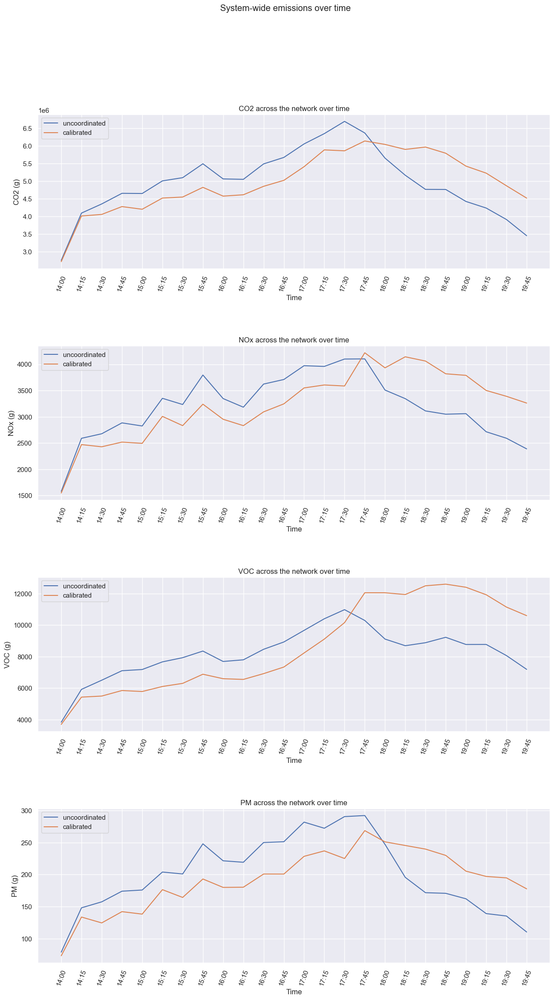

In [ ]:
fig, axs = plt.subplots(4, figsize=(15, 25))
fig.suptitle('System-wide emissions over time')
for i in range(4):
    # for j in range(2):
    ax, metric = axs[i], emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label='coordinated')
    ax.set_title(f'{metric.name} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.show()

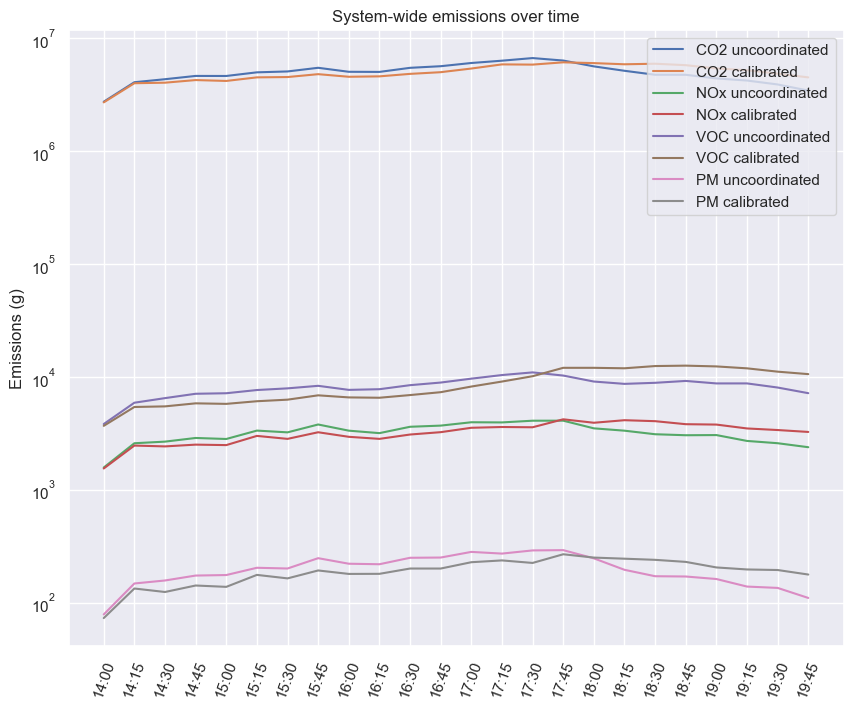

In [ ]:
# dt = 0.01
# x = np.arange(-50.0, 50.0, dt)
# y = np.arange(0, 100.0, dt)
# # plt.subplot(312)
# plt.plot(y, x)
# plt.yscale('symlog')
# plt.ylabel('symlogy')



fig = plt.figure(figsize=(10, 8))
ax = plt.axes()
plt.title('System-wide emissions over time')

for i in range(4):
    metric = emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=f'{metric.name} uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=f'{metric.name} coordinated')

ax.tick_params('x', labelrotation=70)
plt.legend(loc='upper right')
plt.yscale('symlog')
plt.ylabel('Emissions (g)')
plt.savefig(f'{image_path}\\emissions.png',
    bbox_inches='tight', pad_inches=0)
plt.show()


# fig, axs = plt.subplots(4, figsize=(15, 25))
# fig.suptitle('System-wide emissions over time')
# for i in range(4):
#     # for j in range(2):
#     ax, metric = axs[i], emissions_columns[i][0]
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label='coordinated')
#     ax.set_title(f'{metric.name} across the network over time')
#     ax.set_xlabel('Time')
#     ax.set_ylabel(f'{metric.name} ({metric.unit})')
#     ax.legend(loc="upper left")
#     ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

<a id='hcm'></a>
# HCM Trajectory Analysis

* Longitudinal analysis computes for each vehicle in a link during each time step measures, cumulating them for all the time steps required to traverse the link, and then aggregating for all the vehicles that exit from the link during a statistics interval
* Spatial analysis computes for each link and for each lane during each time step measures that involve all the vehicles present, and then aggregating for all the time steps during a statistics interval

In [ ]:
uncoordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', uncoordinated_con)
uncoordinated_hcm_df = pd.DataFrame(uncoordinated_hcm_query)

uncoordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.780573,-1.0,1.0,-1.0,6.020650,...,1.822222,-1.0,7.703775,3.238408,4.556952,1.385575,0.647367,0.304713,1.0,-1.0
1,151642198,257,257,0,1,32.908216,-1.0,3.0,-1.0,20.352714,...,50.525714,-1.0,21.946461,14.480430,18.148699,14.096548,0.186316,0.123443,53.0,-1.0
2,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [ ]:
coordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', coordinated_con)
coordinated_hcm_df = pd.DataFrame(coordinated_hcm_query)

coordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
1,151642198,257,257,0,1,33.050236,-1.0,2.0,-1.0,18.39801,...,46.649841,-1.0,19.744219,14.222321,16.312359,13.524148,0.168761,0.120598,48.0,-1.0
2,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [ ]:
dfs_hcm = {'uncoordinated': uncoordinated_hcm_df, 'coordinated': coordinated_hcm_df}
hcm_columns = {
    'density': Column('density', 'Density of vehicles', 'PCU/km'),
    'los': Column('los', 'Level of service', None),
    'queue_delay': Column('queue_delay', 'Queue delay', 's/veh'),
    'queue_length': Column('queue_length', 'Average queue length', 'veh'),
    'queued_vehicles': Column('queued_vehicles', 'Percent queued vehicles', '%'),
    'segment_delay': Column('segment_delay', 'Segment delay', 's/veh'),
    'stopped_delay': Column('stopped_delay', 'Stopped delay', 's/veh'),
    'nbstops': Column('nbstops', 'Number of stops', None),
    'slow_vehicles': Column('slow_vehicles', 'Percent slow vehicles', '%')
}
hcm_column_names = list(hcm_columns.keys())
group_cols = ['ent', 'eid']

def preprocess_hcm(df):
    for k in hcm_column_names:
        df[k] = df[k].astype(float)
    df['density'] = df['density'] * 0.621      # converting to km
    df['los'] = df['los'].astype(int)
    df = df[hcm_column_names + group_cols]
    return df[df['ent']!=0]

for k, df in dfs_hcm.items():
    dfs_hcm[k] = preprocess_hcm(df)

dfs_hcm['uncoordinated']

,density,los,queue_delay,queue_length,queued_vehicles,segment_delay,stopped_delay,nbstops,slow_vehicles,ent,eid
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302
...,...,...,...,...,...,...,...,...,...,...,...
13411,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150
13412,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433
13413,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544
13414,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332


In [ ]:
dfs_hcm['coordinated']

,density,los,queue_delay,queue_length,queued_vehicles,segment_delay,stopped_delay,nbstops,slow_vehicles,ent,eid
0,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,248
1,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0,1,257
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302
...,...,...,...,...,...,...,...,...,...,...,...
13411,36.192377,3,21.012780,5.320889,68.509613,23.316151,19.146847,0.431019,68.0,24,56150
13412,71.802882,5,59.458151,3.450667,91.656578,60.465783,56.936214,0.191616,91.0,24,56433
13413,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544
13414,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332


Not sure why this has more rows than the originals

In [ ]:
hcm_df = dfs_hcm['uncoordinated'].merge(dfs_hcm['coordinated'], on=group_cols, how='left', suffixes=['_uncoordinated', '_coordinated']).dropna()
hcm_df

,density_uncoordinated,los_uncoordinated,queue_delay_uncoordinated,queue_length_uncoordinated,queued_vehicles_uncoordinated,segment_delay_uncoordinated,stopped_delay_uncoordinated,nbstops_uncoordinated,slow_vehicles_uncoordinated,ent,eid,density_calibrated,los_calibrated,queue_delay_calibrated,queue_length_calibrated,queued_vehicles_calibrated,segment_delay_calibrated,stopped_delay_calibrated,nbstops_calibrated,slow_vehicles_calibrated
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150,36.192377,3,21.012780,5.320889,68.509613,23.316151,19.146847,0.431019,68.0
13460,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433,71.802882,5,59.458151,3.450667,91.656578,60.465783,56.936214,0.191616,91.0
13461,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
13462,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0


In [ ]:
hcm_compare_cols = np.reshape(hcm_column_names.copy(), (3, 3))
hcm_compare_cols

array([['density', 'los', 'queue_delay'],
       ['queue_length', 'queued_vehicles', 'segment_delay'],
       ['stopped_delay', 'nbstops', 'slow_vehicles']], dtype='<U15')

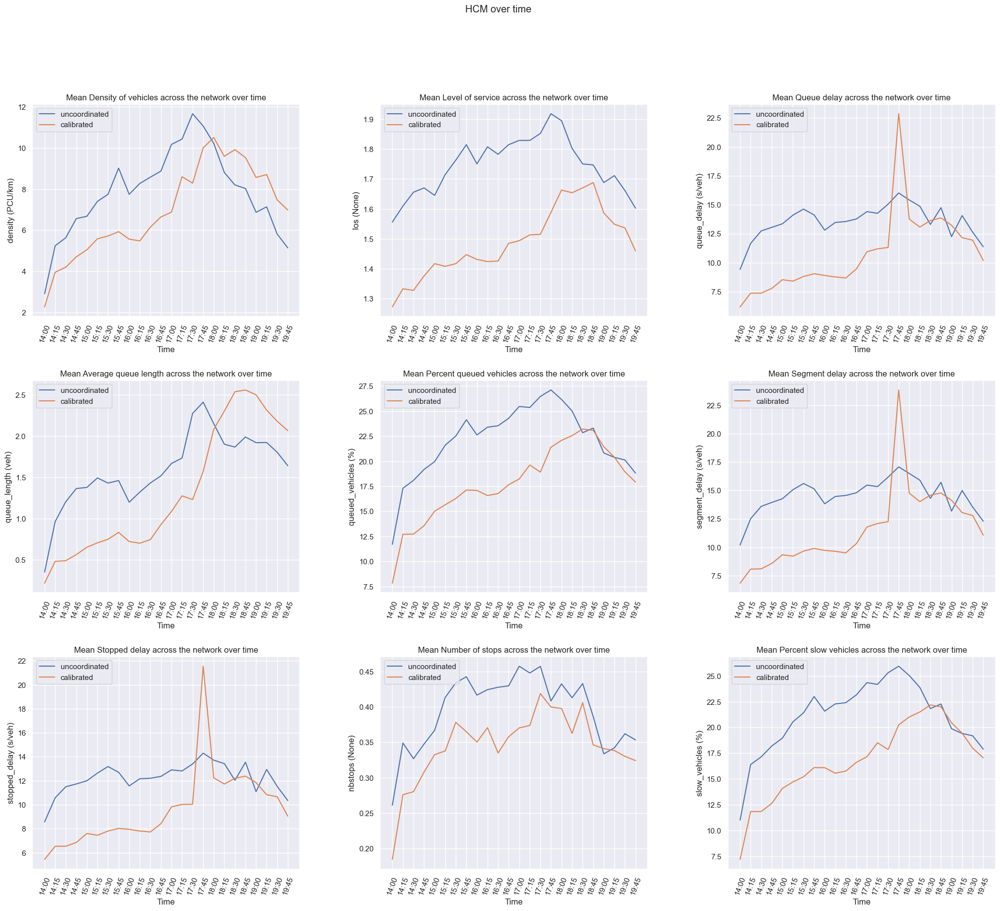

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(25, 20))
fig.suptitle('HCM over time')
for i in range(3):
    for j in range(3):
        ax, metric = axs[i][j], hcm_columns[hcm_compare_cols[i][j]]
        # if metric.name == 'los':
        #     plt.hist([hcm_df[f'{metric.name}_uncoordinated'], hcm_df[f'{metric.name}_uncoordinated']], 
        #         label=['uncoordinated', 'coordinated'])
        #     ax.legend(loc="upper left")
        # else:
        metric_data = hcm_df[['ent', f'{metric.name}_uncoordinated', f'{metric.name}_coordinated']].groupby('ent').mean()
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_uncoordinated'], label='uncoordinated')
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_coordinated'], label='coordinated')
        ax.set_title(f'Mean {metric.desc} across the network over time')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'{metric.name} ({metric.unit})')
        ax.legend(loc="upper left")
        ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

<a id='sys-hcm-patch'></a>
# Patched sys/hcm graphs

In [ ]:
sys_columns = {col.name: col for col in np.reshape(sys_columns, (8,))}
sys_columns

{'density': Column(density, Density, veh/km),
 'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s/km),
 'dtime': Column(dtime, Mean delay time, s/km),
 'speed': Column(speed, Mean speed, km/h),
 'qmean': Column(qmean, Mean vehicles in queue, veh),
 'fuelc': Column(fuelc, Total fuel consumed, L),
 'batteryc': Column(batteryc, Total battery consumed, kWh)}

In [ ]:
hcm_columns

{'density': Column(density, Density of vehicles, PCU/km),
 'los': Column(los, Level of service, None),
 'queue_delay': Column(queue_delay, Queue delay, s/veh),
 'queue_length': Column(queue_length, Average queue length, veh),
 'queued_vehicles': Column(queued_vehicles, Percent queued vehicles, %),
 'segment_delay': Column(segment_delay, Segment delay, s/veh),
 'stopped_delay': Column(stopped_delay, Stopped delay, s/veh),
 'nbstops': Column(nbstops, Number of stops, None),
 'slow_vehicles': Column(slow_vehicles, Percent slow vehicles, %)}

In [ ]:
hcm_df['los_uncoordinated'].unique()

array([1, 3, 2, 4, 5, 6])

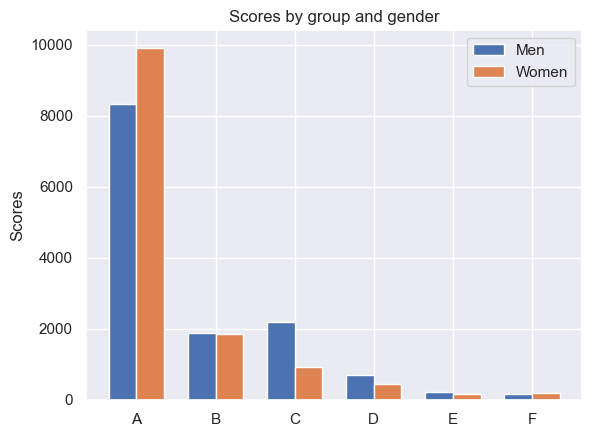

In [ ]:
labels = ['A','B','C','D','E','F']
men_means = hcm_df['los_uncoordinated'].value_counts().sort_index()
women_means = hcm_df['los_coordinated'].value_counts().sort_index()

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, men_means, width, label='Men')
rects2 = ax.bar(x + width/2, women_means, width, label='Women')

ax.set_ylabel('Scores')
ax.set_title('Scores by group and gender')
ax.set_xticks(x, labels)
ax.legend()

plt.show()

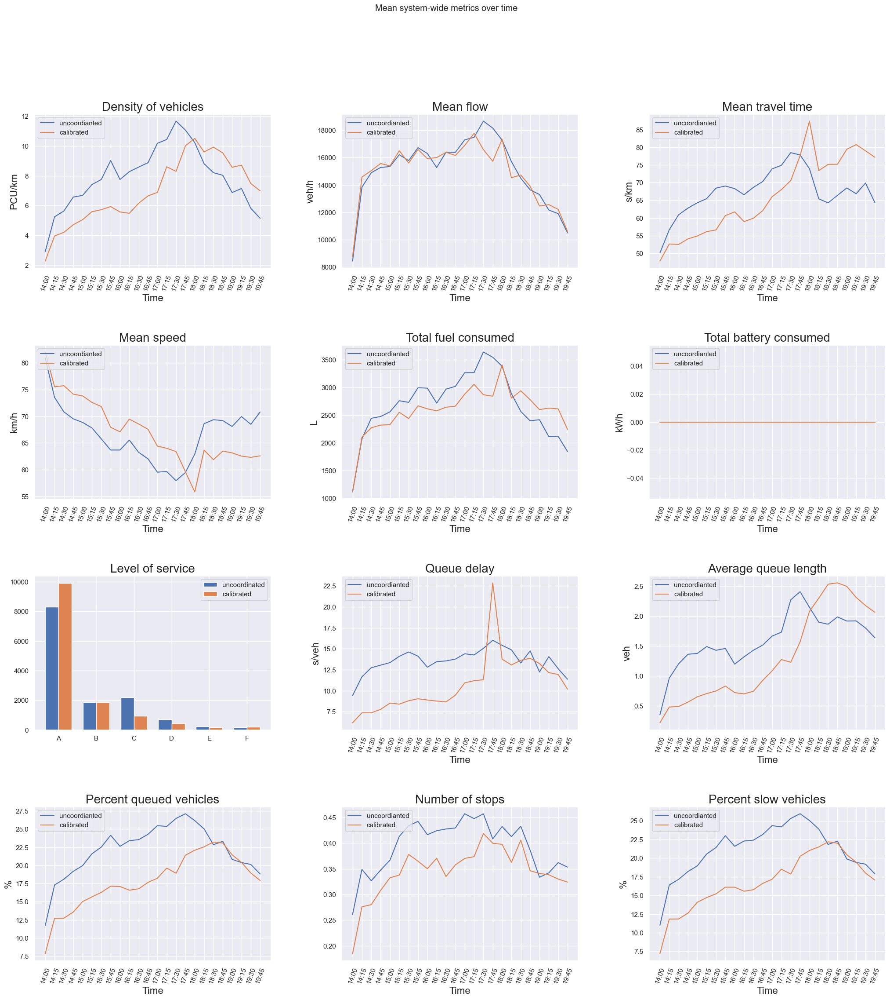

In [ ]:
from matplotlib import rcParams as rc

categorical_labels = {
    'los': {
        1: 'A',
        2: 'B',
        3: 'C',
        4: 'D',
        5: 'E',
        6: 'F'
    }
}

def sys_line_plot(metric, data, ax):
    data_uncoordinated, data_coordinated = data
    ax.plot(TIME_INTERVALS_STRING, data_uncoordinated, label='uncoordianted')
    ax.plot(TIME_INTERVALS_STRING, data_coordinated, label='coordinated')
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_xlabel('Time', size=16)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper left')
    ax.tick_params('x', labelrotation=70)

def sys_bar_plot(metric, data, ax):
    data_uncoordinated, data_coordinated = data
    labels = [categorical_labels[metric.name][label] for label in sorted(data_uncoordinated.unique())]
    width = 0.35
    rects_uncoordinated = ax.bar(
        np.arange(len(labels)) - width/2, data_uncoordinated.value_counts().sort_index(), width, label='uncoordinated')
    rects_coordinated = ax.bar(
        np.arange(len(labels)) + width/2, data_coordinated.value_counts().sort_index(), width, label='coordinated')
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper right')
    ax.set_xticks(x, labels)


fig, axs = plt.subplots(4, 3, figsize=(25, 25))
fig.suptitle('Mean system-wide metrics over time')

sys_hcm_columns = [
    hcm_columns['density'],
    sys_columns['flow'],
    sys_columns['ttime'],
    sys_columns['speed'],
    sys_columns['fuelc'],
    sys_columns['batteryc'],
    hcm_columns['los'],
    hcm_columns['queue_delay'],
    hcm_columns['queue_length'],
    hcm_columns['queued_vehicles'],
    hcm_columns['nbstops'],
    hcm_columns['slow_vehicles']
]

sys_hcm_columns = np.reshape(sys_hcm_columns, (4, 3))

for i in range(4):
    for j in range(3):
        ax, metric = axs[i][j], sys_hcm_columns[i][j]
        if metric.name == 'los':
            data_uncoordinated = hcm_df[f'{metric.name}_uncoordinated']
            data_coordinated = hcm_df[f'{metric.name}_coordinated']
            sys_bar_plot(metric, (data_uncoordinated, data_coordinated), ax)
        elif metric.name in hcm_columns:
            data = hcm_df[['ent', f'{metric.name}_uncoordinated', \
                f'{metric.name}_coordinated']].groupby('ent').mean()
            data_uncoordinated = data[f'{metric.name}_uncoordinated']
            data_coordinated = data[f'{metric.name}_coordinated']
            sys_line_plot(metric, (data_uncoordinated, data_coordinated), ax)
        else:
            data_uncoordinated = sys_df[f'{metric.name}_uncoordinated']
            data_coordinated = sys_df[f'{metric.name}_coordinated']
            sys_line_plot(metric, (data_uncoordinated, data_coordinated), ax)

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.savefig(f'{image_path}\\sys_hcm.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

<a id='rgap'></a>
# RGap

I'm not sure exactly how this works, but I'm assuming that data is collected every minute (due to 361 rows in 6 hours).

In [ ]:
uncoordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', uncoordinated_con)
uncoordinated_rgap_df = pd.DataFrame(uncoordinated_rgap_query)

uncoordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.015156,-1.0,0.028925,-1.0
1,151642198,151642198,None,0,2,0.010300,-1.0,0.013293,-1.0
2,151642198,151642198,None,0,3,0.018570,-1.0,0.028244,-1.0
3,151642198,151642198,None,0,4,0.010625,-1.0,0.016442,-1.0
4,151642198,151642198,None,0,5,0.012213,-1.0,0.010976,-1.0


In [ ]:
coordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', coordinated_con)
coordinated_rgap_df = pd.DataFrame(coordinated_rgap_query)

coordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.012938,-1.0,0.012101,-1.0
1,151642198,151642198,None,0,2,0.014063,-1.0,0.013460,-1.0
2,151642198,151642198,None,0,3,0.012677,-1.0,0.018196,-1.0
3,151642198,151642198,None,0,4,0.007353,-1.0,0.011982,-1.0
4,151642198,151642198,None,0,5,0.006526,-1.0,0.003027,-1.0


In [ ]:
dfs_rgap= {'uncoordinated': uncoordinated_rgap_df, 'coordinated': coordinated_rgap_df}
rgap_columns = {
    'rgapInstantaneous': Column('rgapInstantaneous', 'Instantaneous relative gap', None),
    'rgapExperienced': Column('rgapExperienced', 'Experienced relative gap', None)
}

for k, df in dfs_rgap.items():
    df = df[df['ent']!=0]
    dfs_rgap[k] = df[rgap_columns.keys()]

rgap_df = dfs_rgap['uncoordinated'].join(dfs_rgap['coordinated'], lsuffix='_uncoordinated', rsuffix='_coordinated')
rgap_df

,rgapInstantaneous_uncoordinated,rgapExperienced_uncoordinated,rgapInstantaneous_calibrated,rgapExperienced_calibrated
0,0.015156,0.028925,0.012938,0.012101
1,0.010300,0.013293,0.014063,0.013460
2,0.018570,0.028244,0.012677,0.018196
3,0.010625,0.016442,0.007353,0.011982
4,0.012213,0.010976,0.006526,0.003027
...,...,...,...,...
355,0.040149,0.030278,0.808581,0.081233
356,0.098089,0.089092,0.483354,0.086924
357,0.354563,0.321103,0.131119,0.280918
358,0.090418,0.076703,0.228681,0.164343


In [ ]:
metric_name, metric_units = 'Relative gap', 's'
uncoordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

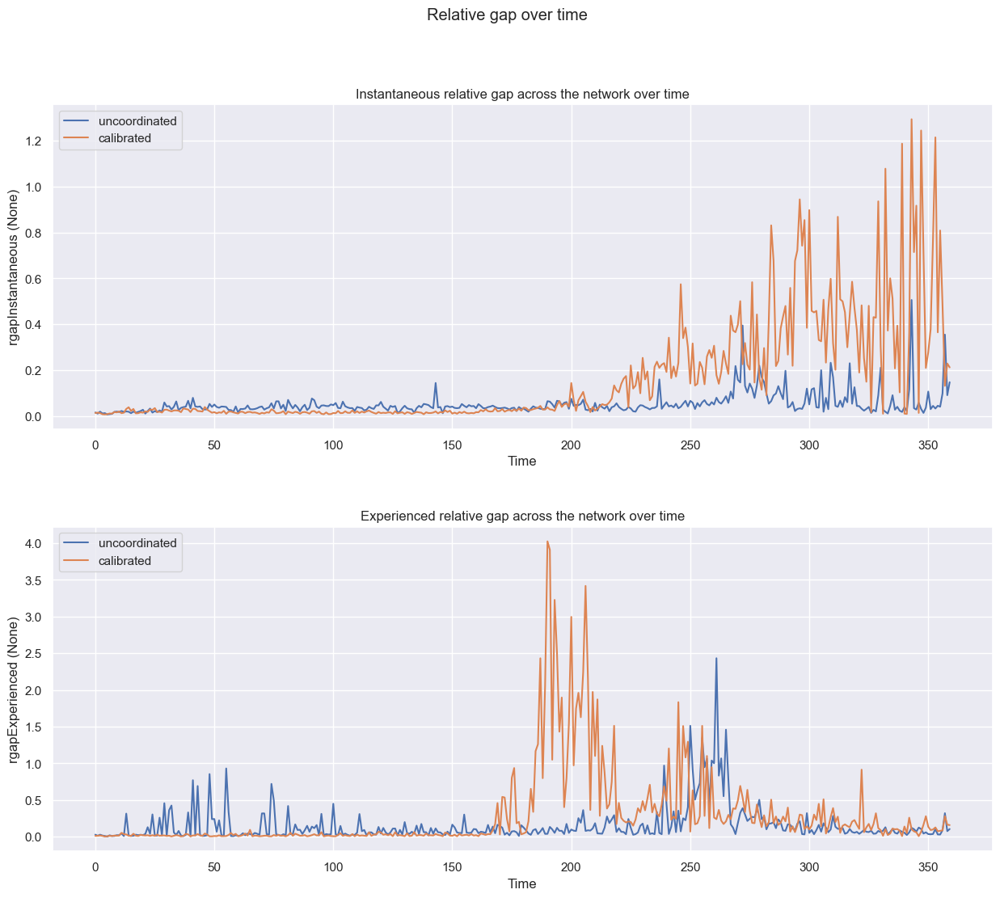

In [ ]:
fig, axs = plt.subplots(2, figsize=(15, 12))
fig.suptitle('Relative gap over time')
for i in range(2):
    ax, metric = axs[i], rgap_columns[list(rgap_columns.keys())[i]]
    ax.plot(rgap_df[f'{metric.name}_uncoordinated'], label='uncoordinated')
    ax.plot(rgap_df[f'{metric.name}_coordinated'], label='coordinated')
    ax.set_title(f'{metric.desc} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    # ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig(f'{image_path}\\rgap.png',
    bbox_inches='tight', pad_inches=0)
plt.show()


# plt.xlabel("Timestep")
# plt.ylabel(f"{metric_name} ({metric_units})")
# plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label='uncoordinated')
# plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label='coordinated')
# plt.legend(loc="upper left")
# plt.xticks(rotation=70)
# plt.show()